In [ ]:
# !sudo apt-get install -y fonts-nanum
# !sudo fc-cache -fv
# !rm ~/.cache/matplotlib -rf

In [ ]:
# import matplotlib.font_manager as fm
# fm.fontManager.ttflist
# [f.name for f in fm.fontManager.ttflist]

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
# NanumGothic
import matplotlib as mpl
# mpl.rcParams['font.family'] = 'Humor Sans'


In [ ]:
data = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/psychopath_data/PersonalityData_ExternalVersion001.csv')

psychopathy            [정신병] <br>
machiavellianism       [마키아벨리즘]<br>
narcissism             [자기애]<br>
openness               [개방 상태]<br>
conscientiousness      [성실함]<br>
extraversion           [외향성]<br>
agreeableness          [친화성]<br>
neuroticism            [신경증]<br>

<br>

var변수들에 관한 내용

1. 계정과 관련된 변수들
예: 팔로워/친구 수의 함수, Klout 점수의 함수 등
→ 이는 소셜 미디어 계정의 영향력이나 활동성을 정량화한 수치입니다.

2. 언어 사용 빈도 기반 변수들
예: 모든 트윗, 답글, 리트윗에 포함된 단어들의 사용 빈도
주로 LIWC (Linguistic Inquiry and Word Count) 도구를 사용하여 특정 단어군의 사용 빈도를 분석한 변수입니다.
예를 들어: ‘i’, ‘we’, ‘posemo’ (긍정 감정), ‘negemo’ (부정 감정) 등의 단어들이 있습니다.

이러한 단어 기반 변수들의 실제 이름도 제공할 수는 있으나, 현실적으로는 단지 단어 목록에 불과하므로 (‘i’, ‘we’, ‘posemo’, ‘negemo’ 등), 대신 변수명을 Var1, Var2 … VarX처럼 부여하는 방식을 선택했습니다.

In [ ]:
pd.set_option('display.max_columns', None)  # 열 전체 출력 가능하게 설정
data.info(verbose=True , show_counts = True )

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2927 entries, 0 to 2926
Data columns (total 109 columns):
 #    Column             Non-Null Count  Dtype  
---   ------             --------------  -----  
 0    uid                2927 non-null   int64  
 1    psychopathy        2927 non-null   float64
 2    machiavellianism   2927 non-null   float64
 3    narcissism         2927 non-null   float64
 4    openness           2927 non-null   float64
 5    conscientiousness  2927 non-null   float64
 6    extraversion       2927 non-null   float64
 7    agreeableness      2927 non-null   float64
 8    neuroticism        2927 non-null   float64
 9    Var1               2593 non-null   float64
 10   Var2               2614 non-null   float64
 11   Var3               2614 non-null   float64
 12   Var4               2614 non-null   float64
 13   Var5               2614 non-null   float64
 14   Var6               2614 non-null   float64
 15   Var7               2614 non-null   float64
 16   Var8

In [ ]:
data['Var20'].value_counts()

,count
Var20,
0,2647
1,279
TRUE,1


 1    psychopathy         
 2    machiavellianism   
 3    narcissism         
 4    openness          
 5    conscientiousness
 6    extraversion     
 7    agreeableness     
 8    neuroticism

In [ ]:
data['Var20'] = pd.to_numeric(data['Var20'], errors='coerce')
data = data.drop(['uid'], axis = 1)
data = data.dropna(axis = 0)
data.drop_duplicates(inplace=True)

## 데이터 검정

가정
  1. 심리데이터는 정규성을 따른다 가정을 해야하는가?
  2. 수치화가 가능한 것들은 중심극한정리를 따른다라고 가정을 할 수 있지만, 심리/성격은 수치화 자체가 불가능한 요소라 본다.
  3. **비모수 검정**.


  | 목적         | 정규성 전제 방법               | 정규성 비전제 방법                                                |
| ---------- | ----------------------- | --------------------------------------------------------- |
| 평균 차이 비교   | t-test, ANOVA           | Mann-Whitney U, Kruskal-Wallis                            |
| 상관관계       | Pearson                 | Spearman                                                  |
| 이상치 탐지     | Z-score, Boxplot        | Robust scaler, IQR, MAD                                   |
| feature 선별 | SelectKBest(f\_classif) | SelectKBest(mutual\_info\_classif), tree-based importance |



비모수 통계 방법이 feature 선별에 적합한가? 가 문제다.
따라서 1차 feaure 선별에 초점을 맞추고자 한다.



- 아니면 결측치 개수 종류는 그룹으로 묶을 수 있다. 이걸 기준으로 익명의 그룹으로 묶는 건 안되나?


In [ ]:
# 월크-샤피로 검정 : 정규성/비정규성 검토
from scipy.stats import shapiro

for c in data.columns:
  stats,p = shapiro(data[c]) # 컬럼 단위로 1차원 데이터 넣기

  result = "정규" if p > 0.05 else "비정규"

  print(f"{c}: 통계량 = {stats:.4f} , p:{p:.4f} > {result}" )

psychopathy: 통계량 = 0.9663 , p:0.0000 > 비정규
machiavellianism: 통계량 = 0.9968 , p:0.0000 > 비정규
narcissism: 통계량 = 0.9959 , p:0.0000 > 비정규
openness: 통계량 = 0.9323 , p:0.0000 > 비정규
conscientiousness: 통계량 = 0.9679 , p:0.0000 > 비정규
extraversion: 통계량 = 0.9653 , p:0.0000 > 비정규
agreeableness: 통계량 = 0.9734 , p:0.0000 > 비정규
neuroticism: 통계량 = 0.9707 , p:0.0000 > 비정규
Var1: 통계량 = 0.9277 , p:0.0000 > 비정규
Var2: 통계량 = 0.2102 , p:0.0000 > 비정규
Var3: 통계량 = 0.2714 , p:0.0000 > 비정규
Var4: 통계량 = 0.3454 , p:0.0000 > 비정규
Var5: 통계량 = 0.4544 , p:0.0000 > 비정규
Var6: 통계량 = 0.6187 , p:0.0000 > 비정규
Var7: 통계량 = 0.7293 , p:0.0000 > 비정규
Var8: 통계량 = 0.7980 , p:0.0000 > 비정규
Var9: 통계량 = 0.6826 , p:0.0000 > 비정규
Var10: 통계량 = 0.4148 , p:0.0000 > 비정규
Var11: 통계량 = 0.8457 , p:0.0000 > 비정규
Var12: 통계량 = 0.7883 , p:0.0000 > 비정규
Var13: 통계량 = 0.9176 , p:0.0000 > 비정규
Var14: 통계량 = 0.5751 , p:0.0000 > 비정규
Var15: 통계량 = 0.9895 , p:0.0000 > 비정규
Var16: 통계량 = 0.9973 , p:0.0003 > 비정규
Var17: 통계량 = 0.9951 , p:0.0000 > 비정규
Var18: 통계량 = 0.3855 , p:0.

In [ ]:
# 스피어만 상관계수
from scipy.stats import spearmanr

spearman_scores = []
spearman_pvals = []

X = data.drop('psychopathy' , axis = 1)
y = data['psychopathy']

for col in X.columns:
  coef , p_val = spearmanr(X[col],y)
  spearman_scores.append(coef)
  spearman_pvals.append(p_val)

  print(f"{col} p:{p_val} spear : {coef}")

machiavellianism p:4.975639835123878e-107 spear : 0.4218325775444724
narcissism p:8.346363300806506e-45 spear : 0.27733487064750767
openness p:0.10424190247723641 spear : 0.032716977542666115
conscientiousness p:1.2221122125987857e-24 spear : -0.20422939505477233
extraversion p:9.452886925720853e-06 spear : 0.08904494657413721
agreeableness p:2.521392661608041e-88 spear : -0.38570697445704494
neuroticism p:3.032548391066683e-06 spear : 0.09383459433042964
Var1 p:0.008139330870860993 spear : 0.05326666644625711
Var2 p:0.0007550665345557849 spear : 0.06778070805190325
Var3 p:0.004816660851419674 spear : 0.056739790698144985
Var4 p:0.0009345551747073738 spear : 0.06659144661321524
Var5 p:0.0008521511855130996 spear : 0.06710846641484025
Var6 p:0.0005870150836954558 spear : 0.0691613512700661
Var7 p:0.000912997348919659 spear : 0.06672249595873209
Var8 p:0.01886975210984682 spear : 0.04727246228145632
Var9 p:3.248436132660103e-05 spear : 0.0835562584891629
Var10 p:1.350279320730844e-05 spe

| 분석 방법                                 | 기준                | 타겟 정의                | 주요 전제                 | 강점           | 뽑히는 feature의 성격     |
| ------------------------------------- | ----------------- | -------------------- | --------------------- | ------------ | ------------------- |
| **비모수 통계** (Spearman, Mann–Whitney 등) | 통계적 유의성 (p-value) | 명시적 타겟 (연속형 또는 그룹)   | 분포 자유, 개별 feature만 평가 | 빠르고 직관적      | 타겟과 직접적 관계 있음 (단변량) |
| **ANOVA** (군집 → 각 feature 평균 차이)      | 군집 간 분산 차이        | 군집 라벨 (비지도)          | 정규성·등분산성 (보통 무시됨)     | 군집 특성 구별     | 군집별 대표성 강한 feature  |
| **SHAP / Feature Importance**         | 모델 예측에 기여한 정도     | 모델이 예측한 값 (연속 or 분류) | 모델 구조 의존              | 상호작용, 비선형 반영 | 예측력 높은 feature      |





# 클러스터링

In [ ]:
data.shape #차원 축소

(2467, 108)

In [ ]:
# !pip install numpy==1.24.4 --force-reinstall

In [ ]:
# !pip uninstall -y numpy numba umap-learn
# !pip install numpy==1.24.4 numba==0.58.1 umap-learn==0.5.3 --force-reinstall


In [ ]:
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler,RobustScaler , MinMaxScaler
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
import pandas as pd
from sklearn.manifold import TSNE
import seaborn as sns
# import umap.umap_ as umap
import numpy as np
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from scipy.cluster.hierarchy import linkage,dendrogram
from scipy.cluster.hierarchy import fcluster
from sklearn.mixture import GaussianMixture
from sklearn.cluster import MeanShift , estimate_bandwidth
from pandas.plotting import parallel_coordinates
import plotly.express as px
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples
from tqdm.auto import tqdm
from collections import Counter
from scipy.stats import ttest_ind
from scipy.stats import shapiro
from scipy.stats import mannwhitneyu
from sklearn.neighbors import NearestNeighbors
import hdbscan
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import davies_bouldin_score


## DBSCAN
- UMAP 데이터 밀도 기반 구조를 잘 보존해서 DBSCAN과 궁합이 좋음

하지만? 패키지 이슈로 tsne

- DBSCAN 군집화는 이상치 처리를 자동감지한다.
그럼 사이코패스라는 데이터 특성을 고려했을 때 , 이 이상치들이 사이코패스이면 , 밀도 기반 군집화를 신뢰해야 하는 것이냐, 거리 기반 이상치들을 신뢰해야 하는 것이냐?


<BR>

- 한 가지 의문이 생기는 점은 밀도 기반 클러스터링을 거리기반 응집도를 계산하는 실루엣 점수로 군집을 평가하는 것이 타당한가?이다.




<BR>


  사이코패스 예측으로 이상치 자체에 관심이 있다. 그래서 DBSCAN을 필수적으로 고려할 수 밖에 없다. 겉보기엔 평범하지만 사이코패스만의 특성이 들어날지도 모르니까 아무래도 거리기반 보다는 밀도 기반이 더 적합하다고 판단했기 때문이다. 하지만 실루엣은 거리기반 응집도를 평가하는 척도이고 이상치를 제거할 수 없는 DBSCAN의 경우 실루엣은 필연적으로 낮아질 수 밖에 없다. 따라서 DBSCAN을 적절하게 평가하려면 다른 평가 방법이 필요하다. 하지만 DBI/CHI(davies_bouldin_score , calinski_harabasz_score
)는  이상치 제거가 필수적이라 내 목적과 맞지 않는다. 따라서 대안으로 선택한 군집 평가방법은 DBCV이다.


  DBCV(Density-Based Clustering Validation index
)
 : 군집의 응집도와 분리도를 모두 밀도로 측정한다.


[참고](https://permetrics.readthedocs.io/en/latest/pages/clustering/DBCVI.html)




<BR>

- 밀도/거리 클러스터링별 군집결과가 확연히 차이가 있다는 점도 신기하다. 어차피 밀도도 결국 거리를 고려할 수 밖에 없는것 아닌가?



- 차이점은 거리 기반 클러스터링의 거리 기준은 군집의 중심점이고, 밀도 기반의 거리는 데이터 각각의 반경이고 이 반경 내 몇 개의 데이터가 포집됐느냐 라는 것이다.
이 ε(엡실론, 반경)의 기준이 우리가 정하는 파라미터들이다.

- 자동화된 방식

  HDBSCAN: DBSCAN의 ε를 자동으로 추정해주는 알고리즘

  OPTICS: ε 없이 밀도 기반 군집화 수행

In [ ]:
DB_copy = data.copy()

In [ ]:
DB_copy.shape

(2467, 108)

In [ ]:
# X_scaled = RobustScaler().fit_transform(DB_copy)
# X_scaled = StandardScaler().fit_transform(DB_copy)
X_scaled = DB_copy
X_PCA = PCA(n_components=2, random_state=42).fit_transform(X_scaled)

dbscan = DBSCAN(eps=891, min_samples=20)
DB_labels = dbscan.fit_predict(X_scaled)

# 결과 저장
pca_db = pd.DataFrame(X_PCA , columns= ['TSNE1', 'TSNE2'])
pca_db['cluster'] = DB_labels

df_with_cluster = pd.DataFrame(X_scaled)
df_with_cluster['cluster'] = DB_labels


In [ ]:
# pca_db['cluster'].value_counts()
df_with_cluster['cluster'].value_counts()


,count
cluster,
0,2292
-1,153
1,22


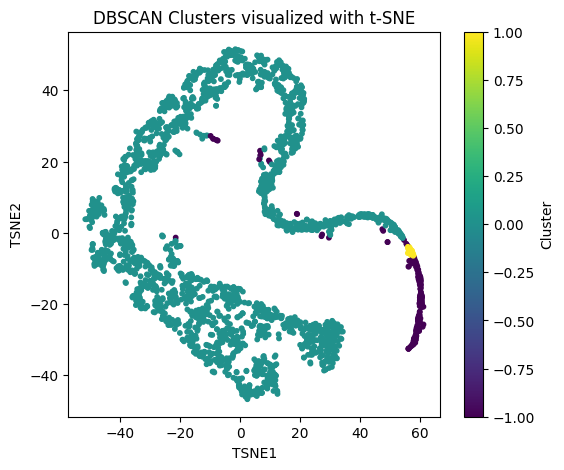

In [ ]:
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(DB_copy)  # 원본 사용


plt.figure(figsize=(6,5))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=DB_labels, cmap='viridis', s=10)
plt.title("DBSCAN Clusters visualized with t-SNE")
plt.xlabel("TSNE1")
plt.ylabel("TSNE2")
plt.colorbar(label='Cluster')
plt.show()

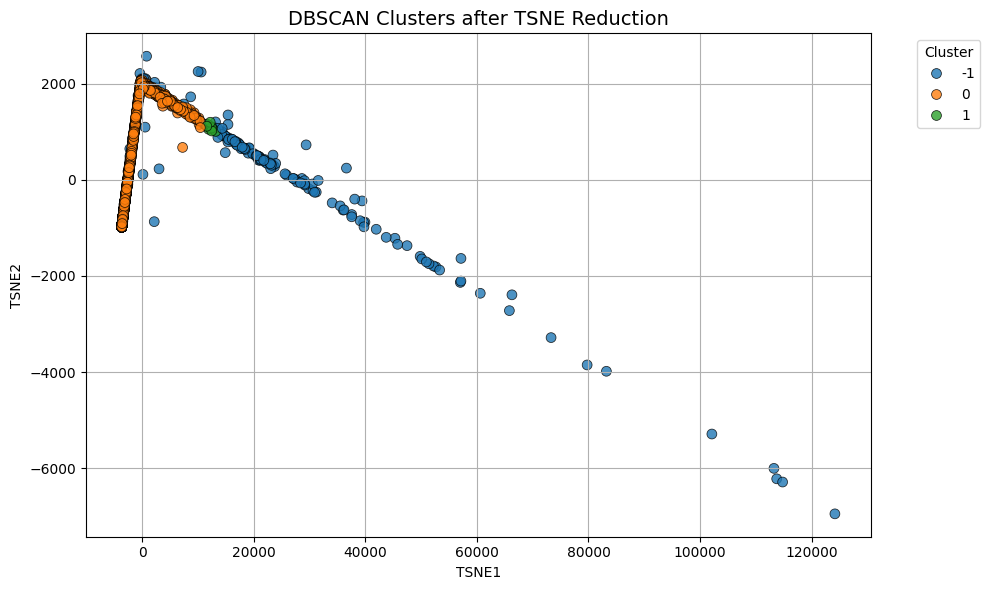

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=pca_db, x="TSNE1", y="TSNE2", hue="cluster",
    palette="tab10", s=50, edgecolor="k", alpha=0.8
)
plt.title("DBSCAN Clusters after TSNE Reduction", fontsize=14)
plt.legend(title="Cluster", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.grid(True)
plt.show()

클러스터 평가지표

In [ ]:
# score = silhouette_score(pca_db[['TSNE1', 'TSNE2']], DB_labels)
# print(f"Silhouette Score: {score:.2f}")

sil_score = silhouette_score(X_scaled, DB_labels)
print(f"Silhouette Score: {sil_score:.4f}")

Silhouette Score: 0.6925


In [ ]:
mask = DB_labels != -1
score_filtered = silhouette_score(X_scaled[mask], DB_labels[mask])
print(f"노이즈 제외 실루엣 점수: {score_filtered:.4f}")

노이즈 제외 실루엣 점수: 0.7630


In [ ]:
!pip install permetrics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.6/52.6 kB 2.4 MB/s eta 0:00:00


In [ ]:
!pip install kneed

In [ ]:
from kneed import KneeLocator
from permetrics import ClusteringMetric

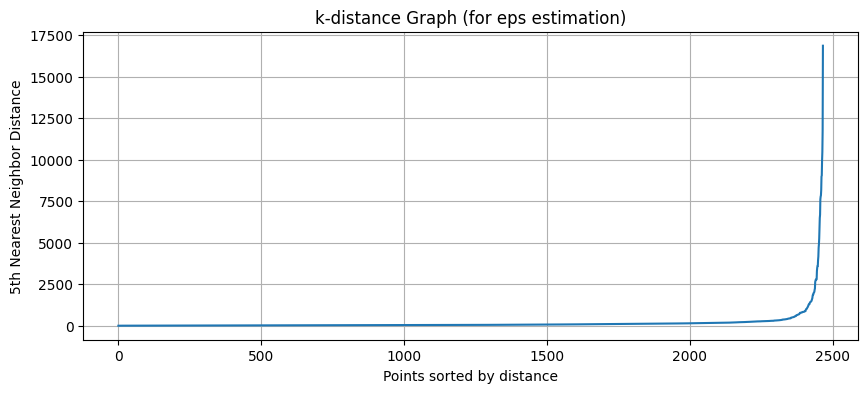

추천 eps 값: 891.4457591366994


In [ ]:
nbrs = NearestNeighbors(n_neighbors=3).fit(X_scaled)
distances, _ = nbrs.kneighbors(X_scaled)
distances = np.sort(distances[:, 2])

plt.figure(figsize=(10, 4))
plt.plot(distances)
plt.title("k-distance Graph (for eps estimation)")
plt.xlabel("Points sorted by distance")
plt.ylabel("5th Nearest Neighbor Distance")
plt.grid()
plt.show()


# distances는 _번째 이웃 거리의 오름차순 배열
kneedle = KneeLocator(
    x=range(len(distances)),
    y=distances,
    curve='convex',
    direction='increasing'
)
eps_candidate = kneedle.knee_y  # 또는 kneedle.knee
print(f"추천 eps 값: {eps_candidate}")


In [ ]:
cm = ClusteringMetric(X= X_scaled.values, y_pred=DB_labels)
score = cm.DBCVI()
print(f"DBCVI 점수: {score:.4f}")

/usr/local/lib/python3.11/dist-packages/numpy/_core/fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.11/dist-packages/numpy/_core/_methods.py:130: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(


DBCVI 점수: nan


## HDBSCAN

In [ ]:
# X_scaled = RobustScaler().fit_transform(DB_copy)

pca = PCA(n_components= 2 , random_state= 42)
X_pca = pca.fit_transform(DB_copy)

clusterer = hdbscan.HDBSCAN(min_cluster_size=20, min_samples=30, gen_min_span_tree=True , cluster_selection_epsilon=0.05)
hdb_labels = clusterer.fit_predict(X_pca)

cluster_counts = pd.Series(hdb_labels).value_counts().sort_index()
print("클러스터 분포:\n", cluster_counts)

클러스터 분포:
 -1     1194
 0       59
 1      116
 2       24
 3       58
 4       43
 5       77
 6       27
 7       70
 8       26
 9       61
 10     712
Name: count, dtype: int64


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


In [ ]:
cm = ClusteringMetric(X=DB_copy.values, y_pred=hdb_labels)
score = cm.DBCVI()
print(f"DBCVI 점수: {score:.4f}")

SILL = silhouette_score(X_scaled , hdb_labels)
print(SILL)

/usr/local/lib/python3.11/dist-packages/numpy/_core/fromnumeric.py:3596: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/usr/local/lib/python3.11/dist-packages/numpy/_core/_methods.py:130: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(


DBCVI 점수: nan
-0.3432902101955462


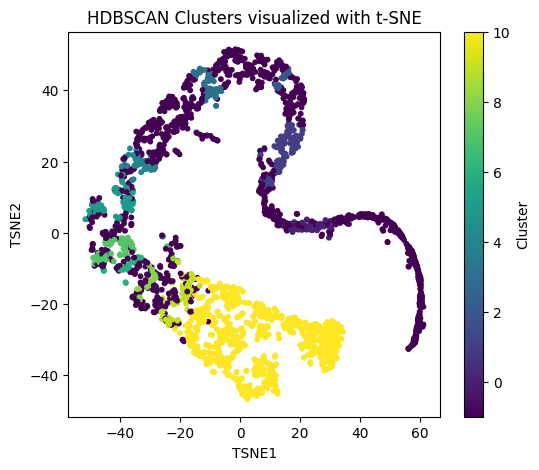

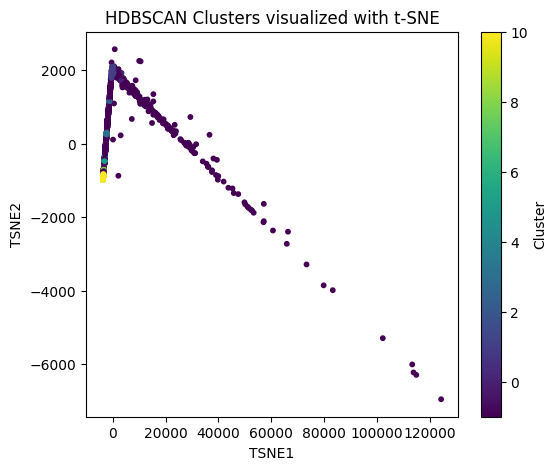

In [ ]:
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(DB_copy)  # 원본 사용


plt.figure(figsize=(6,5))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=hdb_labels, cmap='viridis', s=10)
plt.title("HDBSCAN Clusters visualized with t-SNE")
plt.xlabel("TSNE1")
plt.ylabel("TSNE2")
plt.colorbar(label='Cluster')
plt.show()


plt.figure(figsize=(6,5))
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=hdb_labels, cmap='viridis', s=10)
plt.title("HDBSCAN Clusters visualized with t-SNE")
plt.xlabel("TSNE1")
plt.ylabel("TSNE2")
plt.colorbar(label='Cluster')
plt.show()

In [ ]:
# summary = pca_db.groupby('cluster').mean().T
# display(summary)

In [ ]:
# for col in pca_db.columns[:-1]:
#   sns.boxplot( x = 'cluster', y = col , data = pca_db)
#   plt.title(f'Distribution of {col} by Cluster')
#   plt.show()


DBSCAN / HDBSCAN이 비정상값이 외곽밀도로 표현되어서 군집화가 잘 진행될 줄 알았는데 아니다. 추천 eps값도 890-1500 사이로 비정상적인 수치가 나온다.

심지어 스케일링을 하면 군집화 자체가 진행이 안된다. 모두 1이거나 0: 2466 -1: 1 로 나온다. 후자의 경우는 실루엣 평가를 하면 당연히 0.99 정도로 나온다.

스케일링 없이 원본을 진행한다해도 실루엣은 0.6 - 0.7 정도이고 DVCVI는 NAN 평가자체를 못한다는 말이다.

이런 결과물을 종합해서 평가하자면
1.  데이터 구조는 대부분이 한 덩어리로 몰려있다.
2. 이상치 탐지 자체가 안되는 상황이다.
3. EPS 890은 본질적으로 밀도 자체가 깨진 상황이다.
4. 군집화가 됐다하더라도 매우 불균형이라 유효 군집이 없다.
5. 밀도 차이는 심하지 않다.
6. 사이코패스는 거리상 외곽 데이터가 아니다.-> 행동상 이질




<BR>

사이코패스는 정상인으로 위장하기 때문에 라는 가설은 어느정도 설득이 있지만 이 데이터는 익명성으로 철저히 무장된 트위터 사용과의 관계다. 익명성 아래의 사이버 공간에서 정상인으로 위장할 필요가 있을까? 정상인 또한 정상적으로 커뮤니티 사용을 할까?라는 점이다.

## Mean Shift

In [ ]:
MS_copy = data.copy()

In [ ]:
# X_scaled = RobustScaler().fit_transform(MS_copy)

X_scaled = MS_copy

pca = PCA(n_components=2, random_state=42)
X_pca = pca.fit_transform(X_scaled)

bandwidth = estimate_bandwidth(X_pca , quantile= 0.8 , n_samples = 500)

meanshift = MeanShift(bandwidth= bandwidth)
ms_labels = meanshift.fit_predict(X_pca)

tsne_ms = pd.DataFrame(X_pca , columns = ['TSNE1', 'TSNE2'])
tsne_ms['cluster'] = ms_labels

score = silhouette_score(X_pca , ms_labels)
print(f"silhouette_score: {score:.2f}")
print(f"Total explained variance ratio: {sum(pca.explained_variance_ratio_):.4f}")

silhouette_score: 0.83
Total explained variance ratio: 0.9935


In [ ]:
score = calinski_harabasz_score(X_pca, ms_labels)
print(f"Calinski-Harabasz Score: {score:.2f}")

Calinski-Harabasz Score: 1934.10


In [ ]:
score = davies_bouldin_score(X_pca , ms_labels)
print(f"Davies-Bouldin Index: {score:.3f}")

Davies-Bouldin Index: 0.264


1. Silhouette Score (실루엣 점수)
  - *샘플 단위*로 자기 군집의 응집도와 다른 군집과의 분리도를 비교하는 척도
  - 자기 집단 안은 가까울수록 , 바깥 집단과는 멀수록 점수가 올라간다.

2. Davies-Bouldin Index (DBI)
- *군집 간 쌍* 비교로, 각 군집간의 응집과 분리도를 비교
- 응집도 : 각 군집 **내부**의 샘플들이 중심으로 얼만 모여 있는지
  - 샘플 ↔ 중심 거리
  
- 분리도 : 서로 다른 군집들의 중심 사이의 거리
 - 중심 ↔ 중심 거리

- 응집도는 군집 내의 샘플들 ↔ 군집 중심 거리
- 분리도는 군집 중심 ↔ 다른 군집 중심 거리

-> 응집도는 작을수록 , 분리도는 클수록 dbi가 작아져서 좋은 군집

3. Calinski-Harabasz Index (CHI)
- 전체 데이터에 대한 군집 간 분산과 군집 내부 분산의 비율
- 보완성: 데이터 전체의 구조를 보는 데 강점이 있어서 거시적 군집 품질 판단에 유리

In [ ]:
tsne_ms['cluster'].value_counts()

,count
cluster,
0,2339
1,89
2,16
3,12
6,3
4,3
5,2
8,1
9,1


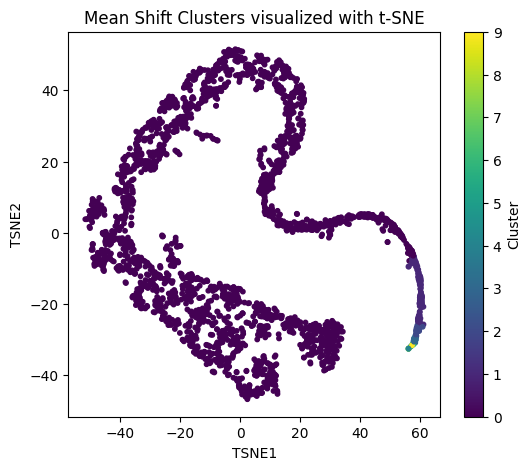

In [ ]:
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X_scaled)  # 원본 사용


plt.figure(figsize=(6,5))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=ms_labels, cmap='viridis', s=10)
plt.title("Mean Shift Clusters visualized with t-SNE")
plt.xlabel("TSNE1")
plt.ylabel("TSNE2")
plt.colorbar(label='Cluster')
plt.show()

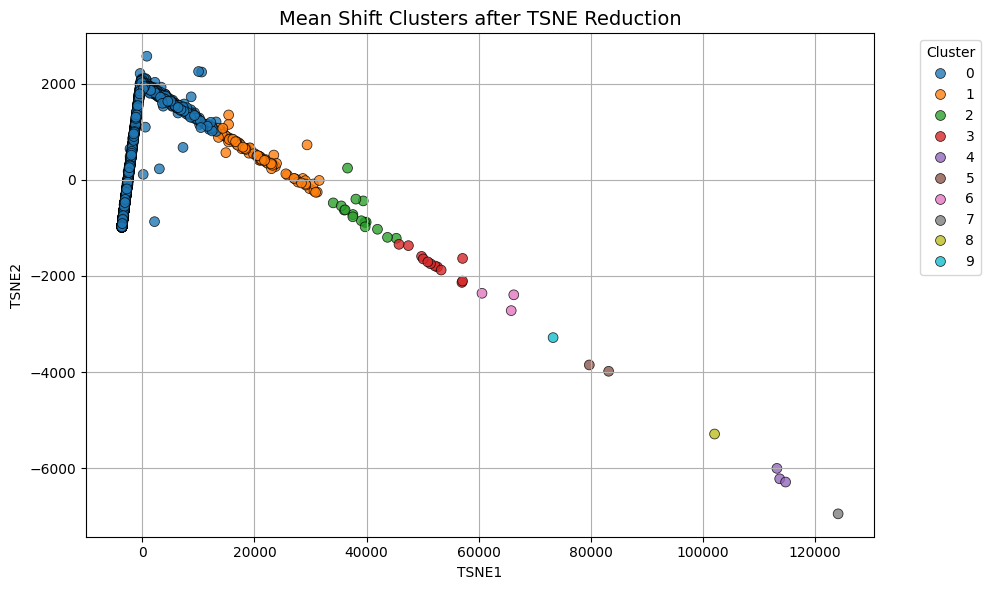

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(
    data=tsne_ms, x="TSNE1", y="TSNE2", hue="cluster",
    palette="tab10", s=50, edgecolor="k", alpha=0.8
)
plt.title("Mean Shift Clusters after TSNE Reduction", fontsize=14)
plt.legend(title="Cluster", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()
plt.grid(True)
plt.show()

In [ ]:
summary = tsne_ms.groupby('cluster').median().T
display(summary)

cluster,0,1,2,3,4,5,6,7,8,9
TSNE1,-3110.408742,19808.019430,38582.449922,51815.489663,113737.677545,81485.722742,65820.418987,124168.453421,102116.163851,73296.116372
TSNE2,-479.724844,553.182258,-746.828492,-1728.071385,-6221.326544,-3918.349600,-2393.457246,-6950.212522,-5289.680376,-3283.868026


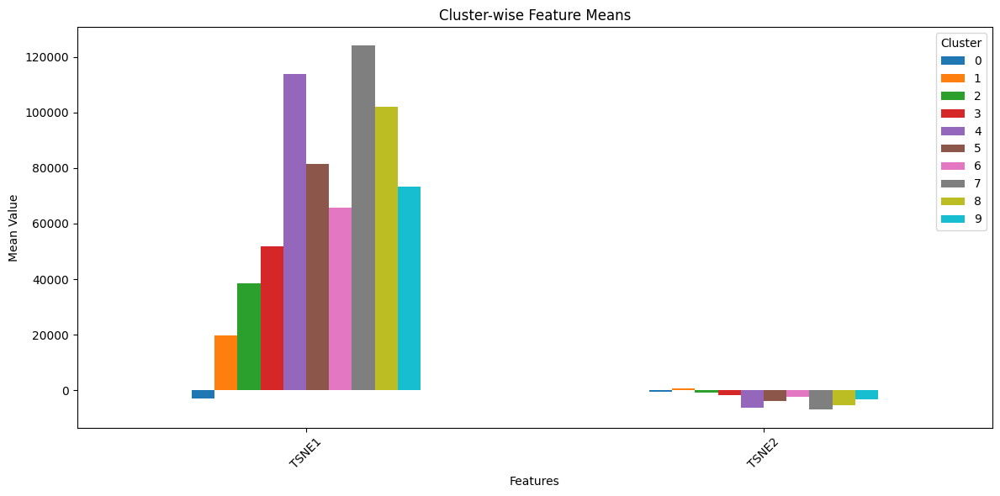

In [ ]:
summary.plot(kind='bar', figsize=(12, 6))
plt.title('Cluster-wise Feature Means')
plt.xlabel('Features')
plt.ylabel('Mean Value')
plt.xticks(rotation=45)
plt.legend(title='Cluster')
plt.tight_layout()
plt.show()


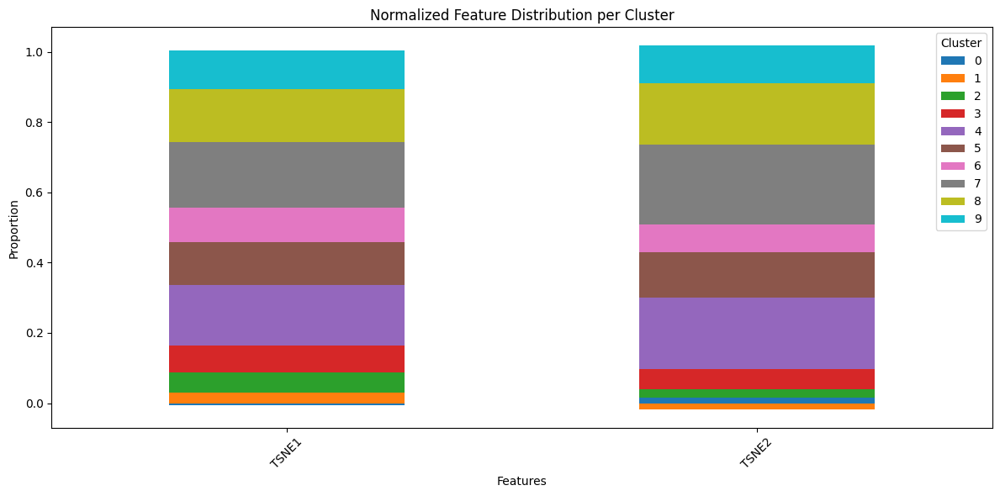

In [ ]:
summary_norm = summary.div(summary.sum(axis=1), axis=0)  # 각 변수 기준 정규화
summary_norm.plot(kind='bar', stacked=True, figsize=(12,6))
plt.title('Normalized Feature Distribution per Cluster')
plt.xlabel('Features')
plt.ylabel('Proportion')
plt.xticks(rotation=45)
plt.legend(title='Cluster')
plt.tight_layout()
plt.show()


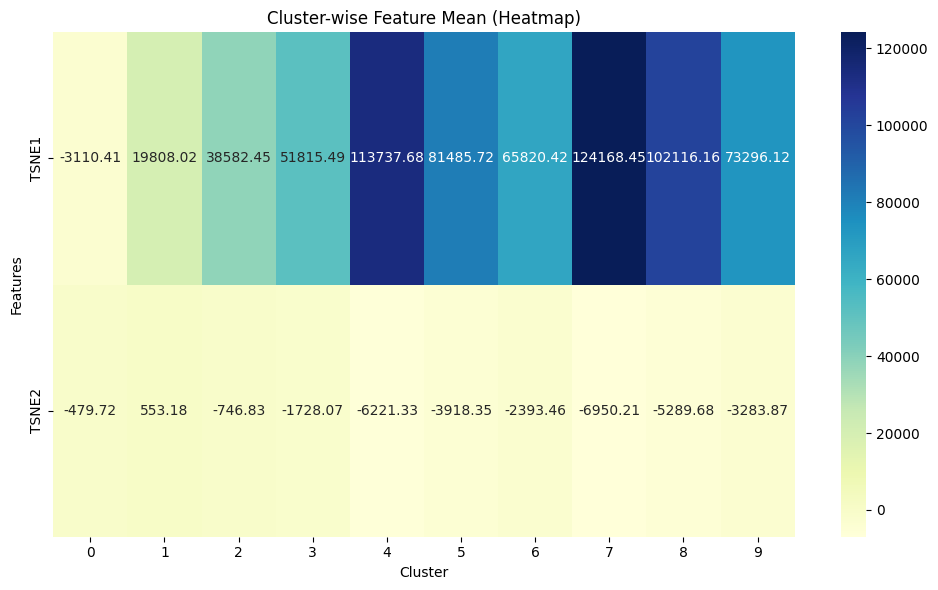

In [ ]:
plt.figure(figsize=(10, 6))
sns.heatmap(summary, annot=True, fmt=".2f", cmap="YlGnBu")
plt.title("Cluster-wise Feature Mean (Heatmap)")
plt.ylabel("Features")
plt.xlabel("Cluster")
plt.tight_layout()
plt.show()


In [ ]:
# 원래 데이터에 cluster 라벨 붙이기
MS_copy['cluster'] = ms_labels

In [ ]:
ms_summary = MS_copy.groupby('cluster').median().T
ms_summary

cluster,0,1,2,3,4,5,6,7,8,9
psychopathy,1.888889,2.000000,2.166667,2.166667,2.222222,1.833333,1.333333,2.111111,1.666667,1.555556
machiavellianism,2.800000,2.700000,3.300000,2.650000,2.500000,2.650000,2.800000,2.600000,1.800000,2.600000
narcissism,2.777778,2.888889,3.000000,3.055556,2.444444,3.000000,3.222222,2.666667,2.555556,2.111111
openness,5.500000,6.000000,5.250000,6.000000,5.000000,5.750000,7.000000,6.500000,5.000000,3.000000
conscientiousness,4.500000,5.000000,4.500000,3.250000,4.500000,3.750000,4.000000,6.000000,5.000000,2.500000
...,...,...,...,...,...,...,...,...,...,...
Var96,0.620000,0.710000,0.800000,0.895000,0.310000,0.510000,0.350000,0.660000,0.830000,1.100000
Var97,2.810000,3.240000,3.505000,3.430000,0.790000,3.550000,3.480000,1.260000,3.680000,3.760000
Var98,0.330000,0.370000,0.490000,0.430000,0.680000,0.405000,0.230000,0.460000,0.290000,0.370000
Var99,12.390000,13.900000,16.160000,15.530000,23.060000,14.855000,12.980000,26.570000,11.910000,11.570000


/tmp/ipython-input-56-121589277.py:14: UserWarning: Glyph 53364 (\N{HANGUL SYLLABLE KEUL}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-56-121589277.py:14: UserWarning: Glyph 47084 (\N{HANGUL SYLLABLE REO}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-56-121589277.py:14: UserWarning: Glyph 49828 (\N{HANGUL SYLLABLE SEU}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-56-121589277.py:14: UserWarning: Glyph 53552 (\N{HANGUL SYLLABLE TEO}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-56-121589277.py:14: UserWarning: Glyph 48324 (\N{HANGUL SYLLABLE BYEOL}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-56-121589277.py:14: UserWarning: Glyph 48320 (\N{HANGUL SYLLABLE BYEON}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-56-121589277.py:14: UserWarning: Glyph 49688 (\N{HANGUL SYLLABLE SU}) missing from font(s) DejaVu Sans.
  

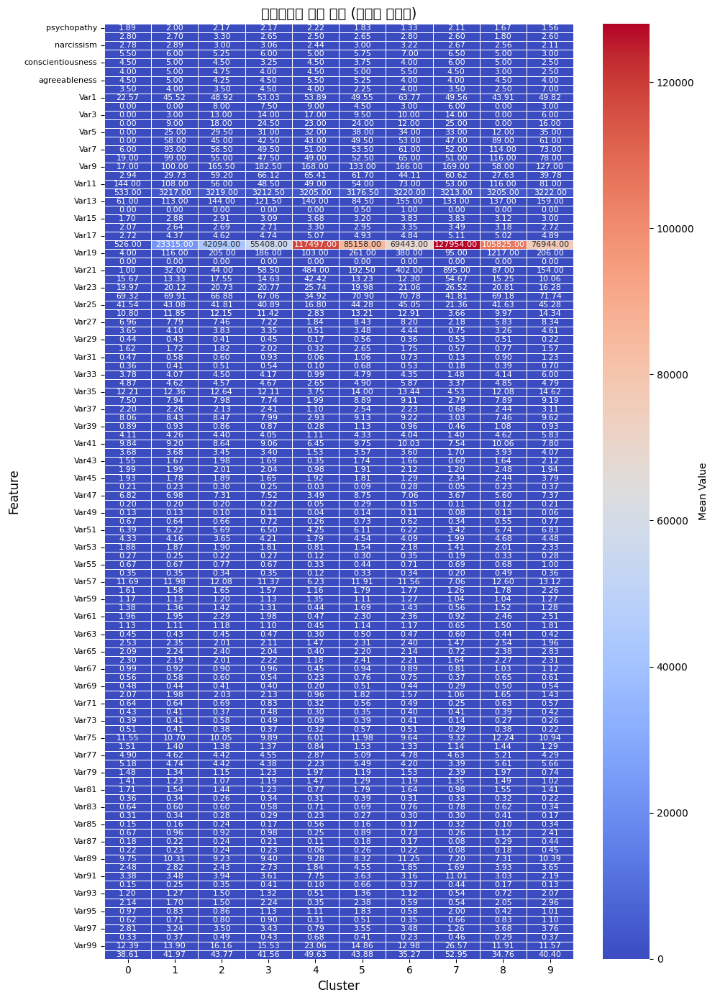

In [ ]:
plt.figure(figsize=(10, 14))
sns.heatmap(ms_summary,
            annot=True,
            fmt=".2f",
            cmap='coolwarm',
            linewidths=0.5,
            cbar_kws={'label': 'Mean Value'},
            annot_kws={"size": 8})
plt.title("클러스터별 변수 평균 (정렬된 히트맵)", fontsize=14)
plt.ylabel("Feature", fontsize=12)
plt.xlabel("Cluster", fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=8, rotation=0)
plt.tight_layout()
plt.show()

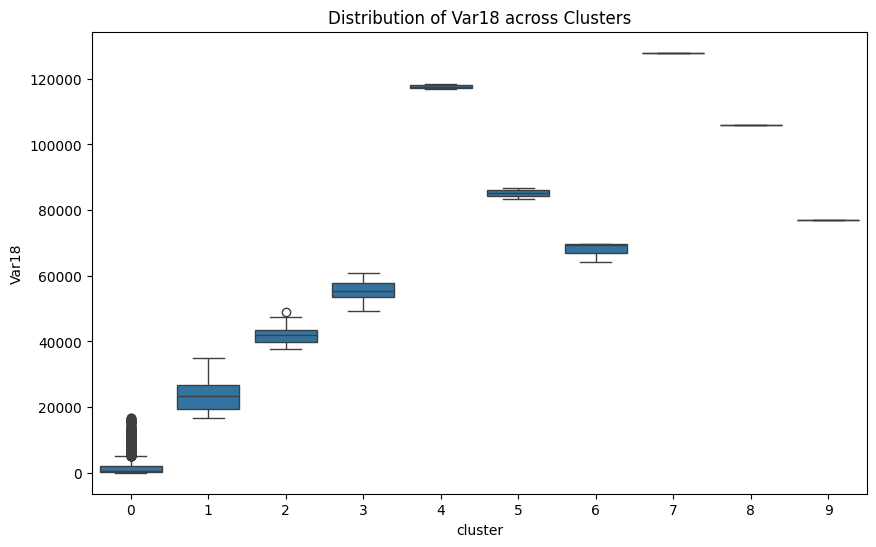

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='cluster', y='Var18', data=MS_copy)  # df는 Var18과 'cluster' 열을 포함해야 함
plt.title("Distribution of Var18 across Clusters")
plt.show()

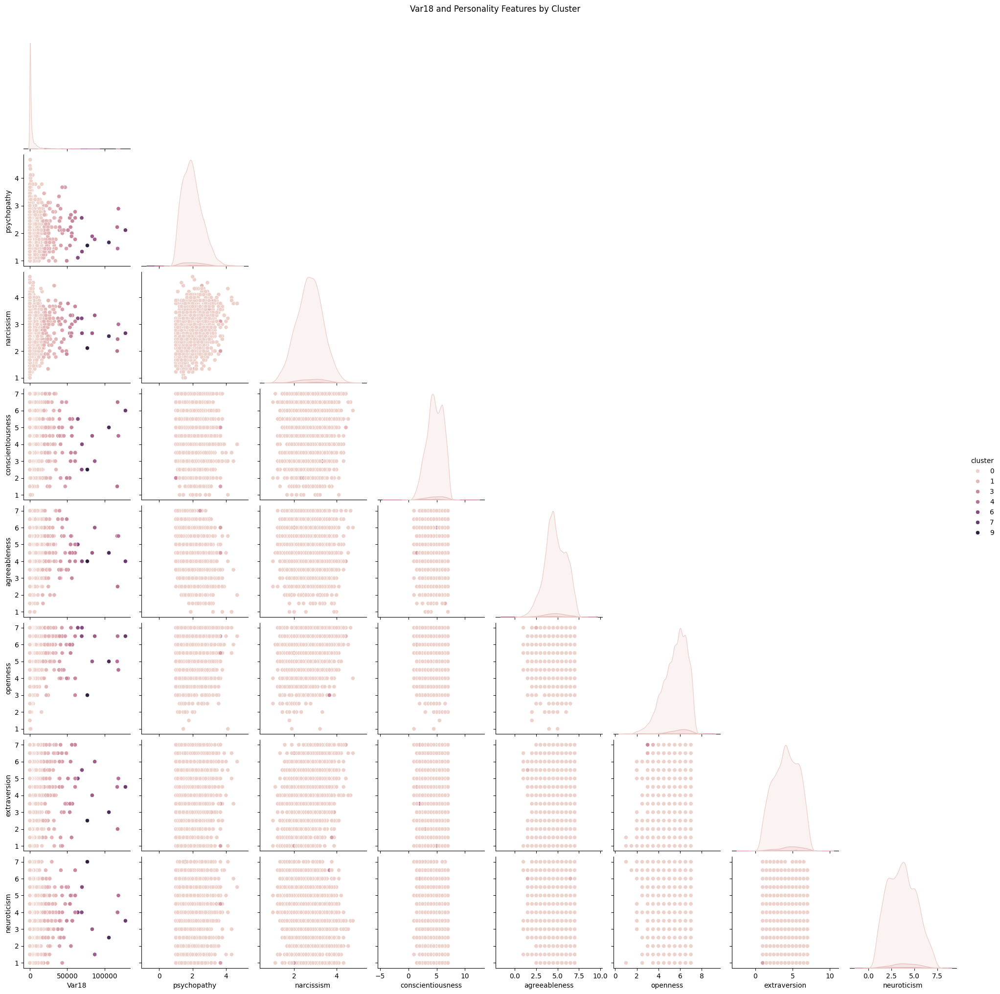

In [ ]:
selected_features = ['Var18', 'psychopathy', 'narcissism', 'conscientiousness',
                     'agreeableness', 'openness', 'extraversion', 'neuroticism']

sns.pairplot(MS_copy[selected_features + ['cluster']], hue='cluster', corner=True)
plt.suptitle("Var18 and Personality Features by Cluster", y=1.02)
plt.show()


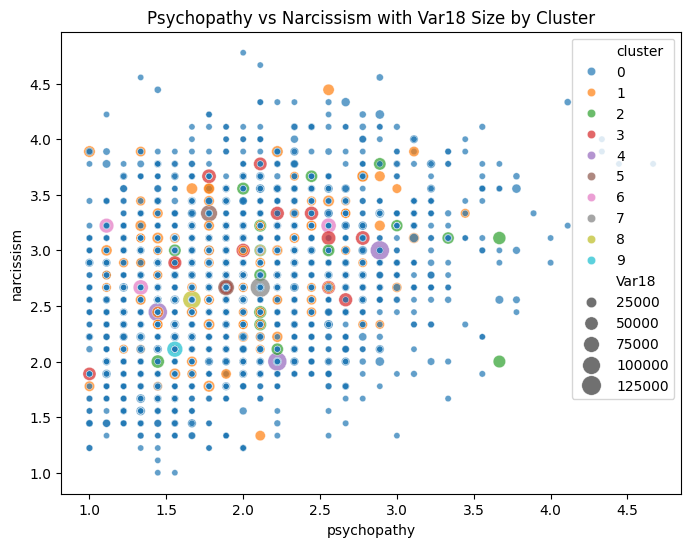

In [ ]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x='psychopathy', y='narcissism', hue='cluster', size='Var18', data=MS_copy, palette='tab10', sizes=(20, 200), alpha=0.7)
plt.title("Psychopathy vs Narcissism with Var18 Size by Cluster")
plt.show()


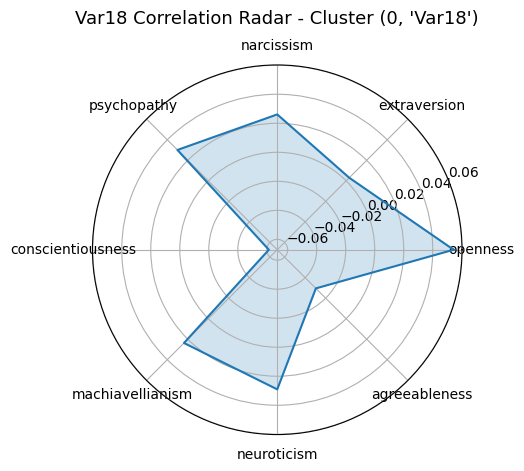

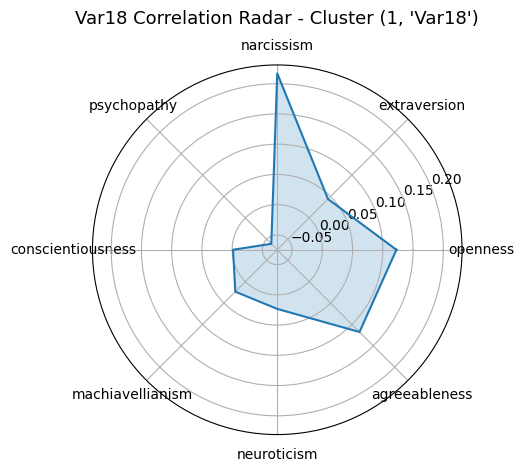

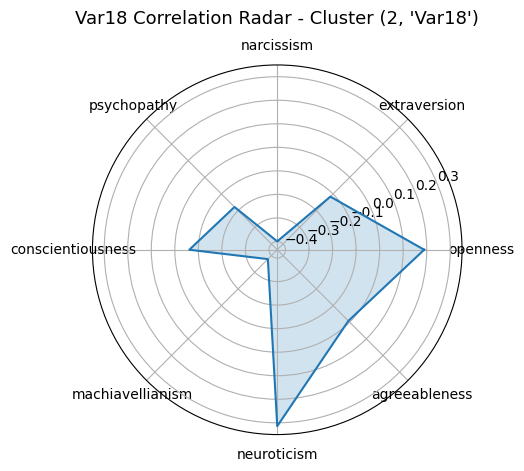

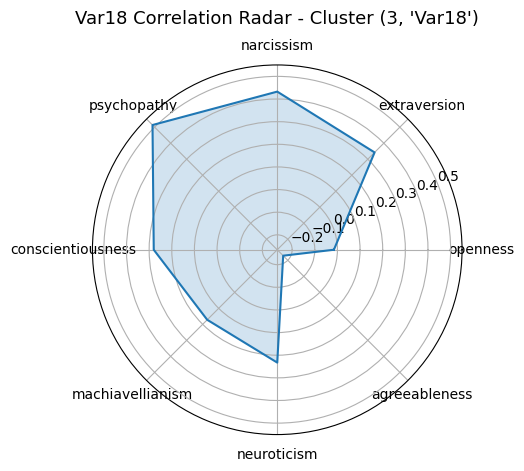

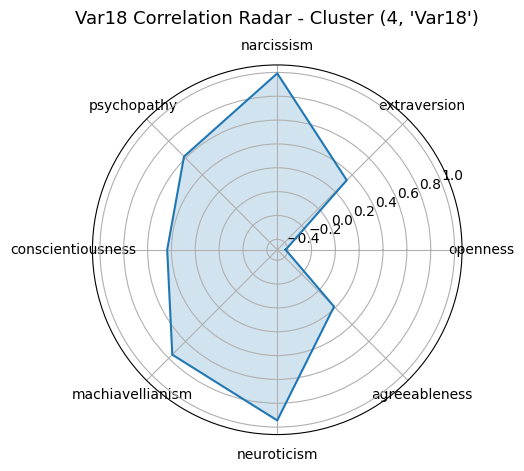

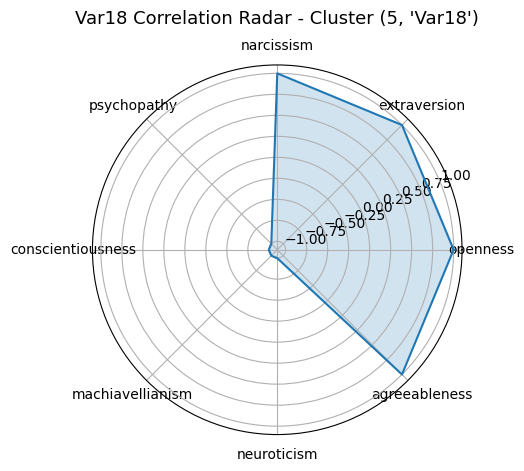

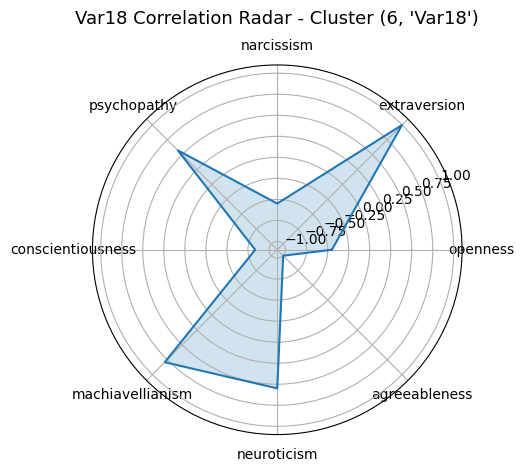

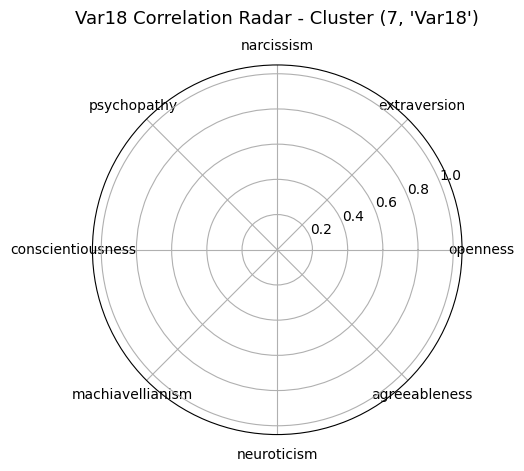

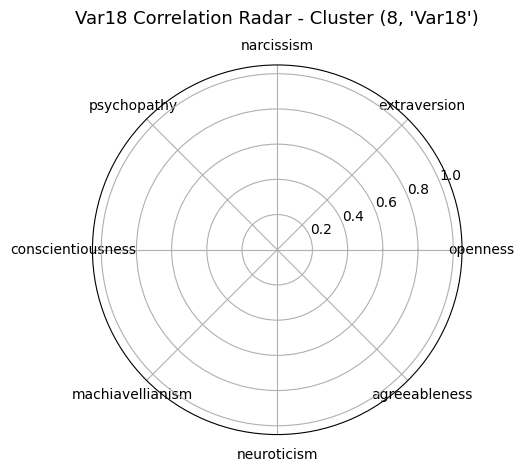

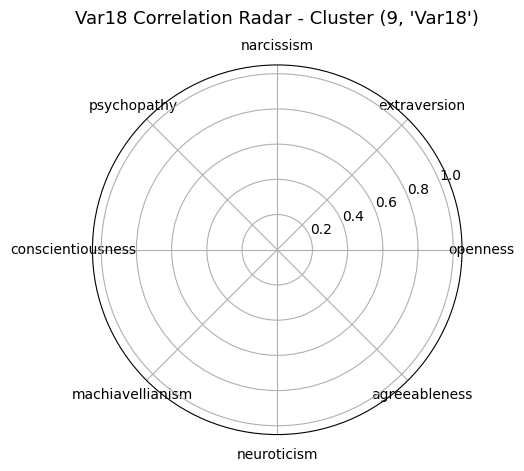

In [ ]:
# 상관관계 계산
features = ['openness', 'extraversion', 'narcissism', 'psychopathy', 'conscientiousness' , 'machiavellianism','neuroticism','agreeableness']

radar_data = MS_copy.groupby('cluster')[['Var18'] + features].corr().iloc[0::len(features)+1,1:]  # Var18과만 상관
radar_data.index.name = 'cluster'

# 시각화
for c in radar_data.index:
    values = radar_data.loc[c].tolist()
    labels = radar_data.columns.tolist()
    angles = np.linspace(0, 2*np.pi, len(labels), endpoint=False).tolist()
    values += values[:1]
    angles += angles[:1]

    fig, ax = plt.subplots(subplot_kw={'polar': True})
    ax.plot(angles, values, label=f'Cluster {c}')
    ax.fill(angles, values, alpha=0.2)
    ax.set_title(f"Var18 Correlation Radar - Cluster {c}" ,fontsize=13 , pad = 30 )
    ax.set_thetagrids(np.degrees(angles[:-1]), labels)
    plt.show()


/tmp/ipython-input-61-474145460.py:13: UserWarning: Glyph 49345 (\N{HANGUL SYLLABLE SANG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-61-474145460.py:13: UserWarning: Glyph 50948 (\N{HANGUL SYLLABLE WI}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-61-474145460.py:13: UserWarning: Glyph 44060 (\N{HANGUL SYLLABLE GAE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-61-474145460.py:13: UserWarning: Glyph 48320 (\N{HANGUL SYLLABLE BYEON}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-61-474145460.py:13: UserWarning: Glyph 53364 (\N{HANGUL SYLLABLE KEUL}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-61-474145460.py:13: UserWarning: Glyph 47084 (\N{HANGUL SYLLABLE REO}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-61-474145460.py:13: UserWarning: Glyph 49828 (\N{HANGUL SYLLABLE SEU}) missing from font(s) DejaVu Sans.
  p

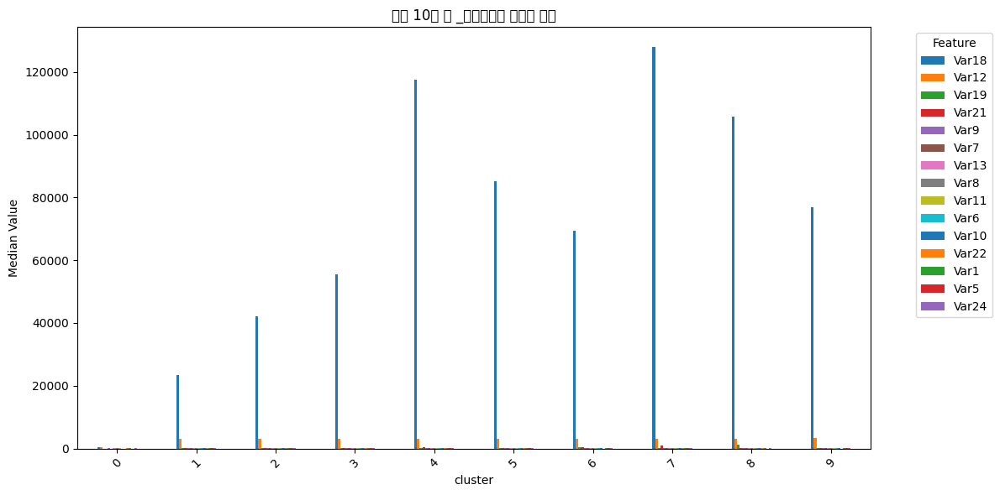

In [ ]:
feature_diff = ms_summary.max(axis=1) - ms_summary.min(axis=1)
top_features = feature_diff.sort_values(ascending=False).head(15).index

summary_top = ms_summary.loc[top_features]


summary_top.T.plot(kind='bar', figsize=(12, 6))  # Transpose해서 클러스터 기준으로 그룹핑
plt.title("상위 10개 변 _클러스터별 중앙값 비교")
plt.ylabel("Median Value")
plt.xticks(rotation=45)
# plt.legend(title='Cluster')
plt.legend(title="Feature", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


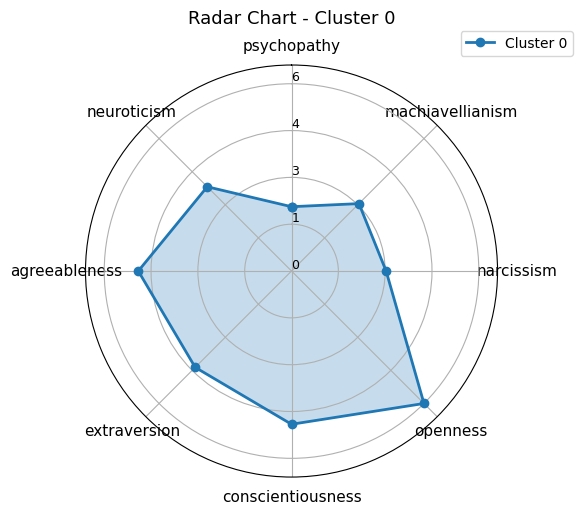

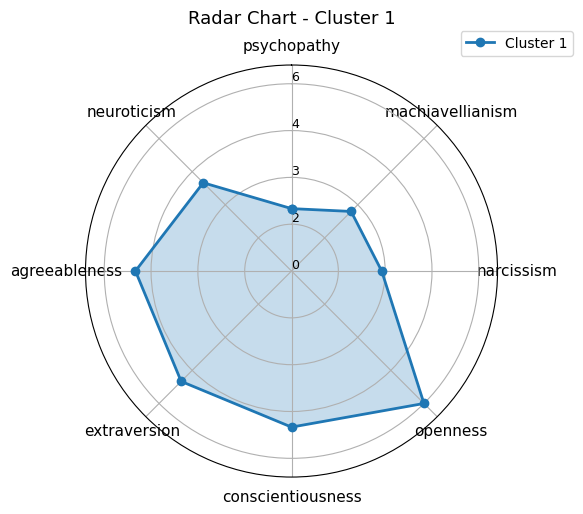

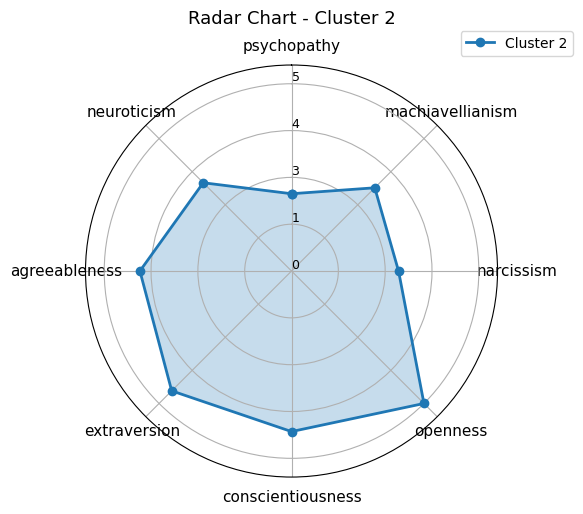

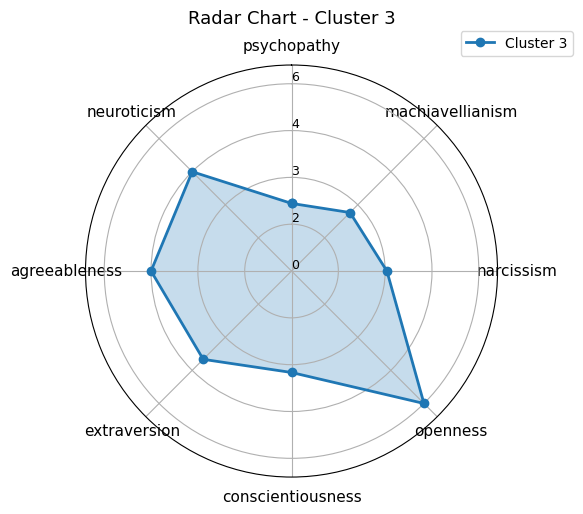

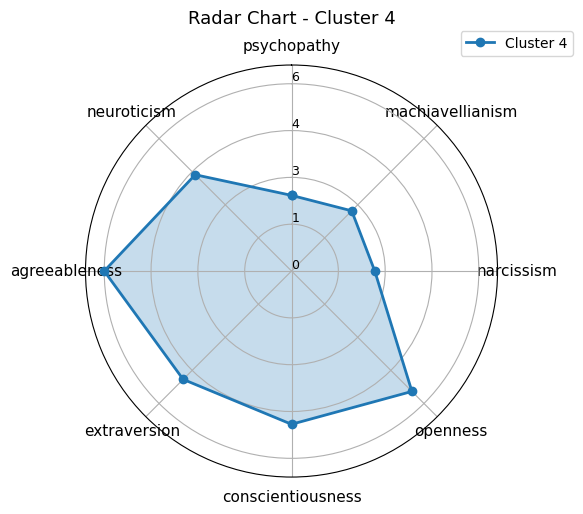

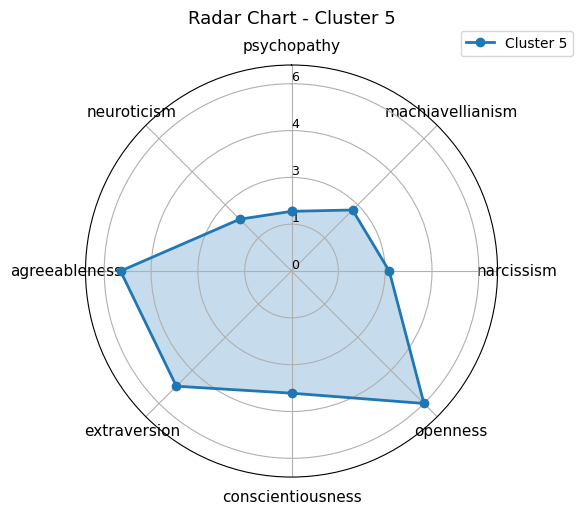

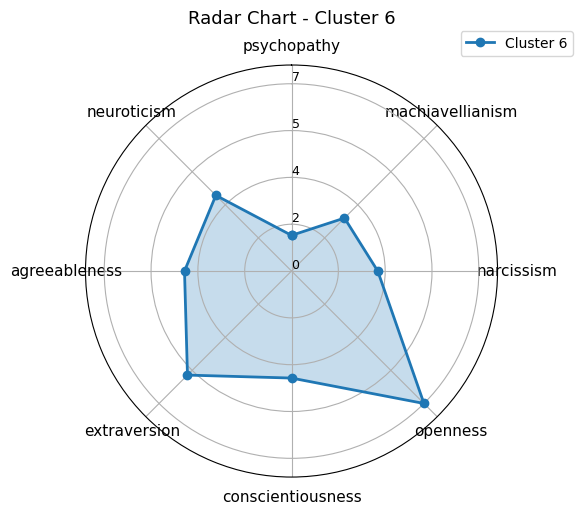

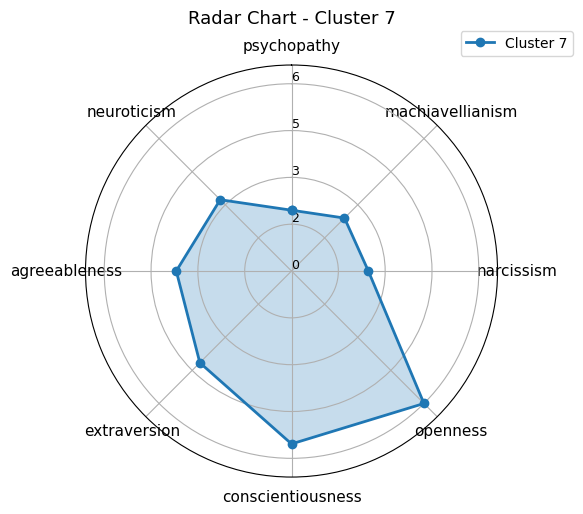

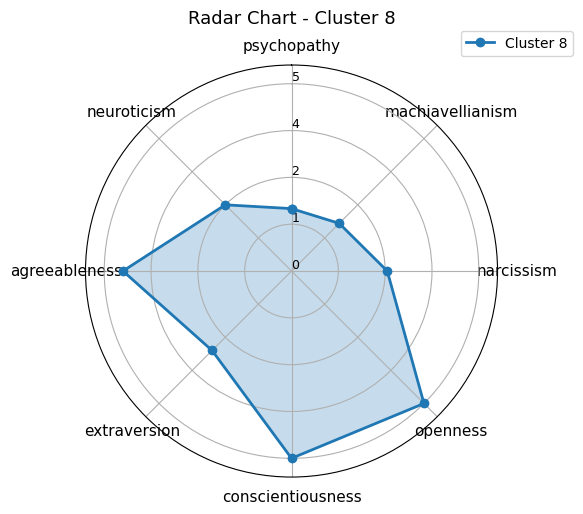

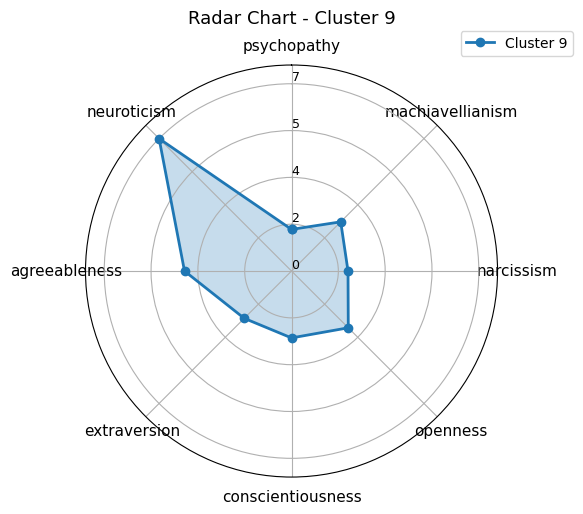

In [ ]:
def plot_radar(MS_copy, cluster_id):
    labels = MS_copy.index
    stats = MS_copy[cluster_id].values

    angles = np.linspace(0, 2 * np.pi, len(labels), endpoint=False).tolist()
    stats = np.concatenate((stats, [stats[0]]))
    angles += angles[:1]

    fig, ax = plt.subplots(figsize=(6,6), subplot_kw=dict(polar=True))

    # 그리드 간격 조정
    ax.set_rlabel_position(0)
    ax.set_theta_offset(np.pi / 2)  # 위쪽부터 시작
    ax.set_theta_direction(-1)

    ax.set_ylim(0, max(stats) * 1.1)
    ax.set_yticks(np.linspace(0, max(stats), 5))
    ax.set_yticklabels([f"{y:.0f}" for y in np.linspace(0, max(stats), 5)], fontsize=9)

    ax.plot(angles, stats, 'o-', linewidth=2, label=f'Cluster {cluster_id}')
    ax.fill(angles, stats, alpha=0.25)

    ax.set_thetagrids(np.degrees(angles[:-1]), labels ,fontsize = 11)

    ax.set_title(f'Radar Chart - Cluster {cluster_id}', fontsize = 13 , pad = 30)
    plt.legend(loc='upper right' , bbox_to_anchor= (1.2 , 1.1))
    plt.tight_layout()
    plt.show()


radar_data2 = ms_summary.head(8)
for c in radar_data2.columns:
    plot_radar(radar_data2, c)


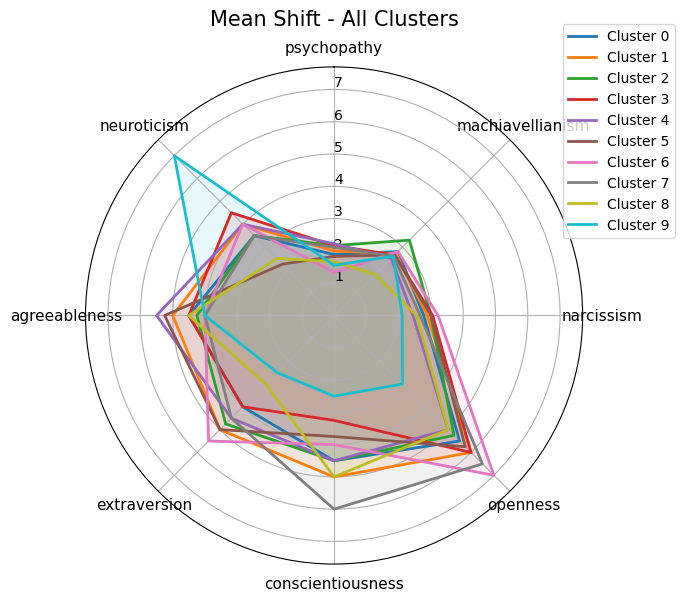

In [ ]:
def plot_radar_all(MS_copy, title="Mean Shift - All Clusters"):
    labels = MS_copy.index.tolist()
    angles = np.linspace(0, 2 * np.pi, len(labels), endpoint=False).tolist()
    angles += angles[:1]  # 원형으로 만들기

    fig, ax = plt.subplots(figsize=(7, 7), subplot_kw=dict(polar=True))

    # 그리드 설정
    ax.set_rlabel_position(0)
    ax.set_theta_offset(np.pi / 2)
    ax.set_theta_direction(-1)
    ax.set_thetagrids(np.degrees(angles[:-1]), labels, fontsize=11)

    # 모든 클러스터를 하나의 차트에 겹치기
    for col in MS_copy.columns:
        stats = MS_copy[col].tolist()
        stats += stats[:1]
        ax.plot(angles, stats, label=f'Cluster {col}', linewidth=2)
        ax.fill(angles, stats, alpha=0.1)

    ax.set_ylim(0, MS_copy.values.max() * 1.1)
    ax.set_title(title, fontsize=15, pad=30)
    ax.legend(loc='upper right', bbox_to_anchor=(1.2, 1.1))

    plt.tight_layout()
    plt.show()

# 사용 예시
radar_data2 = ms_summary.head(8)
plot_radar_all(radar_data2)


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 48516 (\N{HANGUL SYLLABLE BUN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 54252 (\N{HANGUL SYLLABLE PO}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


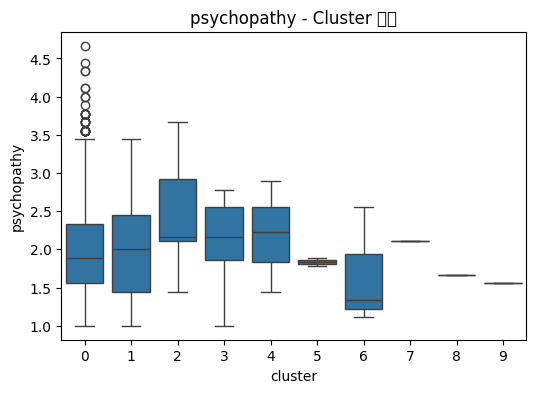

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 48516 (\N{HANGUL SYLLABLE BUN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 54252 (\N{HANGUL SYLLABLE PO}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


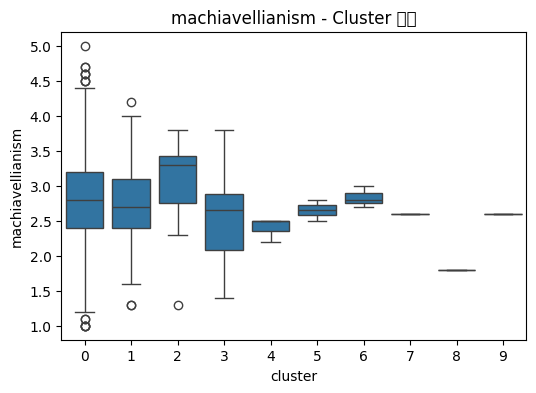

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 48516 (\N{HANGUL SYLLABLE BUN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 54252 (\N{HANGUL SYLLABLE PO}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


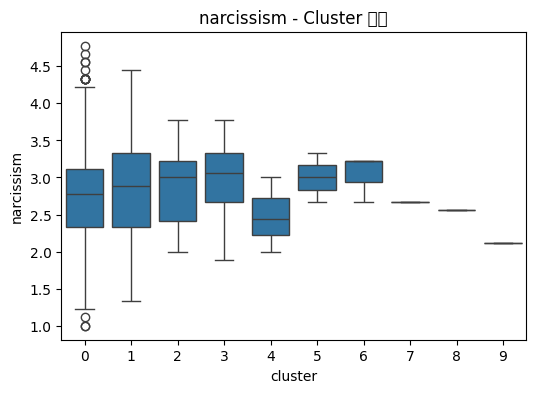

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 48516 (\N{HANGUL SYLLABLE BUN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 54252 (\N{HANGUL SYLLABLE PO}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


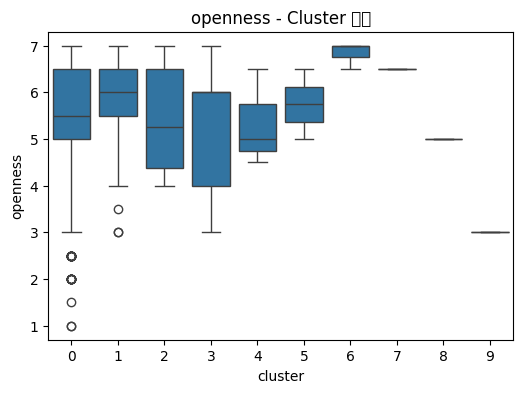

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 48516 (\N{HANGUL SYLLABLE BUN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 54252 (\N{HANGUL SYLLABLE PO}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


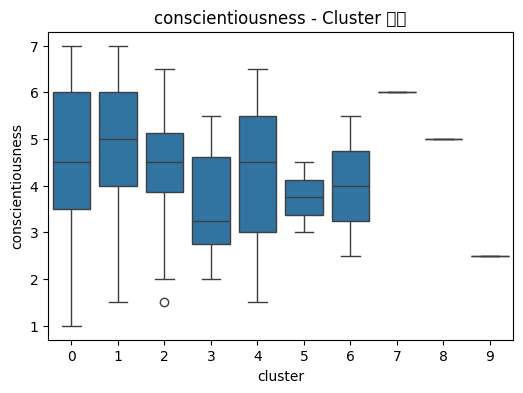

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 48516 (\N{HANGUL SYLLABLE BUN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 54252 (\N{HANGUL SYLLABLE PO}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


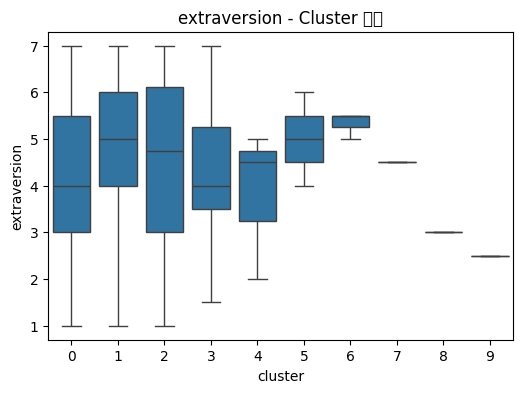

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 48516 (\N{HANGUL SYLLABLE BUN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 54252 (\N{HANGUL SYLLABLE PO}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


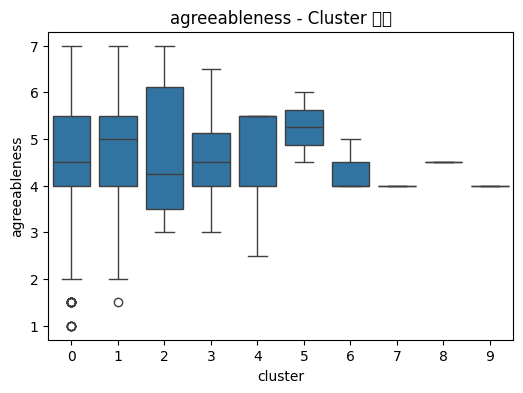

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 48516 (\N{HANGUL SYLLABLE BUN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 54252 (\N{HANGUL SYLLABLE PO}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


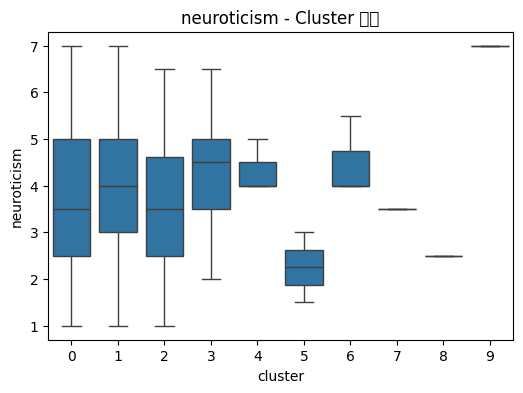

In [ ]:
#  원본 데이터 + cluster 라벨이 포함된 상태여야 함
top_vars = ms_summary.head(8).index.tolist()

for var in top_vars:
    plt.figure(figsize=(6, 4))
    sns.boxplot(x='cluster', y=var, data=MS_copy)
    plt.title(f'{var} - Cluster 분포')
    plt.show()


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 53364 (\N{HANGUL SYLLABLE KEUL}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 47084 (\N{HANGUL SYLLABLE REO}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 49828 (\N{HANGUL SYLLABLE SEU}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 53552 (\N{HANGUL SYLLABLE TEO}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 44036 (\N{HANGUL SYLLABLE GAN}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr

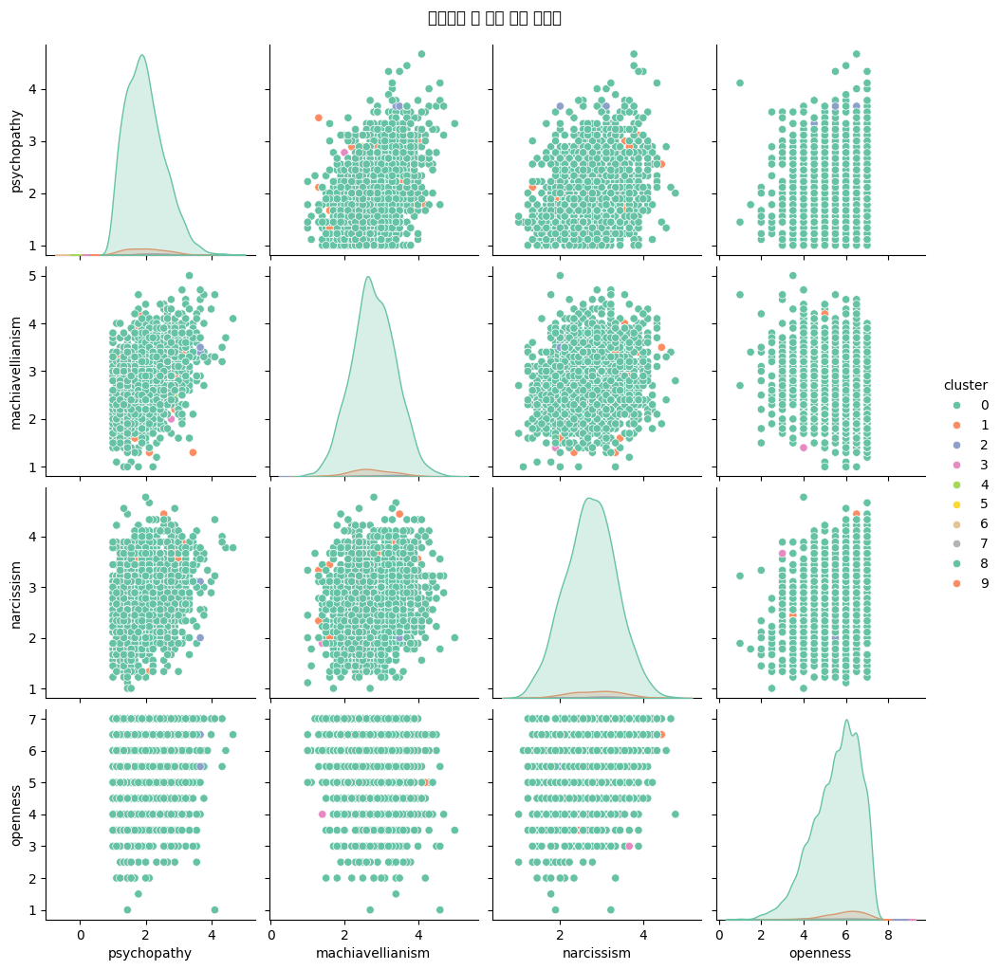

In [ ]:
# 중요 변수만 추출하여 pairplot (군집 라벨 포함)
vars_for_pairplot = top_vars[:4]  # 너무 많으면 복잡해짐
sns.pairplot(MS_copy[vars_for_pairplot + ['cluster']], hue='cluster', palette='Set2')
plt.suptitle('클러스터 간 변수 관계 시각화', y=1.02)
plt.show()


In [ ]:
features = ['openness', 'extraversion', 'narcissism', 'psychopathy', 'conscientiousness' , 'machiavellianism','neuroticism','agreeableness']
df_scaled = MS_copy.copy()

# 정규화
df_scaled[features] = StandardScaler().fit_transform(df_scaled[features])

# plotly 시각화
fig = px.parallel_coordinates(
    df_scaled,
    dimensions=features,
    color='cluster',
    color_continuous_scale=px.colors.diverging.Tealrose,
    title="Cluster-wise Parallel Coordinates"
)
fig.show()


### ANOVA 분석
- 어떤 변수들이 **군집**을 나누는 데 가장 기여했을까

- 집단 간 분석 , 집단 내 분석 <- 두 가지로 나눠서 비교한다.
<br>이 둘을 비교하면 군집 간 평균 차이가 우연인지 아닌지 파악할 수 있다.



- F = "군집 간 분산 / 군집 내 분산.
<br>값이 클수록 군집 간 평균 차이가 크다.

- p-value는 **“해당 F-score가 우연히 나올 확률”**을 의미하며,
작을수록 통계적으로 의미 있음을 나타낸다.


| 지표        | 기준 값        | 해석 방법               |
| --------- | ----------- | ------------------- |
| `F-score` | **5 이상 권장** | 군집 간 평균 차이가 실질적으로 큼 |
| `p-value` | **0.05 미만** | 통계적으로 유의미함          |




In [ ]:
from sklearn.feature_selection import f_classif

X_features = MS_copy.drop(columns=['cluster'])
y_labels = MS_copy['cluster']

F_vals, p_vals = f_classif(X_features, y_labels)

importance = pd.DataFrame({
    'Feature': X_features.columns,
    'F_score': F_vals,
    'p_value': p_vals
}).sort_values(by='F_score', ascending=False)
pd.set_option('display.max_rows', None)
pd.options.display.float_format = '{:.5f}'.format

importance


,Feature,F_score,p_value
25,Var18,2202.96736,0.00000
17,Var10,237.39859,0.00000
11,Var4,205.57899,0.00000
10,Var3,193.30700,0.00000
9,Var2,168.80288,0.00000
12,Var5,166.79744,0.00000
16,Var9,140.35115,0.00000
13,Var6,84.07173,0.00000
24,Var17,65.78863,0.00000
22,Var15,50.30678,0.00000


In [ ]:
import_vars = importance[(importance['F_score'] > 10) & (importance['p_value'] < 0.05)]

In [ ]:
import_vars.value_counts()

,,,count
Feature,F_score,p_value,
Var1,45.10912,0.00000,1
Var10,237.39859,0.00000,1
Var12,42.91036,0.00000,1
Var13,10.41447,0.00000,1
Var15,50.30678,0.00000,1
Var16,31.91803,0.00000,1
Var17,65.78863,0.00000,1
Var18,2202.96736,0.00000,1
Var19,19.96711,0.00000,1


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 44400 (\N{HANGUL SYLLABLE GUN}) missing from font(s) DejaVu Sans.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 51665 (\N{HANGUL SYLLABLE JIB}) missing from font(s) DejaVu Sans.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 48324 (\N{HANGUL SYLLABLE BYEOL}) missing from font(s) DejaVu Sans.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 54645 (\N{HANGUL SYLLABLE HAEG}) missing from font(s) DejaVu Sans.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 49900 (\N{HANGUL SYLLABLE SIM}) missing from font(s) DejaVu Sans.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 48320 (\N{HANGUL SYLLABLE BYEON}) missing from font(s) DejaVu Sans.

/usr/local/lib/python3.11/dist-packages/I

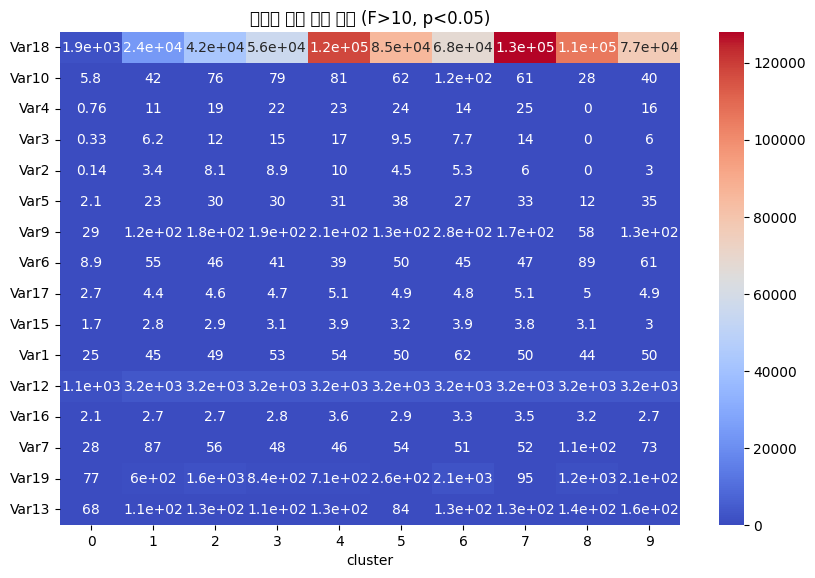

In [ ]:
key_vars = import_vars['Feature'].tolist()
heatmap_data = MS_copy[key_vars + ['cluster']].groupby('cluster').mean().T

plt.figure(figsize=(10, len(heatmap_data) * 0.4))
sns.heatmap(heatmap_data, annot=True, cmap='coolwarm')
plt.title('군집별 핵심 변수 평균 (F>10, p<0.05)')

plt.show()


##  Agglomerative Clustering (계층적 군집)

In [ ]:
ac_copy = data.copy()

In [ ]:
# X_scaled = RobustScaler().fit_transform(ac_copy) # robust 스케일을 사용할 경우, 과도한 응집
X_scaled = ac_copy

pca = PCA(n_components= 2 , random_state= 42)
x_pca = pca.fit_transform(X_scaled)

ac = AgglomerativeClustering(n_clusters = 3 ,linkage='ward')
ac_labels = ac.fit_predict(x_pca)

pca_ac = pd.DataFrame(x_pca , columns=['PCA1' , 'PCA2'])
pca_ac['cluster'] = ac_labels

score = silhouette_score(x_pca , ac_labels)
print(f"silhouette score : {score:.2f}")

# 정보 손실 정도 확인
print(pca.explained_variance_ratio_)
print(sum(pca.explained_variance_ratio_))

counts = Counter(ac_labels)
print(f"군집 분포 : {counts}")

silhouette score : 0.82
[0.98077437 0.01269822]
0.9934725982177184
군집 분포 : Counter({np.int64(1): 2316, np.int64(2): 112, np.int64(0): 39})


In [ ]:
ac_summary = pca_ac.groupby('cluster').median().T
display(ac_summary)

cluster,0,1,2
PCA1,50119.661170,-3125.138580,17405.512218
PCA2,-1636.176993,-486.851321,721.922964


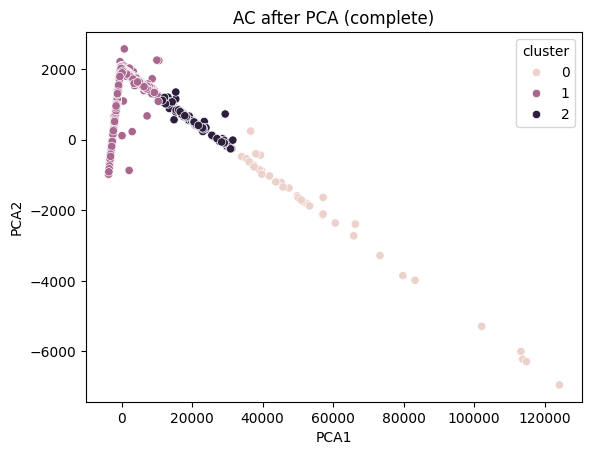

In [ ]:
sns.scatterplot(data=pca_ac, x='PCA1', y='PCA2', hue='cluster')
plt.title("AC after PCA (complete)")
plt.show()

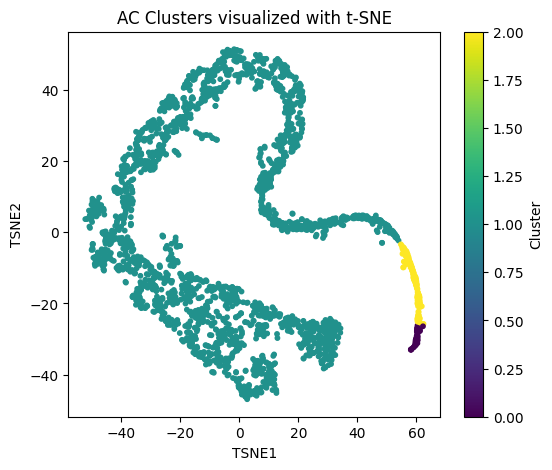

In [ ]:
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X_pca)  # X_scaled 원본 사용


plt.figure(figsize=(6,5))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=ac_labels, cmap='viridis', s=10)
plt.title("AC Clusters visualized with t-SNE")
plt.xlabel("TSNE1")
plt.ylabel("TSNE2")
plt.colorbar(label='Cluster')
plt.show()

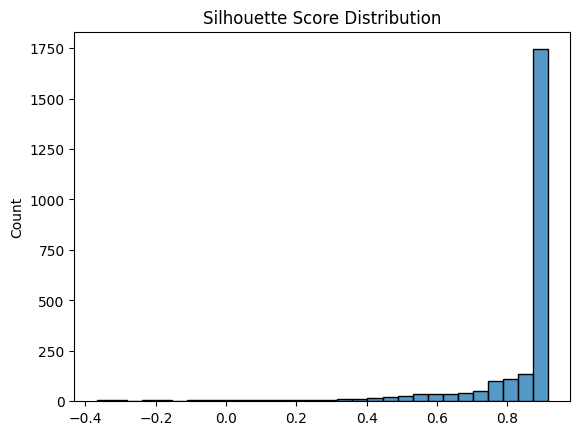

In [ ]:
as_sample_scores = silhouette_samples(x_pca, ac_labels)
sns.histplot(as_sample_scores, bins=30)
plt.title("Silhouette Score Distribution")
plt.show()

In [ ]:
linkage_matrix = linkage(x_pca , method = 'ward')

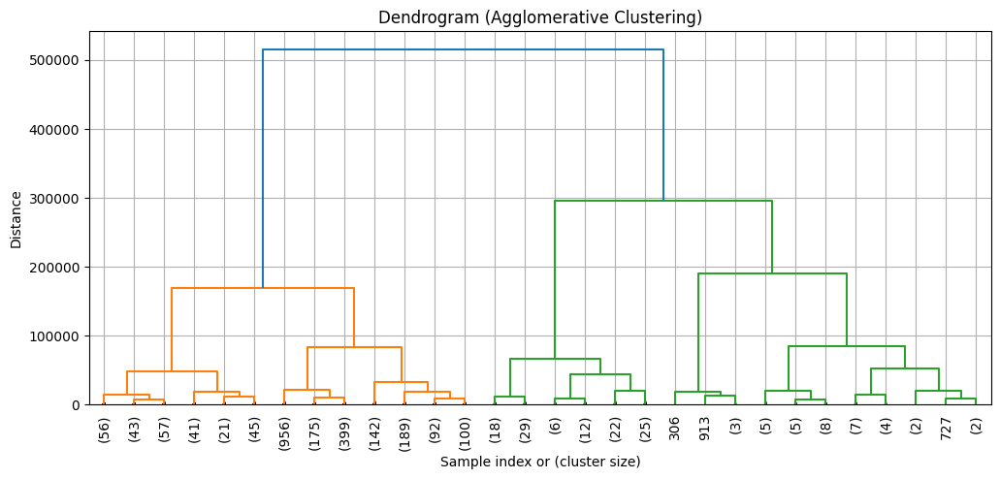

In [ ]:
plt.figure(figsize=(12, 5))
dendrogram(linkage_matrix, truncate_mode='lastp', p=30, leaf_rotation=90, leaf_font_size=10, show_contracted=True)
plt.title("Dendrogram (Agglomerative Clustering)")
plt.xlabel("Sample index or (cluster size)")
plt.ylabel("Distance")
plt.grid(True)
plt.show()


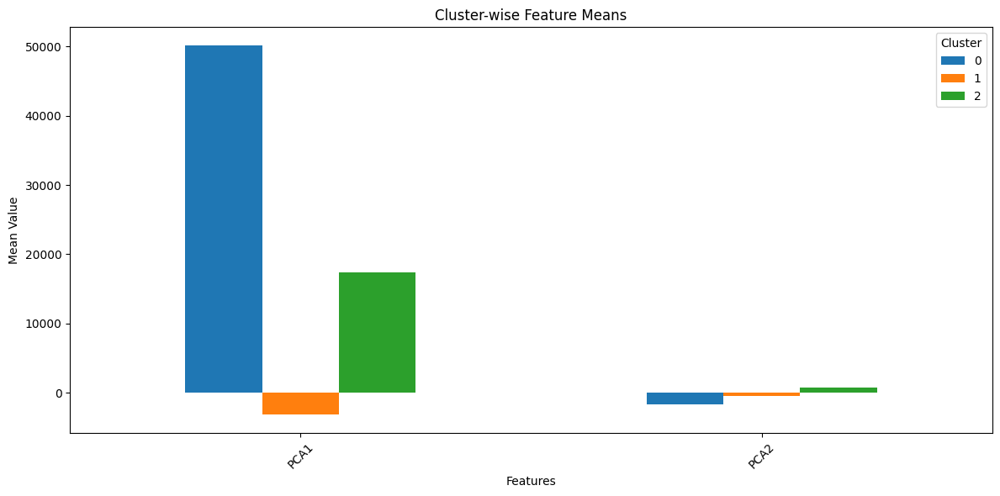

In [ ]:
ac_summary.plot(kind='bar', figsize=(12, 6))
plt.title('Cluster-wise Feature Means')
plt.xlabel('Features')
plt.ylabel('Mean Value')
plt.xticks(rotation=45)
plt.legend(title='Cluster')
plt.tight_layout()
plt.show()


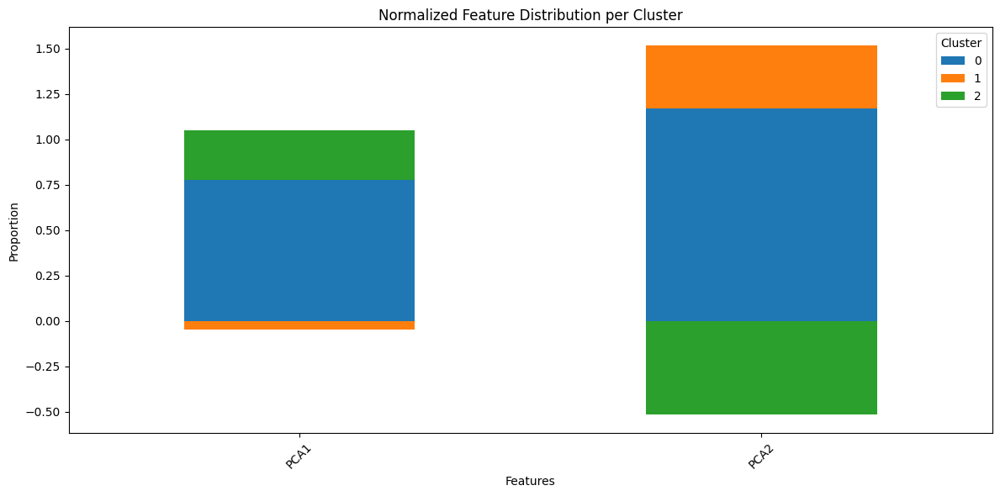

In [ ]:
summary_norm = ac_summary.div(ac_summary.sum(axis=1), axis=0)  # 각 변수 기준 정규화
summary_norm.plot(kind='bar', stacked=True, figsize=(12,6))
plt.title('Normalized Feature Distribution per Cluster')
plt.xlabel('Features')
plt.ylabel('Proportion')
plt.xticks(rotation=45)
plt.legend(title='Cluster')
plt.tight_layout()
plt.show()


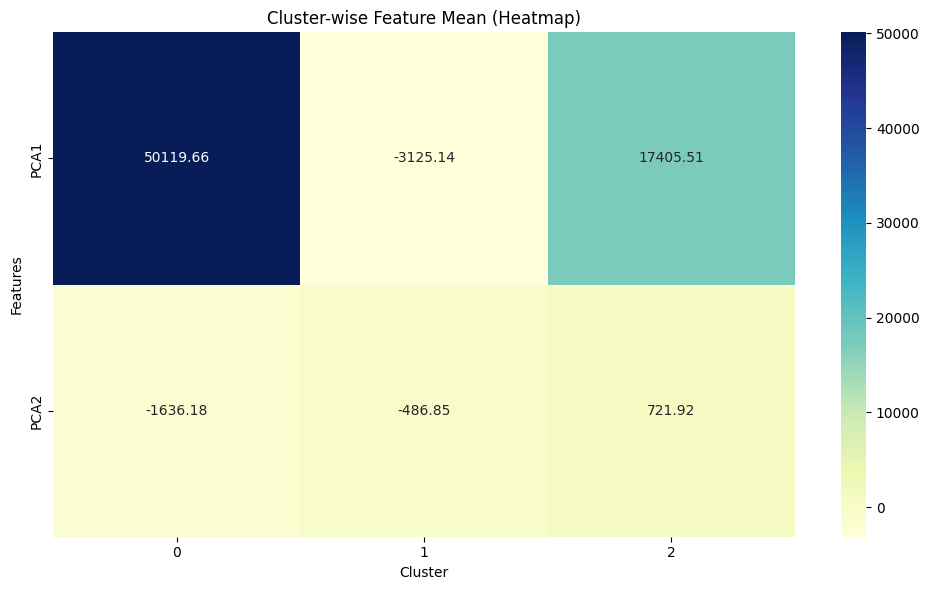

In [ ]:
plt.figure(figsize=(10, 6))
sns.heatmap(ac_summary, annot=True, fmt=".2f", cmap="YlGnBu")
plt.title("Cluster-wise Feature Mean (Heatmap)")
plt.ylabel("Features")
plt.xlabel("Cluster")
plt.tight_layout()
plt.show()


In [ ]:
ac_copy['cluster'] = ac_labels

In [ ]:
ac_summary = ac_copy.groupby('cluster').median().T
ac_summary

cluster,0,1,2
psychopathy,2.11111,1.88889,2.00000
machiavellianism,2.80000,2.80000,2.70000
narcissism,3.00000,2.77778,2.88889
openness,6.00000,5.50000,6.00000
conscientiousness,4.50000,4.50000,4.50000
extraversion,4.50000,4.00000,4.50000
agreeableness,4.50000,4.50000,4.50000
neuroticism,4.00000,3.50000,4.00000
Var1,49.86000,22.24000,44.82500
Var2,6.00000,0.00000,0.00000


/tmp/ipython-input-84-195815682.py:14: UserWarning:

Glyph 53364 (\N{HANGUL SYLLABLE KEUL}) missing from font(s) DejaVu Sans.

/tmp/ipython-input-84-195815682.py:14: UserWarning:

Glyph 47084 (\N{HANGUL SYLLABLE REO}) missing from font(s) DejaVu Sans.

/tmp/ipython-input-84-195815682.py:14: UserWarning:

Glyph 49828 (\N{HANGUL SYLLABLE SEU}) missing from font(s) DejaVu Sans.

/tmp/ipython-input-84-195815682.py:14: UserWarning:

Glyph 53552 (\N{HANGUL SYLLABLE TEO}) missing from font(s) DejaVu Sans.

/tmp/ipython-input-84-195815682.py:14: UserWarning:

Glyph 48324 (\N{HANGUL SYLLABLE BYEOL}) missing from font(s) DejaVu Sans.

/tmp/ipython-input-84-195815682.py:14: UserWarning:

Glyph 48320 (\N{HANGUL SYLLABLE BYEON}) missing from font(s) DejaVu Sans.

/tmp/ipython-input-84-195815682.py:14: UserWarning:

Glyph 49688 (\N{HANGUL SYLLABLE SU}) missing from font(s) DejaVu Sans.

/tmp/ipython-input-84-195815682.py:14: UserWarning:

Glyph 54217 (\N{HANGUL SYLLABLE PYEONG}) missing from font(s)

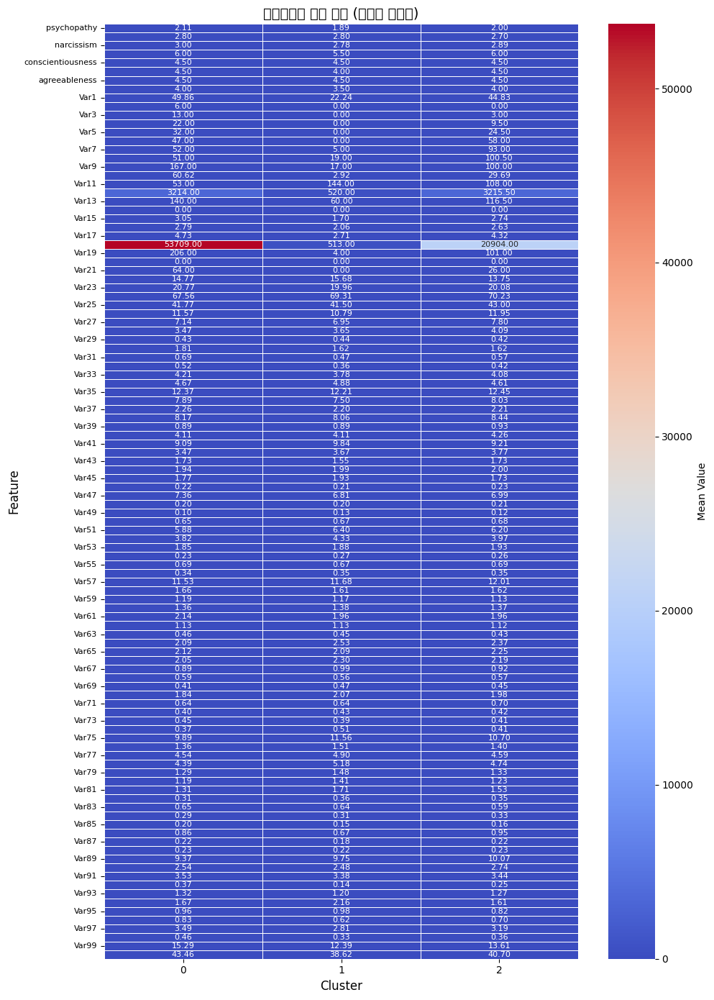

In [ ]:
plt.figure(figsize=(10, 14))
sns.heatmap(ac_summary,
            annot=True,
            fmt=".2f",
            cmap='coolwarm',
            linewidths=0.5,
            cbar_kws={'label': 'Mean Value'},
            annot_kws={"size": 8})
plt.title("클러스터별 변수 평균 (정렬된 히트맵)", fontsize=14)
plt.ylabel("Feature", fontsize=12)
plt.xlabel("Cluster", fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=8, rotation=0)
plt.tight_layout()
plt.show()

/tmp/ipython-input-85-3585762705.py:11: UserWarning:

Glyph 49345 (\N{HANGUL SYLLABLE SANG}) missing from font(s) DejaVu Sans.

/tmp/ipython-input-85-3585762705.py:11: UserWarning:

Glyph 50948 (\N{HANGUL SYLLABLE WI}) missing from font(s) DejaVu Sans.

/tmp/ipython-input-85-3585762705.py:11: UserWarning:

Glyph 44060 (\N{HANGUL SYLLABLE GAE}) missing from font(s) DejaVu Sans.

/tmp/ipython-input-85-3585762705.py:11: UserWarning:

Glyph 48320 (\N{HANGUL SYLLABLE BYEON}) missing from font(s) DejaVu Sans.

/tmp/ipython-input-85-3585762705.py:11: UserWarning:

Glyph 53364 (\N{HANGUL SYLLABLE KEUL}) missing from font(s) DejaVu Sans.

/tmp/ipython-input-85-3585762705.py:11: UserWarning:

Glyph 47084 (\N{HANGUL SYLLABLE REO}) missing from font(s) DejaVu Sans.

/tmp/ipython-input-85-3585762705.py:11: UserWarning:

Glyph 49828 (\N{HANGUL SYLLABLE SEU}) missing from font(s) DejaVu Sans.

/tmp/ipython-input-85-3585762705.py:11: UserWarning:

Glyph 53552 (\N{HANGUL SYLLABLE TEO}) missing from fon

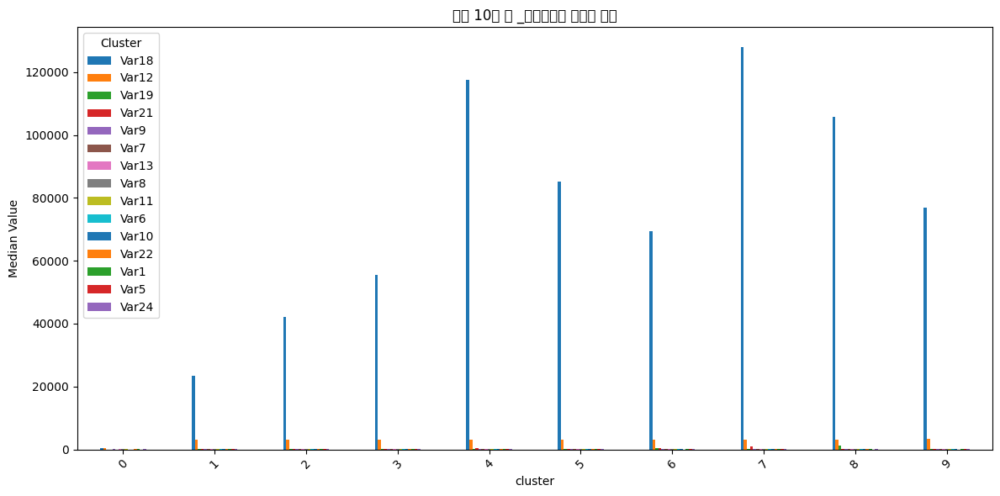

In [ ]:
feature_diff = ms_summary.max(axis=1) - ms_summary.min(axis=1)
top_features = feature_diff.sort_values(ascending=False).head(15).index

summary_top = ms_summary.loc[top_features]

summary_top.T.plot(kind='bar', figsize=(12, 6))
plt.title("상위 10개 변 _클러스터별 중앙값 비교")
plt.ylabel("Median Value")
plt.xticks(rotation=45)
plt.legend(title='Cluster')
plt.tight_layout()
plt.show()

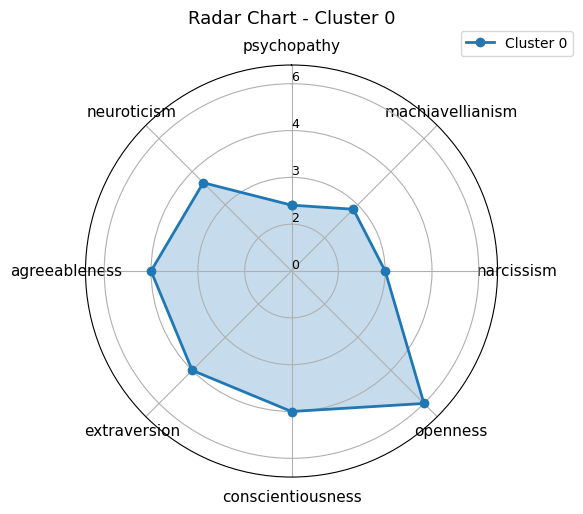

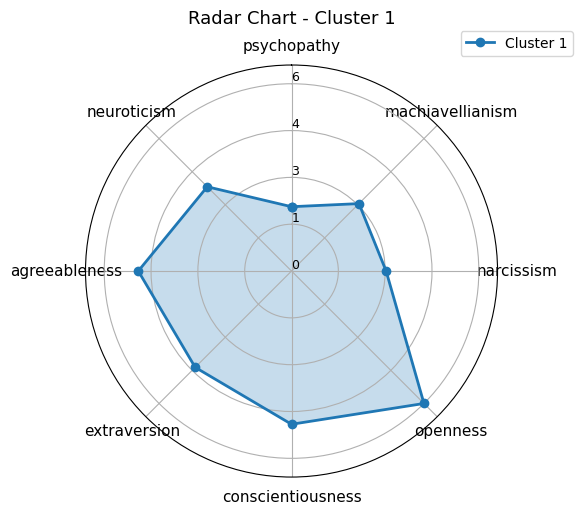

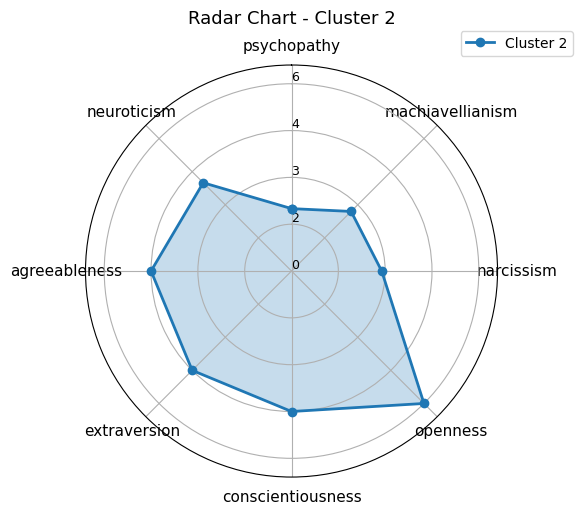

In [ ]:
def plot_radar(ac_copy, cluster_id):
    labels = ac_copy.index
    stats = ac_copy[cluster_id].values

    angles = np.linspace(0, 2 * np.pi, len(labels), endpoint=False).tolist()
    stats = np.concatenate((stats, [stats[0]]))
    angles += angles[:1]

    fig, ax = plt.subplots(figsize=(6,6), subplot_kw=dict(polar=True))

    # 그리드 간격 조정
    ax.set_rlabel_position(0)
    ax.set_theta_offset(np.pi / 2)  # 위쪽부터 시작
    ax.set_theta_direction(-1)

    ax.set_ylim(0, max(stats) * 1.1)
    ax.set_yticks(np.linspace(0, max(stats), 5))
    ax.set_yticklabels([f"{y:.0f}" for y in np.linspace(0, max(stats), 5)], fontsize=9)

    ax.plot(angles, stats, 'o-', linewidth=2, label=f'Cluster {cluster_id}')
    ax.fill(angles, stats, alpha=0.25)

    ax.set_thetagrids(np.degrees(angles[:-1]), labels ,fontsize = 11)

    ax.set_title(f'Radar Chart - Cluster {cluster_id}', fontsize = 13 , pad = 30)
    plt.legend(loc='upper right' , bbox_to_anchor= (1.2 , 1.1))
    plt.tight_layout()
    plt.show()

radar_data = ac_summary.head(8)
for c in radar_data.columns:
    plot_radar(radar_data, c)


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 48516 (\N{HANGUL SYLLABLE BUN}) missing from font(s) DejaVu Sans.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 54252 (\N{HANGUL SYLLABLE PO}) missing from font(s) DejaVu Sans.



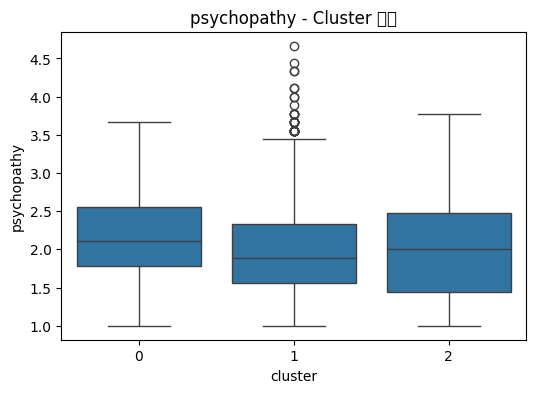

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 48516 (\N{HANGUL SYLLABLE BUN}) missing from font(s) DejaVu Sans.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 54252 (\N{HANGUL SYLLABLE PO}) missing from font(s) DejaVu Sans.



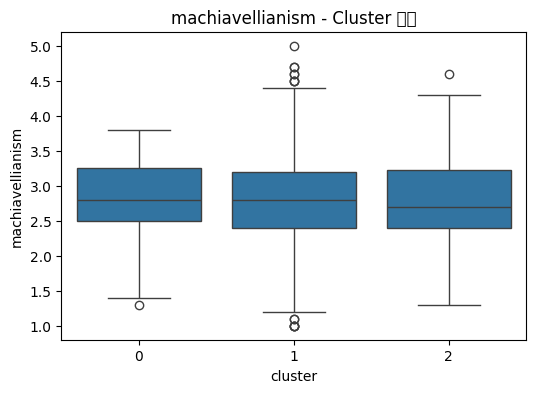

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 48516 (\N{HANGUL SYLLABLE BUN}) missing from font(s) DejaVu Sans.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 54252 (\N{HANGUL SYLLABLE PO}) missing from font(s) DejaVu Sans.



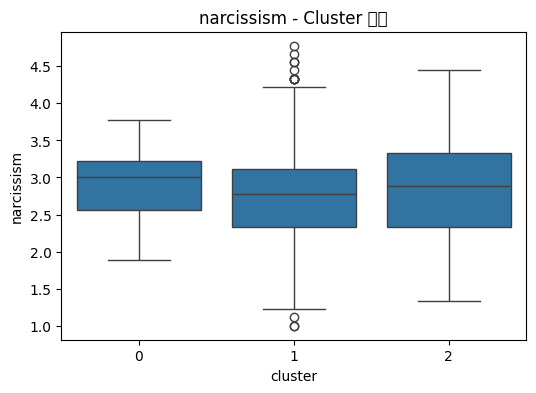

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 48516 (\N{HANGUL SYLLABLE BUN}) missing from font(s) DejaVu Sans.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 54252 (\N{HANGUL SYLLABLE PO}) missing from font(s) DejaVu Sans.



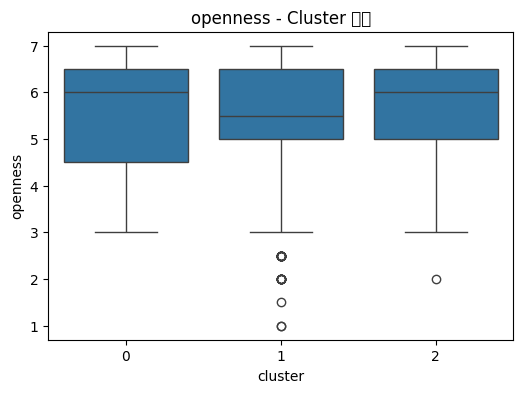

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 48516 (\N{HANGUL SYLLABLE BUN}) missing from font(s) DejaVu Sans.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 54252 (\N{HANGUL SYLLABLE PO}) missing from font(s) DejaVu Sans.



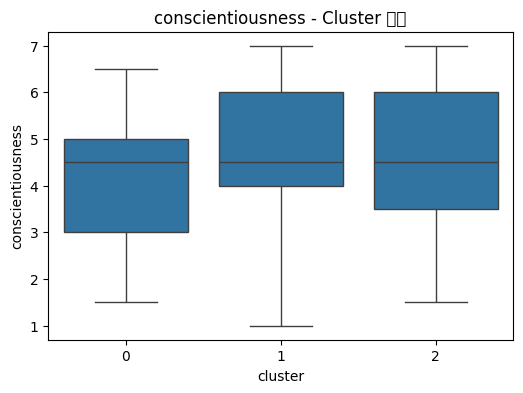

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 48516 (\N{HANGUL SYLLABLE BUN}) missing from font(s) DejaVu Sans.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 54252 (\N{HANGUL SYLLABLE PO}) missing from font(s) DejaVu Sans.



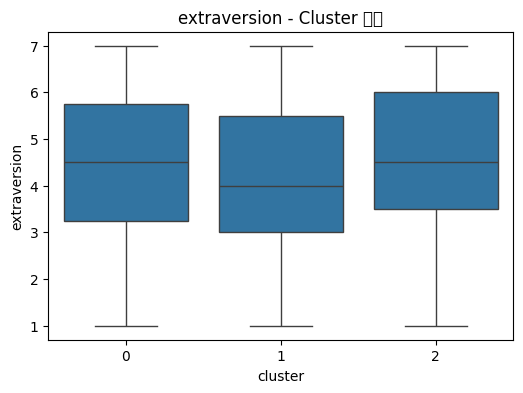

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 48516 (\N{HANGUL SYLLABLE BUN}) missing from font(s) DejaVu Sans.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 54252 (\N{HANGUL SYLLABLE PO}) missing from font(s) DejaVu Sans.



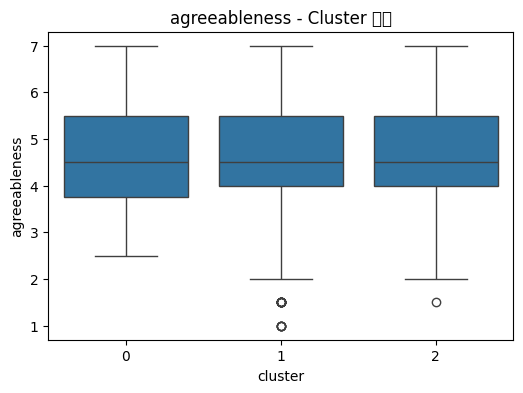

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 48516 (\N{HANGUL SYLLABLE BUN}) missing from font(s) DejaVu Sans.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 54252 (\N{HANGUL SYLLABLE PO}) missing from font(s) DejaVu Sans.



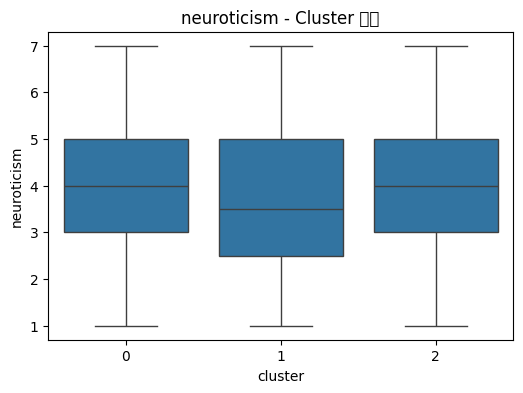

In [ ]:
top_vars = ac_summary.head(8).index.tolist()

for var in top_vars:
    plt.figure(figsize=(6, 4))
    sns.boxplot(x='cluster', y=var, data=ac_copy)
    plt.title(f'{var} - Cluster 분포')
    plt.show()


In [ ]:
features = ['openness', 'extraversion', 'narcissism', 'psychopathy', 'conscientiousness' , 'machiavellianism','neuroticism','agreeableness']
df_scaled = ac_copy.copy()

# 정규화
df_scaled[features] = StandardScaler().fit_transform(df_scaled[features])

# plotly 시각화
fig = px.parallel_coordinates(
    df_scaled,
    dimensions=features,
    color='cluster',
    color_continuous_scale=px.colors.diverging.Tealrose,
    title="Cluster-wise Parallel Coordinates"
)
fig.show()


### anova 분석

In [ ]:
from sklearn.feature_selection import f_classif

X_features = ac_copy.drop(columns=['cluster'])
y_labels = ac_copy['cluster']

F_vals, p_vals = f_classif(X_features, y_labels)

importance = pd.DataFrame({
    'Feature': X_features.columns,
    'F_score': F_vals,
    'p_value': p_vals
}).sort_values(by='F_score', ascending=False)
pd.set_option('display.max_rows', None)
pd.options.display.float_format = '{:.5f}'.format

importance


,Feature,F_score,p_value
25,Var18,4852.06168,0.00000
17,Var10,1107.82809,0.00000
11,Var4,1026.43424,0.00000
12,Var5,928.28167,0.00000
10,Var3,855.16345,0.00000
9,Var2,712.86573,0.00000
16,Var9,670.39227,0.00000
13,Var6,492.35629,0.00000
24,Var17,346.34332,0.00000
22,Var15,248.02709,0.00000


In [ ]:
import_vars = importance[(importance['F_score'] > 10) & (importance['p_value'] < 0.05)]

In [ ]:
import_vars.value_counts()

,,,count
Feature,F_score,p_value,
Var1,233.91661,0.00000,1
Var10,1107.82809,0.00000,1
Var11,21.99894,0.00000,1
Var12,237.91109,0.00000,1
Var13,52.04312,0.00000,1
Var15,248.02709,0.00000,1
Var16,160.06451,0.00000,1
Var17,346.34332,0.00000,1
Var18,4852.06168,0.00000,1


/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 44400 (\N{HANGUL SYLLABLE GUN}) missing from font(s) DejaVu Sans.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 51665 (\N{HANGUL SYLLABLE JIB}) missing from font(s) DejaVu Sans.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 48324 (\N{HANGUL SYLLABLE BYEOL}) missing from font(s) DejaVu Sans.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 54645 (\N{HANGUL SYLLABLE HAEG}) missing from font(s) DejaVu Sans.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 49900 (\N{HANGUL SYLLABLE SIM}) missing from font(s) DejaVu Sans.

/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning:

Glyph 48320 (\N{HANGUL SYLLABLE BYEON}) missing from font(s) DejaVu Sans.

/usr/local/lib/python3.11/dist-packages/I

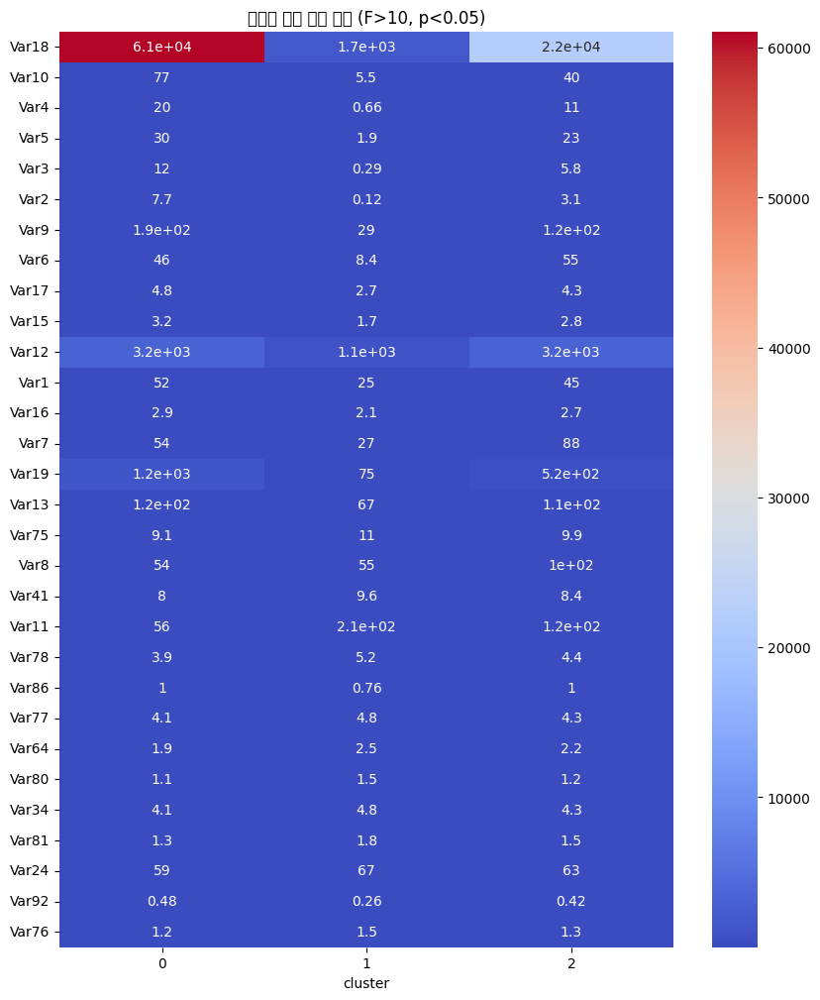

In [ ]:
key_vars = import_vars['Feature'].tolist()
heatmap_data = ac_copy[key_vars + ['cluster']].groupby('cluster').mean().T

plt.figure(figsize=(10, len(heatmap_data) * 0.4))
sns.heatmap(heatmap_data, annot=True, cmap='coolwarm')
plt.title('군집별 핵심 변수 평균 (F>10, p<0.05)')

plt.show()


## GMM [참고]
- pca 이후 정규성 검정 해보기

- 각 샘플이 여러 군집에 속할 확률을 계산
- soft vs hard 비교
  - predict_proba() → 이 확률값 그대로 반환
  - predict() → 위 확률값 중 가장 큰 것의 인덱스만 반환
- AIC vs BIC 군집 수 별 비교
- responsibility matrix, soft assignment 시각화
- 특이점 탐지 + 전이상태 탐지 : 단순히 2개 이상 속한다가 아니라 분산정도를 가지고 전이상태 탐지 (가장 확신하는 확률에 -1을 한다. 0에 가까울수록 군집 확실)
- 군집 간 분포 겹침(overlap)분석
- 클러스터 내 log-probability 기반 ranking

In [ ]:
gmm_copy = data.copy()

In [ ]:
# pca 후 주성분 정규성 검정해보기 - gmm 결과 신뢰

# X_scaled = RobustScaler().fit_transform(gmm_copy)
pca = PCA(n_components=50, random_state=42)
X_pca = pca.fit_transform(gmm_copy)

results = []

for i in range(X_pca.shape[1]):
    stat, p = shapiro(X_pca[:, i])
    results.append((f'PC{i+1}', stat, p))

# 결과를 DataFrame으로 보기 쉽게 정리
df_shapiro = pd.DataFrame(results, columns=["PC", "Statistic", "p-value"])
df_shapiro["결과"] = df_shapiro["p-value"].apply(lambda p: "정규" if p > 0.05 else "비정규")

In [ ]:
# X_scaled = RobustScaler().fit_transform(gmm_copy)
X_scaled = gmm_copy

pca = PCA(n_components=50 , random_state= 42)
X_pca = pca.fit_transform(X_scaled)


gmm_aic = GaussianMixture(
    n_components=15,
    covariance_type='full',
    init_params='kmeans',
    n_init=10,
    max_iter=100,
    random_state=42
)
gmm_aic.fit(X_pca)
gmm_labels = gmm_aic.predict(X_pca)

score = silhouette_score(X_pca, gmm_labels)
print(f"silhouette_score: {score:.2f}")

chi_score = calinski_harabasz_score(X_pca , gmm_labels)
print(f"calinski_harabasz_score: {chi_score:.2f}")

dbi_score = davies_bouldin_score(X_pca , gmm_labels)
print(f"davies_bouldin_score:{dbi_score:.2f}")

count = Counter(gmm_labels)
print(count)
print(sum(pca.explained_variance_ratio_))


silhouette_score: 0.24
calinski_harabasz_score: 8413.51
davies_bouldin_score:0.63
Counter({np.int64(10): 1015, np.int64(3): 699, np.int64(0): 393, np.int64(11): 111, np.int64(7): 86, np.int64(13): 41, np.int64(12): 35, np.int64(8): 28, np.int64(9): 17, np.int64(4): 13, np.int64(14): 11, np.int64(1): 5, np.int64(6): 5, np.int64(5): 5, np.int64(2): 3})
0.9999999198382933


In [ ]:
X_scaled = gmm_copy

pca = PCA(n_components=50 , random_state= 42)
X_pca = pca.fit_transform(X_scaled)


gmm = GaussianMixture(
    n_components=4,
    covariance_type='full',
    init_params='kmeans',
    n_init=10,
    max_iter=100,
    random_state=42
)
gmm.fit(X_pca)
gmm__4labels = gmm.predict(X_pca)

score = silhouette_score(X_pca, gmm__4labels)
print(f"silhouette_score: {score:.2f}")

chi_score = calinski_harabasz_score(X_pca , gmm__4labels)
print(f"calinski_harabasz_score: {chi_score:.2f}")

dbi_score = davies_bouldin_score(X_pca , gmm__4labels)
print(f"davies_bouldin_score:{dbi_score:.2f}")

count = Counter(gmm__4labels)
print(count)
print(sum(pca.explained_variance_ratio_))

silhouette_score: 0.44
calinski_harabasz_score: 2553.17
davies_bouldin_score:0.76
Counter({np.int64(3): 1368, np.int64(0): 763, np.int64(1): 315, np.int64(2): 21})
0.9999999198382933


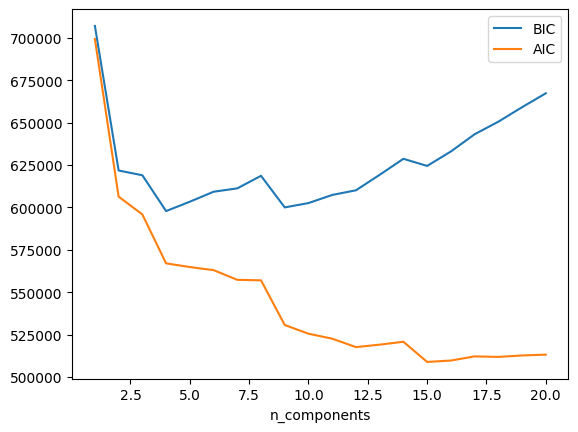

In [ ]:
n_components = np.arange(1, 21)
models = [GaussianMixture(n, covariance_type='full', random_state=0).fit(X_pca) for n in n_components]
plt.plot(n_components, [m.bic(X_pca) for m in models], label='BIC')
plt.plot(n_components, [m.aic(X_pca) for m in models], label='AIC')
plt.legend(loc='best')
plt.xlabel('n_components');

1. k=4(BIC), k=15(AIC) 비교
2. 실루엣, CH, DBI 비교
3. 확률 밀도 추정(score_samples)

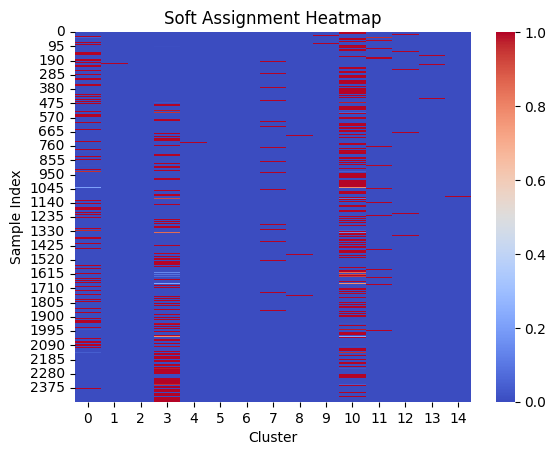

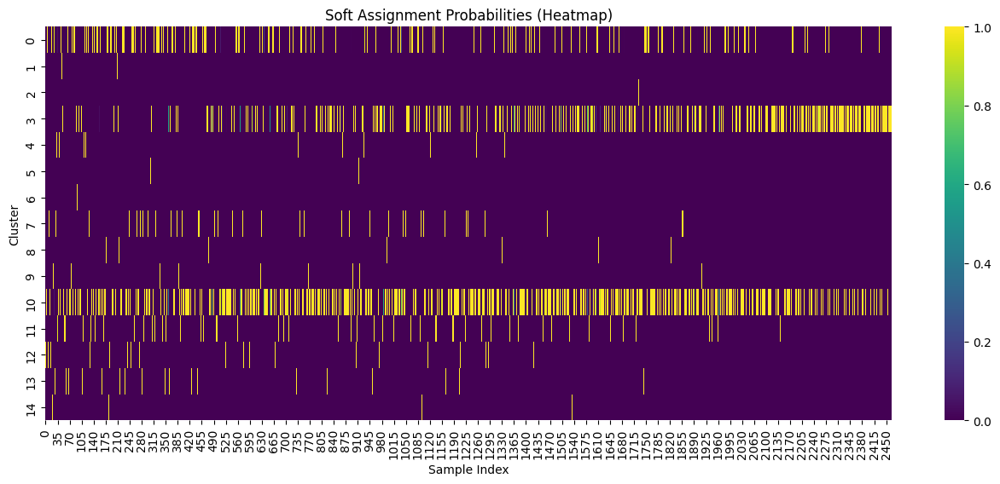

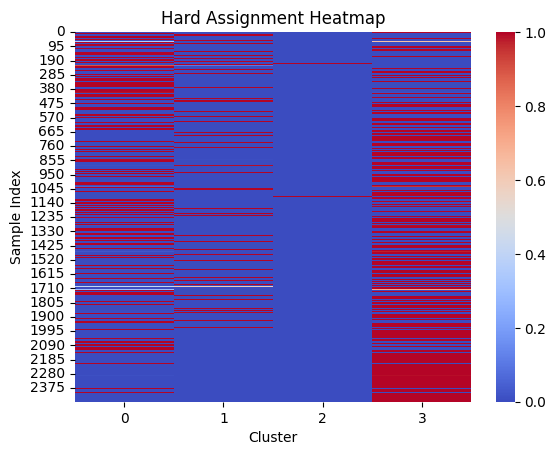

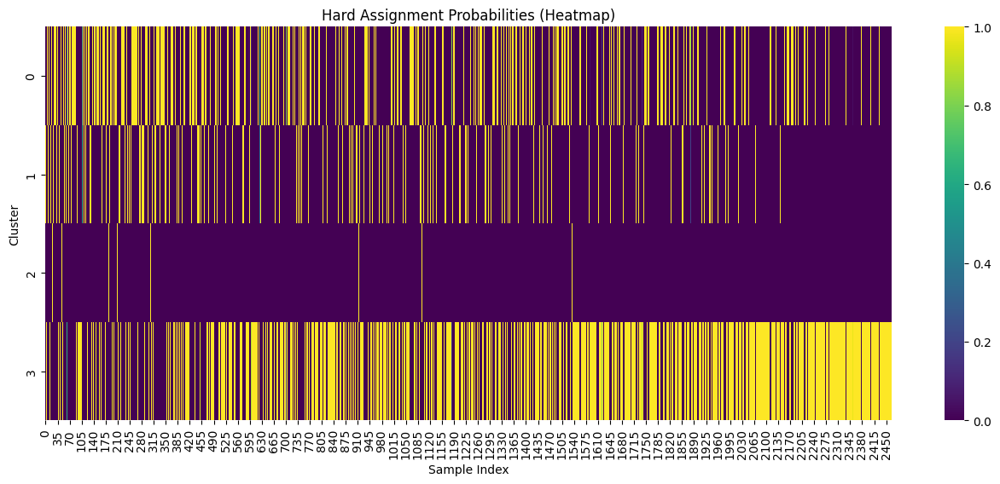

In [ ]:
# soft : n = 15 , hard : n = 4
soft_probs = gmm_aic.predict_proba(X_pca)

sns.heatmap(soft_probs[:], cmap="coolwarm")
plt.title("Soft Assignment Heatmap")
plt.xlabel("Cluster")
plt.ylabel("Sample Index")
plt.show()


plt.figure(figsize=(16, 6))
sns.heatmap(soft_probs.T, cmap='viridis', cbar=True)
plt.xlabel("Sample Index")
plt.ylabel("Cluster")
plt.title("Soft Assignment Probabilities (Heatmap)")
plt.show()




hard_probs = gmm.predict_proba(X_pca)

sns.heatmap(hard_probs[:], cmap="coolwarm")
plt.title("Hard Assignment Heatmap")
plt.xlabel("Cluster")
plt.ylabel("Sample Index")
plt.show()


plt.figure(figsize=(16, 6))
sns.heatmap(hard_probs.T, cmap='viridis', cbar=True)
plt.xlabel("Sample Index")
plt.ylabel("Cluster")
plt.title("Hard Assignment Probabilities (Heatmap)")
plt.show()

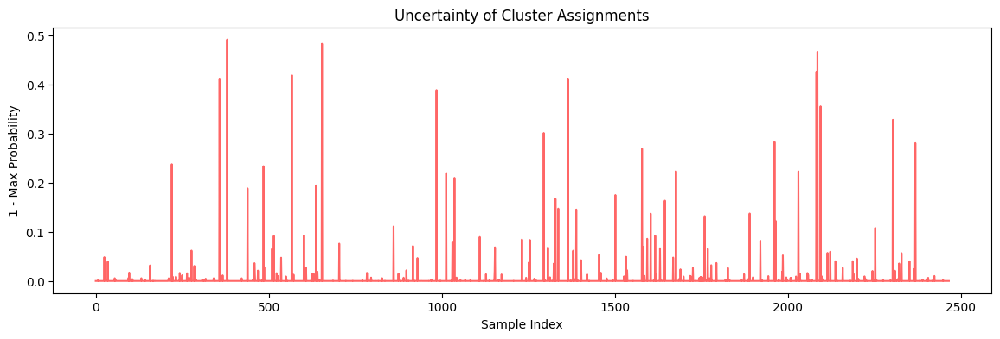

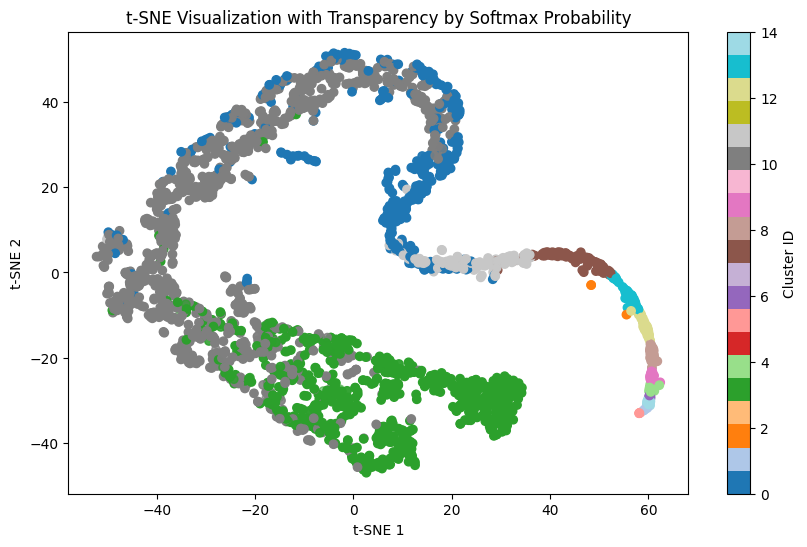

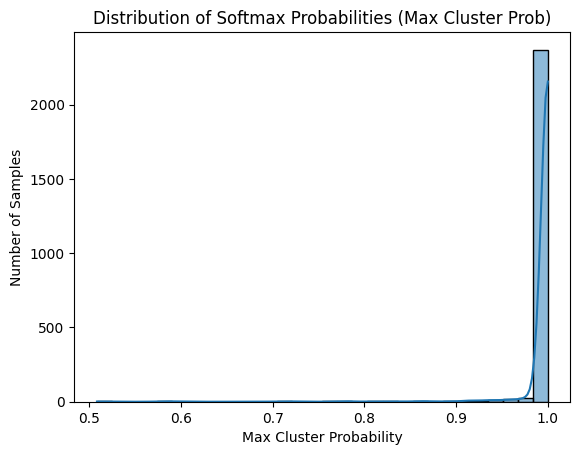

In [ ]:
max_probs = soft_probs.max(axis=1) #각 행의 총합은 1이며, 가장 큰 값 = max_prob ∈ [0, 1]
soft_labels = soft_probs.argmax(axis=1)
uncertainty = 1 - max_probs # 가장 확신하는 군집에 대한 확률

tsen = TSNE( n_components= 2 , random_state= 42)
X_tsne = tsen.fit_transform(X_pca)

plt.figure(figsize=(14, 4))
plt.plot(uncertainty, color='red', alpha=0.6)
plt.title("Uncertainty of Cluster Assignments")
plt.xlabel("Sample Index")
plt.ylabel("1 - Max Probability")
plt.show() # 0에 가까울수록 밀도가 높다. 경계가 분명함

plt.figure(figsize=(10, 6))
scatter = plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=soft_labels, cmap='tab20', alpha=max_probs)
plt.colorbar(scatter, label="Cluster ID")
plt.title("t-SNE Visualization with Transparency by Softmax Probability")
plt.xlabel("t-SNE 1")
plt.ylabel("t-SNE 2")
plt.show()

sns.histplot(max_probs, bins=30, kde=True)
plt.title("Distribution of Softmax Probabilities (Max Cluster Prob)")
plt.xlabel("Max Cluster Probability")
plt.ylabel("Number of Samples")
plt.show()

→ GMM은 본질적으로 로그 확률 공간에서 계산하므로, 그 값을 그대로 사용하는 게 좋습니다.

→ score_samples()는 샘플이 해당 GMM 모델에 얼마나 적합한지를 로그 밀도 값으로 보여주는 척도이며,
확률적으로 중심에 가까울수록 높은 log_prob 값을 가집니다

In [ ]:
# score sample
log_probs = gmm_aic.score_samples(X_pca)
densities = np.where(np.isfinite(log_probs), log_probs, np.nan)  # 무한값 제거


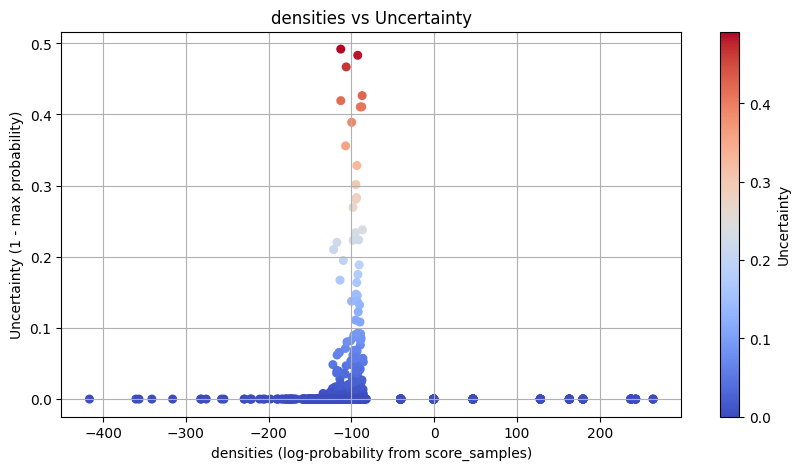

In [ ]:
plt.figure(figsize=(10, 5))
plt.scatter(densities, uncertainty, c=uncertainty, cmap='coolwarm', s=30)
plt.colorbar(label='Uncertainty')
plt.xlabel('densities (log-probability from score_samples)')
plt.ylabel('Uncertainty (1 - max probability)')
plt.title('densities vs Uncertainty')
plt.grid(True)
plt.show() # 확률 밀도 시각화

/tmp/ipython-input-58-1696689642.py:9: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


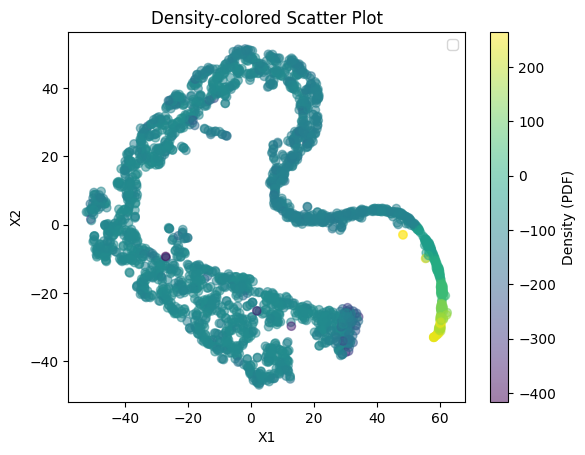

In [ ]:
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X_pca)

plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=densities, cmap='viridis' , alpha = 0.5)
plt.colorbar(label='Density (PDF)')
plt.title("Density-colored Scatter Plot")
plt.xlabel("X1")
plt.ylabel("X2")
plt.legend()
plt.show()


의문

- density 100~200인 노란 부분 → GMM에선 확률밀도가 높은 정상 영역

- 하지만 DBSCAN/HDBSCAN에서는 그 부분이 **-1 (이상치)**로 분류됨

- **AC(agglomerative)**나 Mean Shift에선 세부적으로 분할되어 있음

- 반대로 GMM에선 그곳이 전이 상태도, 이상치도 아닌 정상 값으로 나옴

 1. 이상치가 확정적이라서 군집이 확실한 경우
 2. 밀도가 낮거나 연결이 끊긴 구조라서

*무엇을 이상치로 정의해야 할까?*
심리적/성격적으로


- 각 군집방법마다 이상치로 분류하는 기준을 알아야겠다.

1. DBSCAN / HDBSCA
  - 지역 밀도 부족 (주변에 이웃이 부족하면 이상치로 분류)

2. AC
  - 거리 기반 계층적 분할 → 세부 거리 차이에 민감

3. Mean shift
  - 밀도가 충분히 높지만, 방향이나 곡률이 바뀌는 부분”에서 군집이 나뉠 수 있음

4. GMM
  - 확률밀도가 매우 낮은 극단값만 인식
   = 전체 분포에 어울리지 않는 이질적인 샘플

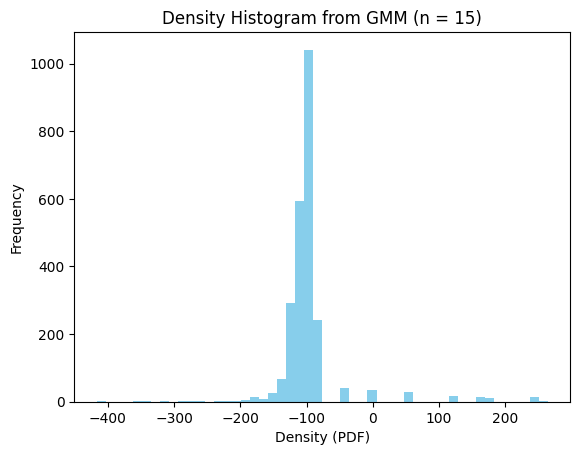

In [ ]:
plt.hist(densities, bins=50, color='skyblue')
plt.title("Density Histogram from GMM (n = 15)")
plt.xlabel("Density (PDF)")
plt.ylabel("Frequency")
plt.show()

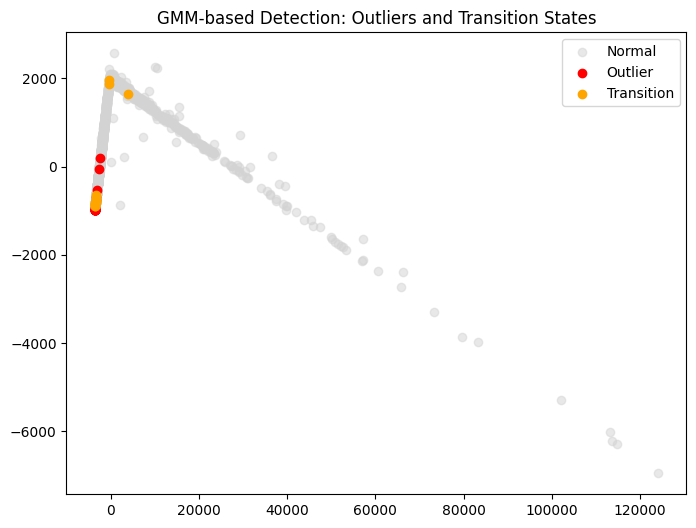

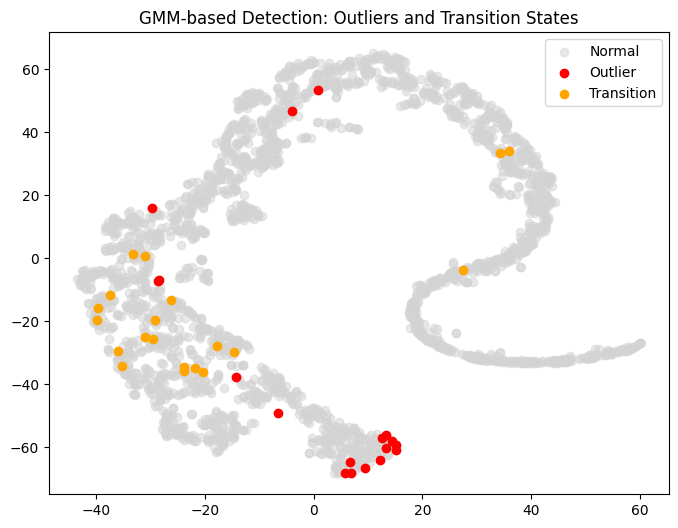

In [ ]:
# 특이점  (기준은 확률밀도함수 시각화 값 참고)
outlier_mask = (densities < -200) & (uncertainty < 0.1)

# 전이 상태
transition_mask = (densities < -50) & (uncertainty > 0.2)

X_2d = PCA(n_components=2).fit_transform(X_pca)


plt.figure(figsize=(8, 6))
plt.scatter(X_2d[:, 0], X_pca[:, 1], c='lightgray', label='Normal', alpha=0.5)
plt.scatter(X_2d[outlier_mask, 0], X_2d[outlier_mask, 1], c='red', label='Outlier')
plt.scatter(X_2d[transition_mask, 0], X_2d[transition_mask, 1], c='orange', label='Transition')
plt.title("GMM-based Detection: Outliers and Transition States")
plt.legend()
plt.show()

tsne = TSNE(n_components=2, random_state=42 , perplexity= 30 , learning_rate=200, init='pca')
X_tsne = tsne.fit_transform(X_pca)

plt.figure(figsize=(8, 6))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c='lightgray', label='Normal', alpha=0.5)
plt.scatter(X_tsne[outlier_mask, 0], X_tsne[outlier_mask, 1], c='red', label='Outlier')
plt.scatter(X_tsne[transition_mask, 0], X_tsne[transition_mask, 1], c='orange', label='Transition')
plt.title("GMM-based Detection: Outliers and Transition States")
plt.legend()
plt.show()

문제점 :
- 이상치와 전이 상태를 구분 짓는 정상 그룹의 기준이 있어야 하는데 정상 군집도 군집별 특성이 제각각이다. 즉 정상 군집도 이상치와 전이 상태를 특징을 비교할 기준점이 될 수 없다.


-> 정상 집단 내부의 다양성을 고려해야 한다.

해결방안 :
- 1. 각 군집별 기준에서 비교
  -> 군집이 15개인점을 고려하면 효율적이지 않음..
- 2 . 밀도 (x축 값) 0 이상을 기준으로 하면? -> 밀도도 충분히 높고 불확실성이 0에 가까우니까

In [ ]:
df_outliers = gmm_copy.loc[pd.Series(outlier_mask, index=gmm_copy.index)]
df_transitions = gmm_copy.loc[pd.Series(transition_mask, index=gmm_copy.index)]


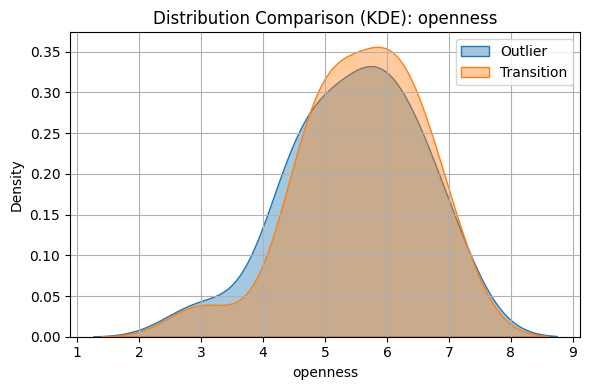

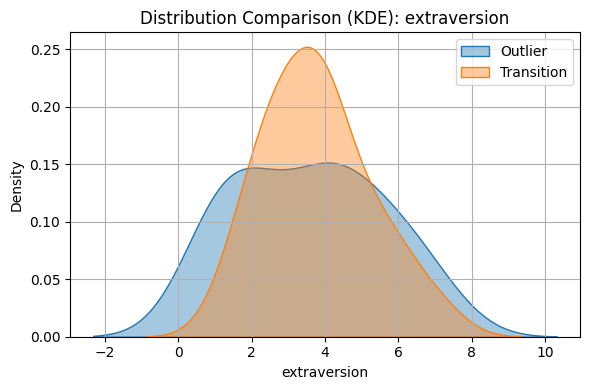

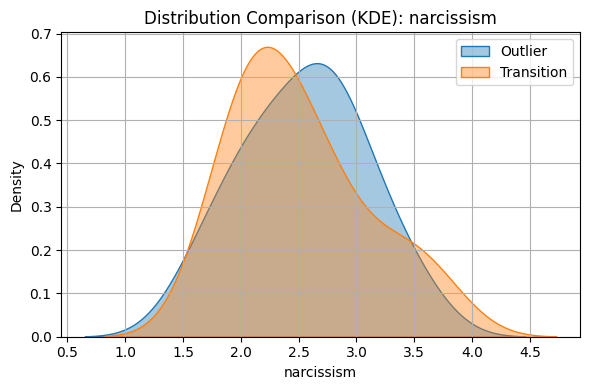

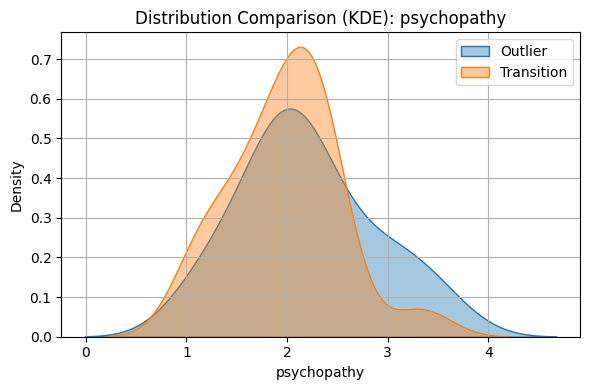

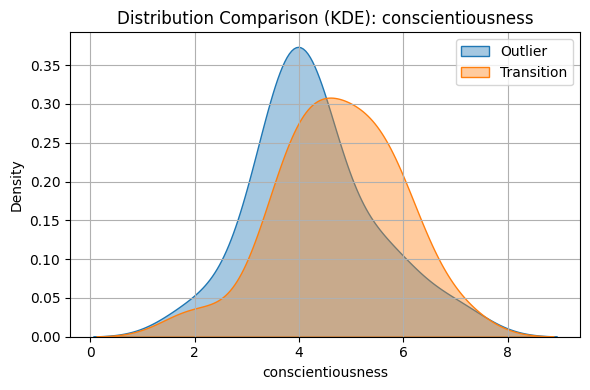

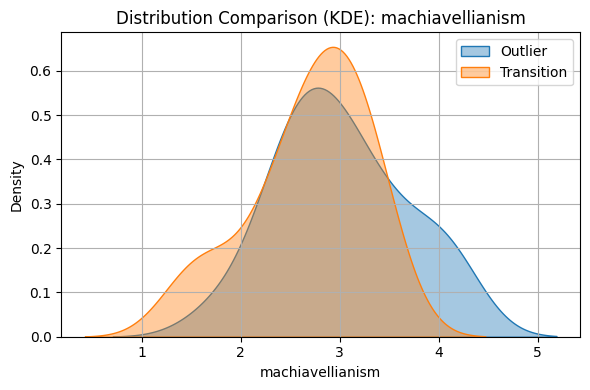

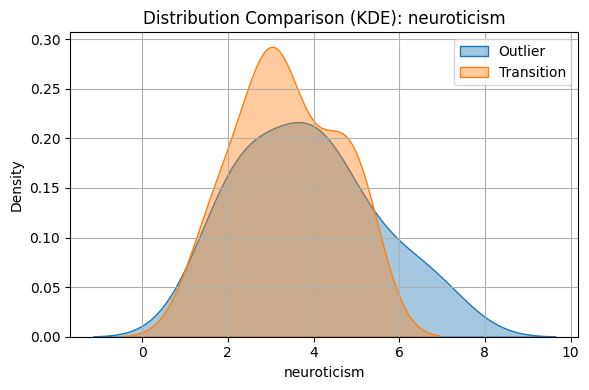

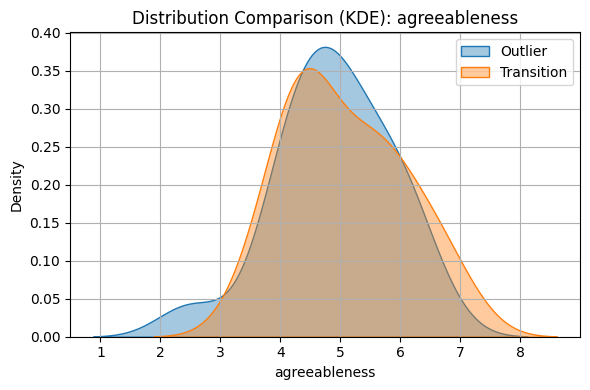

In [ ]:
features = ['openness', 'extraversion', 'narcissism', 'psychopathy', 'conscientiousness' , 'machiavellianism','neuroticism','agreeableness']

for feat in features:
    plt.figure(figsize=(6, 4))
    sns.kdeplot(df_outliers[feat], label='Outlier', fill=True, alpha=0.4)
    sns.kdeplot(df_transitions[feat], label='Transition', fill=True, alpha=0.4)
    plt.title(f'Distribution Comparison (KDE): {feat}')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

In [ ]:
summary = pd.DataFrame({
    'Outlier_mean': df_outliers.mean(),
    'Transition_mean': df_transitions.mean(),
    'Outlier_std': df_outliers.std(),
    'Transition_std': df_transitions.std(),
})

summary.round(3)


,Outlier_mean,Transition_mean,Outlier_std,Transition_std
psychopathy,2.198,1.978,0.665,0.535
machiavellianism,3.017,2.690,0.648,0.590
narcissism,2.543,2.511,0.537,0.577
openness,5.472,5.575,1.036,0.977
conscientiousness,4.278,4.750,1.153,1.141
extraversion,3.556,3.775,1.977,1.437
agreeableness,4.889,5.075,0.963,0.977
neuroticism,3.833,3.375,1.572,1.168
Var1,12.431,21.754,4.412,9.425
Var2,0.000,0.000,0.000,0.000


로그 변환 전 시각화 결과는 실루엣 하위 5%와 위 밀도 좌표가 어느정도 유사성을 보인다.

또한 DBSCAN의 시각화와 비교했을 때 비스한 지점에서 노란색과 동일한 밀도 군집을 보였다.


로그 변환 후


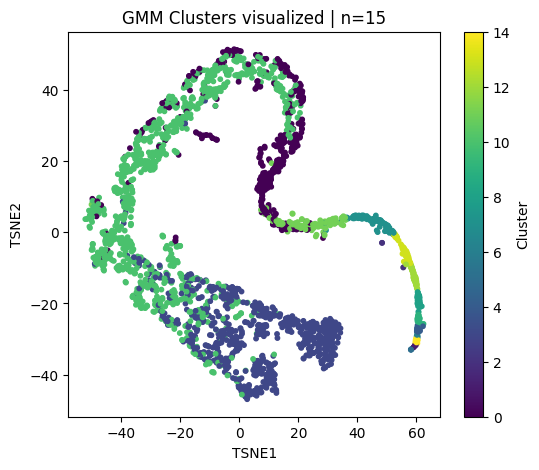

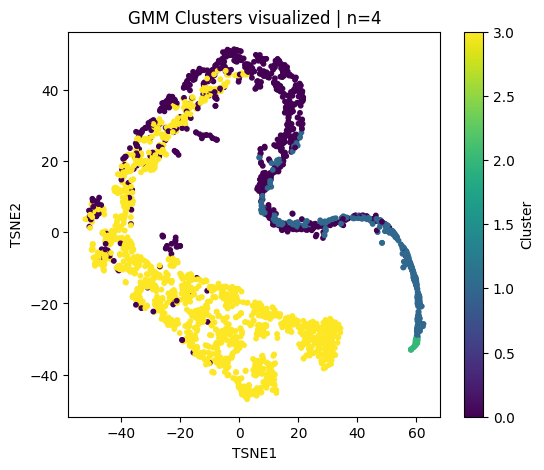

In [ ]:
# tsne = TSNE(n_components=2, random_state=42)
# X_tsne = tsne.fit_transform(X_pca)  # X_scaled 원본 사용


plt.figure(figsize=(6,5))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=gmm_labels, cmap='viridis', s=10)
plt.title("GMM Clusters visualized | n=15")
plt.xlabel("TSNE1")
plt.ylabel("TSNE2")
plt.colorbar(label='Cluster')
plt.show()

plt.figure(figsize=(6,5))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=gmm__4labels, cmap='viridis', s=10)
plt.title("GMM Clusters visualized | n=4")
plt.xlabel("TSNE1")
plt.ylabel("TSNE2")
plt.colorbar(label='Cluster')
plt.show()

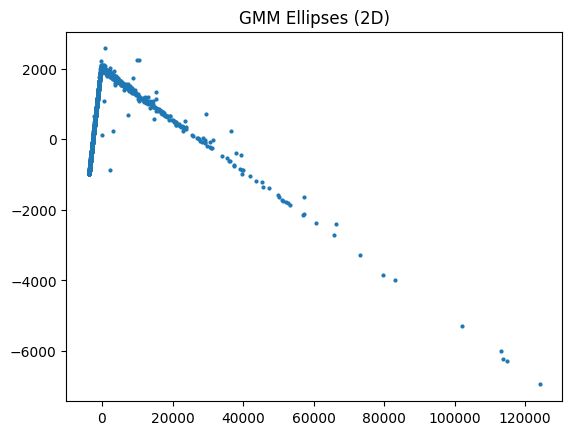

In [ ]:
from matplotlib.patches import Ellipse
import matplotlib.transforms as transforms

def plot_gmm_ellipses(gmm, X_2d, ax=None, colors=None):
    if ax is None:
        fig, ax = plt.subplots()
    ax.scatter(X_2d[:, 0], X_2d[:, 1], s=4)

    for i, (mean, covar) in enumerate(zip(gmm.means_, gmm.covariances_)):
        if covar.shape == (2, 2):
            v, w = np.linalg.eigh(covar)
            u = w[0] / np.linalg.norm(w[0])
            angle = np.arctan2(u[1], u[0])
            angle = np.degrees(angle)
            ell = Ellipse(mean, 2 * np.sqrt(v[0]), 2 * np.sqrt(v[1]),
                          angle, edgecolor='k', facecolor='none')
            ax.add_patch(ell)

    ax.set_title("GMM Ellipses (2D)")
    plt.show()

# PCA 또는 t-SNE 후 시각화
plot_gmm_ellipses(gmm_aic, X_pca)


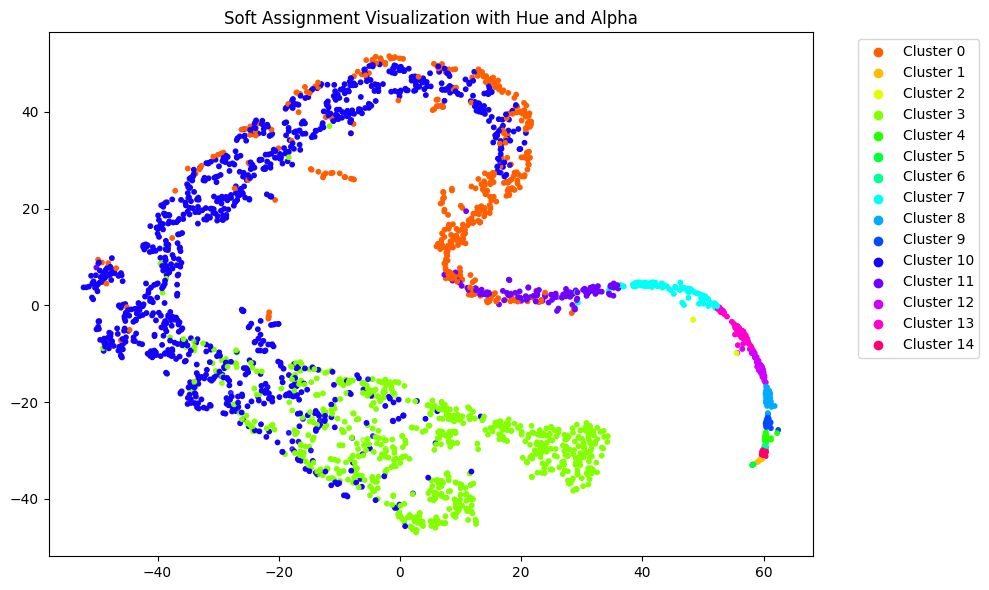

In [ ]:
predicted_clusters = np.argmax(soft_probs, axis=1)
max_probs = np.max(soft_probs, axis=1)

# 2. 색상 지정
palette = sns.color_palette("hsv", np.unique(predicted_clusters).size)
colors = [palette[i] for i in predicted_clusters]

# 3. 시각화
plt.figure(figsize=(10, 6))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1],
            c=colors, alpha=max_probs, s=10)

# 4. 범례
for i, color in enumerate(palette):
    plt.scatter([], [], c=[color], alpha=1.0, label=f'Cluster {i}')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title("Soft Assignment Visualization with Hue and Alpha")
plt.tight_layout()
plt.show()


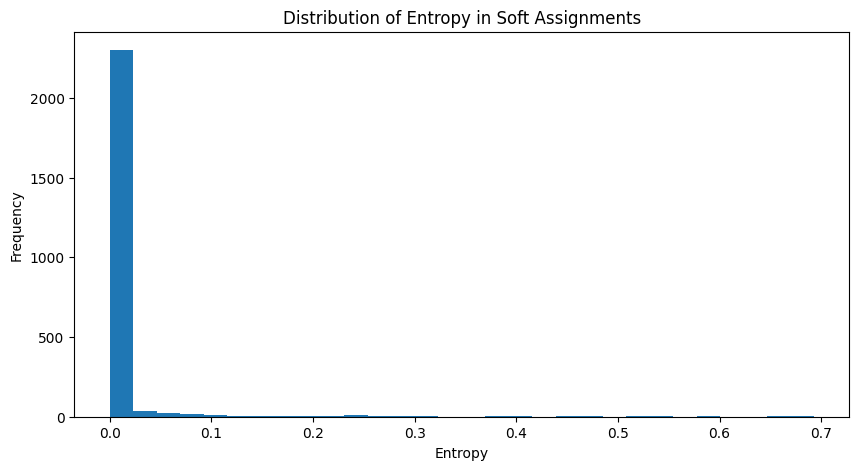

In [ ]:
from scipy.stats import entropy

ent = entropy(soft_probs.T)
plt.figure(figsize=(10, 5))
plt.hist(ent, bins=30)
plt.title("Distribution of Entropy in Soft Assignments")
plt.xlabel("Entropy")
plt.ylabel("Frequency")
plt.show()


## KMeans

In [ ]:
k_copy = data.copy()

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, silhouette_samples
import matplotlib.pyplot as plt
import numpy as np

wcss = []
sil_scores = []

for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(k_copy)
    wcss.append(kmeans.inertia_)

    if k > 1:
        sil = silhouette_score(k_copy, labels)
        sil_scores.append(sil)
        vals = silhouette_samples(k_copy, labels)

        print(f"K={k} | Silhouette Score: {sil:.3f}")

        # 실루엣 플롯
        plt.figure(figsize=(8, 6))
        y_lower = 10
        for i in range(k):
            cluster_sil_vals = vals[labels == i]
            cluster_sil_vals.sort()
            size_cluster_i = cluster_sil_vals.shape[0]
            y_upper = y_lower + size_cluster_i

            plt.fill_betweenx(np.arange(y_lower, y_upper),
                              0, cluster_sil_vals, alpha=0.7)
            plt.text(-0.05, y_lower + 0.5 * size_cluster_i, f"Cluster {i}")
            y_lower = y_upper + 10

        plt.axvline(sil, color="red", linestyle="--", label=f'Avg: {sil:.2f}')
        plt.title(f"Silhouette Plot for k={k}")
        plt.xlabel("Silhouette Coefficient")
        plt.ylabel("Samples")
        plt.legend()
        plt.show()

    else:
        print(f"K={k} | Silhouette Score: N/A (only one cluster)")

# Elbow Plot
plt.figure(figsize=(8, 5))
plt.plot(range(1, 11), wcss, marker='o')
plt.title("Elbow Method (WCSS vs k)")
plt.xlabel("Number of Clusters (k)")
plt.ylabel("WCSS (Inertia)")
plt.xticks(range(1, 11))
plt.grid(True)
plt.show()

# Silhouette Score Plot
plt.figure()
plt.plot(range(2, 11), sil_scores, marker='s', color='green')
plt.title("Silhouette Score vs k")
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Score")
plt.show()


In [ ]:
# X_scaled = RobustScaler().fit_transform(k_copy)
X_scaled = k_copy

pca = PCA(n_components= 2)
X_pca = pca.fit_transform(X_scaled)

kmeans = KMeans(n_clusters= 3, random_state= 42)
kmeans_labels = kmeans.fit_predict(X_pca)

sil_kmeans = silhouette_score(X_pca, kmeans_labels)
print(f"KMeans Silhouette Score: {sil_kmeans:.3f}")

pca_k = pd.DataFrame(X_pca , columns= ['PCA1' , 'PCA2'])
pca_k['cluster'] = kmeans_labels

In [ ]:
pca_k['cluster'].value_counts()

# 중간 분석
- 1. 데이터 분포가 비정규인 점 , 2. 이상치를 많이 포함한 feature가 많은 점, 3. 그 faeture들이 var(익명화) 섣불리 제거할 수 없다는 점 , 4. 데이터 수 자체가 터무니 없이 작다는 점을 고려하여 standard scale를 사용하지 않고 robust scale로 진행하여 중앙값 중심으로 군집별 특성을 알아보고자 했다.

-  하지만 이 방식(robust 스케일링)은 군집화 결과가 너무 극단적이였다. 실루엣 0.9는 군집화가 잘 되어서가 아니라 응집도가 높은 결과였고, 실루엣 0.5 정도는 군집은 안정적으로 분리되나 경계에 위치한 데이터가 대부분이라 군집간 뚜렷한 특징이 없다는 문제가 있었다.

- 따라서 여러 차례 실험하던 중 스케일링을 하지 않고 원본 데이터를 그대로 군집화를 진행했고 결과는 실루엣은 0.7- 0.8 정도지만 군집간 뚜렷한 특징과 군집 분산이 고르게 되었다는 결과를 도출하여 원본으로 군집화를 진행했다.

<br>

- 갑자기 떠올린 생각은 , 데이터의 특성을 고려하면 오히려 군집화가 썩 좋은 방식이 아니라는 점이다. 사이코패스를 알아내야 한다는 의미는 심리적/행동적 패턴이 구조적으로 다르다. 이는 값의 대소 문제가 아니라 특정 feature간 상관 구조 자체가 다르다.

- 정리하자면 극단값 자체가 중요한 문제에서 rubust 스케일을 오히려 역효과다. 군집화는 비슷한 것들끼지 묶는 방식이니까 이상치 자체가 사이코패스 집단일 수 있다는 가능성이 높다. 또한 **진짜 위험한 심리군이지만 일반인과 겉보기엔 비슷한 feature를 일부 가질 수 있다는 점을 고려해야 한다.** 이 부분은 군집화로 구별이 어렵다 판단한다.


- 데이터에 관해서도 사실 의심이 되는 점이 몇 가지 있다. 사이코패스는 전체 인구의 3%인데 이 데이터의 수집 방식이 완전 무작위인지도 의심이 되는 부분이다. 트윗,리트윗,팔로워 수 등을 중심으로 수집했다고 하는데 그럼 자극적인 글일수록 , 타인의 연민을 기대해야 하는 글 등 감정적인 글에서 수집을 했는가?이다.


<br>

- 따라서 군집화는 이 정도로 하고 이상치 탐지에 더 효과적인 오토인코더로 진행해 보겠따.

### 오토인코더 차원축소

[입력 데이터] X <br>
   ↓ <br>
Encoder: Linear → ReLU → Linear → ReLU → Linear<br>
   ↓<br>
[압축된 벡터] z  ← 차원축소 결과

   ↓<br>
Decoder: Linear → ReLU → Linear → ReLU → Linear<br>
   ↓<br>
[복원된 입력] x_recon ≈ X


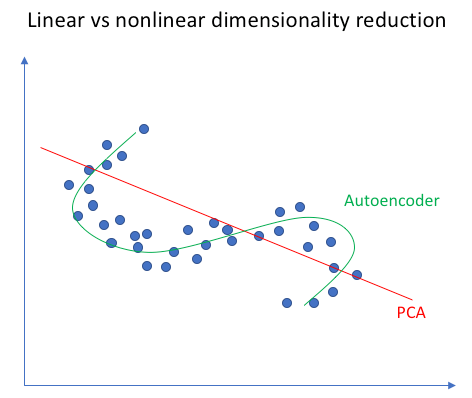

In [ ]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, TensorDataset
import numpy as np
import random

# 0. Seed 고정: 재현성
def set_seed(seed=101):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(101)

# 1. 오토인코더 정의
class Autoencoder(nn.Module):
    def __init__(self, input_dim, latent_dim):
        super().__init__()
        self.encoder = nn.Sequential(
            nn.Linear(input_dim, 64),
            nn.ReLU(),
            nn.Linear(64, 32),
            nn.ReLU(),
            nn.Linear(32, latent_dim)
        )
        self.decoder = nn.Sequential(
            nn.Linear(latent_dim, 32),
            nn.ReLU(),
            nn.Linear(32, 64),
            nn.ReLU(),
            nn.Linear(64, input_dim)
        )

    def forward(self, x):
        z = self.encoder(x)
        x_recon = self.decoder(z)
        return x_recon

# 2. 데이터 준비 – 스케일링 없이 원본 사용

auto = data.copy()
X_raw = auto.values  # DataFrame → numpy 변환
X_tensor = torch.tensor(X_raw, dtype=torch.float32)

dataset = TensorDataset(X_tensor)
loader = DataLoader(dataset, batch_size=64, shuffle=True)

# 3. 모델 초기화
model = Autoencoder(input_dim=X_tensor.shape[1], latent_dim=25) # 압축 차원 수
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)
loss_fn = nn.MSELoss()

# 4. 학습
for epoch in range(50):
    total_loss = 0
    for batch in loader:
        x = batch[0]
        x_recon = model(x)
        loss = loss_fn(x_recon, x)
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
    print(f"Epoch {epoch+1}, Loss: {total_loss:.4f}")


### latent space

In [ ]:
# 인코더만 사용해 차원 축소 결과 (25차원 벡터) 얻기
with torch.no_grad(): # 역전파 비활성 (추론 모드)
    Z = model.encoder(X_tensor).numpy()  # 차원 축소된 결과

In [ ]:
sil_scores = []
wcss = []

for k in range(2, 11):
  kmeans = KMeans(n_clusters=k, random_state=42)
  km_labels = kmeans.fit_predict(Z)
  wcss.append(kmeans.inertia_)


  auto_km_score = silhouette_score(Z, km_labels)
  sil_scores.append(auto_km_score)
  vals = silhouette_samples(Z, km_labels)
  print(f"K={k} | Silhouette Score: {sil:.3f}")

  plt.figure(figsize=(8, 6))
  y_lower = 10

  for i in range(k):
    cluster_sil_vals = vals[km_labels == i]
    cluster_sil_vals.sort()
    size_cluster_i = cluster_sil_vals.shape[0]
    y_upper = y_lower + size_cluster_i
    plt.fill_betweenx(np.arange(y_lower, y_upper),0, cluster_sil_vals, alpha=0.7)
    plt.text(-0.05, y_lower + 0.5 * size_cluster_i, f"Cluster {i}")
    y_lower = y_upper + 10

  plt.axvline(sil, color="red", linestyle="--", label=f'Avg: {sil:.2f}')
  plt.title(f"Silhouette Plot for k={k}")
  plt.xlabel("Silhouette Coefficient")
  plt.ylabel("Samples")
  plt.legend()
  plt.show()


# Elbow Plot
plt.figure(figsize=(8, 5))
plt.plot(range(2, 11), wcss, marker='o')
plt.title("Elbow Method (WCSS vs k)")
plt.xlabel("Number of Clusters (k)")
plt.ylabel("WCSS (Inertia)")
plt.xticks(range(1, 11))
plt.grid(True)
plt.show()

# Silhouette Score Plot
plt.figure()
plt.plot(range(2, 11), sil_scores, marker='s', color='green')
plt.title("Silhouette Score vs k")
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Score")
plt.show()


  # auto_km_score = silhouette_score(Z, km_labels)
  # auto_km_counts = Counter(km_labels)

  # print(f" 군집 수 {k} : {auto_km_score:.2f} : {auto_km_counts}")

In [ ]:
kmeans_4 = KMeans(n_clusters = 4 , random_state= 42)
k_labels_4 = kmeans_4.fit_predict(Z)

auto_km_3_score = silhouette_score(Z ,k_labels_4)
auto_km_3_counts = Counter(k_labels_4)

print(auto_km_3_score)
print(auto_km_3_counts)

In [ ]:
# Z_2_2d = PCA(n_components=2).fit_transform(Z)
Z_2_2d = TSNE(n_components=2, random_state=42).fit_transform(Z)


plt.figure(figsize=(8,6))
sns.scatterplot(x=Z_2_2d[:, 0], y=Z_2_2d[:, 1], hue= k_labels_4, palette='Set2', s=80)
plt.title("Autoencoder → AC 군집 결과 시각화")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.legend(title="Cluster")
plt.tight_layout()
plt.show()

In [ ]:
gmm = GaussianMixture(n_components= 2)
gmm.fit(Z)

gmm_labels = gmm.predict(Z)

In [ ]:
auto_gmm_score = silhouette_score(Z, gmm_labels)
auto_gmm_counts = Counter(gmm_labels)
print(f"{auto_gmm_score:.2f}")
print(auto_gmm_counts)

In [ ]:
# AIC/BIC

In [ ]:
for a in range(2,10):
  Ac = AgglomerativeClustering(n_clusters = a,linkage='complete')
  AC_labels = Ac.fit_predict(Z)

  auto_ac_score = silhouette_score(Z, AC_labels)
  AC_counts = Counter(AC_labels)

  print(f"군집 수 {a} 실루엣 {auto_ac_score:.2f} 군집분포 {AC_counts}")

In [ ]:
sil_vals = silhouette_samples(Z, AC_labels)

y_lower = 10
for i in np.unique(AC_labels):
    ith_vals = sil_vals[AC_labels == i]
    ith_vals.sort()
    size = ith_vals.shape[0]
    y_upper = y_lower + size
    plt.fill_betweenx(np.arange(y_lower, y_upper), 0, ith_vals)
    plt.text(-0.05, y_lower + 0.5 * size, str(i))
    y_lower = y_upper + 10
plt.axvline(x=np.mean(sil_vals), color="red", linestyle="--")
plt.title("Silhouette Score per Sample")
plt.xlabel("Silhouette Score")
plt.ylabel("Cluster")
plt.show()


In [ ]:
Z_2d = TSNE(n_components=2 , random_state= 42).fit_transform(Z)

plt.figure(figsize=(8,6))
sns.scatterplot(x=Z_2d[:, 0], y=Z_2d[:, 1], hue=AC_labels, palette='Set2', s=80)
plt.title("Autoencoder latent → AC 군집 결과 시각화")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.legend(title="Cluster")
plt.tight_layout()
plt.show()

# 재군집

1. 일반 군집화 기반 재군집
  - AC 결과값 사용
2. 오토 인코더 latent space 기반 재군집
  - k- means 결과값 사용
  <br>
  : 주어진 정보와(3%가 사이코패스) 가장 근접하게 분리했기 때문이다.
  
  *하지만 주어진 정보가 없었다면 나는 무엇을 선택해야 했을까?*

In [ ]:
silhouette_vals = silhouette_samples(x_pca , ac_labels)

In [ ]:
# 상위 1% 극단점

high_outliers = np.where(silhouette_vals > np.percentile(silhouette_vals, 99))[0]
print(high_outliers)

In [ ]:
data.iloc[high_outliers].describe()

In [ ]:
X_tsne = TSNE(n_components=2 ,random_state = 42).fit_transform(data)
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=labels, alpha=0.5)

# 상위 1% 표시
plt.scatter(X_tsne[high_outliers, 0], X_tsne[high_outliers, 1],
            c='red', edgecolors='black', s=100, label='High Silhouette Outliers')
plt.legend()
plt.title("Silhouette Outliers (High Score)")
plt.show()

In [ ]:
# 하위 5% 극단점
low_outliers = np.where(silhouette_vals < np.percentile(silhouette_vals , 5))[0]
print(low_outliers)


In [ ]:
X_umap = TSNE(n_components=2 ,random_state= 42).fit_transform(data)
plt.scatter(X_umap[:, 0], X_umap[:, 1], c=labels, alpha=0.5)

# 하위 5% 이상치 표시
plt.scatter(X_umap[low_outliers, 0], X_umap[low_outliers, 1],
            c='red', edgecolors='black', s=100, label='Low Silhouette Outliers')
plt.legend()
plt.title("Silhouette Outliers (Low Score)")
plt.show()

In [ ]:
data.iloc[low_outliers].describe()

In [ ]:
low_scores = silhouette_vals[low_outliers]
low_mean = np.mean(low_scores)

print(f"하위 5% 실루엣 평균 점수: {low_mean:.4f}")


### 하위 5% 재군집화

In [ ]:
low_sil_mask = silhouette_vals <= 0.1
X_low = x_pca[low_sil_mask] # pca 축소된 공간에서 추출

In [ ]:
ac_low = AgglomerativeClustering(n_clusters=2, linkage='complete')
labels_low = ac_low.fit_predict(X_low)

In [ ]:
sil_score_low = silhouette_score(X_low , labels_low)
sil_low_counts = Counter(labels_low)
print(f"{sil_score_low:.2f}")
print(sil_low_counts)

In [ ]:
sns.scatterplot(x=X_low[:,0], y=X_low[:,1], hue=labels_low, palette='Set2')
plt.title("PCA 기반 실루엣 낮은 샘플 재군집화 결과")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.show()


anova 분석

In [ ]:
X_raw_low = data[low_sil_mask]
y_labels_low = labels_low

feature_names_raw = X_raw_low.columns  # 또는 list(X_raw_low.columns)


F_vals, p_vals = f_classif(X_raw_low, y_labels_low)


# 결과 정리
importance = pd.DataFrame({
    'Feature': feature_names_raw,
    'F_score': F_vals,
    'p_value': p_vals
}).sort_values(by='F_score', ascending=False)

# 출력 옵션
pd.set_option('display.max_rows', None)
pd.options.display.float_format = '{:.5f}'.format

# 출력
display(importance)

### 하위 5% 뺀 정상그룹 재군집화

In [ ]:
normal_sil_mask = silhouette_vals > 0.1
X_nor = x_pca[normal_sil_mask] # pca 축소된 공간에서 추출

In [ ]:
# for k in range(2, 10):
ac_nor = AgglomerativeClustering(n_clusters = 3 , linkage= 'ward')
labels_nor = ac_nor.fit_predict(X_nor)

sil_score_nor = silhouette_score(X_nor , labels_nor)
sil_nor_counts = Counter(labels_nor)
print(f"이상치 제거 후 실루엣 {sil_score_nor:.2f}")
print(f"군집 분포 {sil_nor_counts}")

In [ ]:
import plotly.express as px
import pandas as pd

df_plot = pd.DataFrame(X_nor, columns=["PC1", "PC2"])
df_plot['cluster'] = labels_nor

fig = px.scatter(df_plot, x="PC1", y="PC2", color='cluster',
                 title="PCA 기반 재군집화 결과 (인터랙티브)",
                 hover_data=["PC1", "PC2"])
fig.show()


In [ ]:
tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000)
X_tsne = tsne.fit_transform(X_nor)

# 시각화를 위한 데이터프레임 생성
df_tsne = pd.DataFrame(X_tsne, columns=["TSNE1", "TSNE2"])
df_tsne["cluster"] = labels_nor

# 시각화
plt.figure(figsize=(7, 6))
sns.scatterplot(data=df_tsne, x="TSNE1", y="TSNE2", hue="cluster", palette="Set2", alpha=0.8)
plt.title("t-SNE 기반 재군집 시각화")
plt.xlabel("TSNE1")
plt.ylabel("TSNE2")
plt.legend(title="Cluster")
plt.grid(True)
plt.tight_layout()
plt.show()

In [ ]:
from sklearn.metrics import silhouette_samples
import seaborn as sns

sil_vals = silhouette_samples(X_nor, labels_nor)

df_sil = pd.DataFrame({'silhouette': sil_vals, 'cluster': labels_nor})
plt.figure(figsize=(6,4))
sns.boxplot(data=df_sil, x='cluster', y='silhouette', palette='Set2')
plt.title("군집별 실루엣 점수 분포")
plt.show()


In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import pairwise_distances

# 거리 행렬 계산
dist_matrix = pairwise_distances(X_nor)

# 행렬을 군집 순서로 정렬
sorted_idx = np.argsort(labels_nor)
sorted_dist = dist_matrix[sorted_idx][:, sorted_idx]

plt.figure(figsize=(8, 6))
sns.heatmap(sorted_dist, cmap="viridis")
plt.title("군집 순서로 정렬된 샘플 간 거리 히트맵")
plt.show()


In [ ]:
df_nor = pd.DataFrame(X_nor, columns=['PC1', 'PC2'])
df_nor['cluster'] = labels_nor

plt.figure(figsize=(8, 5))
sns.kdeplot(data=df_nor, x='PC1', hue='cluster', fill=True, alpha=0.4)
plt.title("PC1 축에서 군집별 밀도 분포")
plt.show()


anova 분석

In [ ]:
X_raw_nor = data[normal_sil_mask]
y_labels_nor = labels_nor
feature_names_nor = X_raw_nor.columns

F_vals, p_vals = f_classif(X_raw_nor, y_labels_nor)


importance = pd.DataFrame({
    'Feature': feature_names_nor,
    'F_score': F_vals,
    'p_value': p_vals
}).sort_values(by='F_score', ascending=False)

# 출력 옵션
pd.set_option('display.max_rows', None)
pd.options.display.float_format = '{:.5f}'.format

# 출력
display(importance)


유의미한 결과이다.

분석 방향
- 이상치군 vs 정상군 비교
- 재군집된 이상치군 샘플들 특성 분석

### 하위 5% vs 정상군 비교

In [ ]:
outlier_idx = np.where(silhouette_vals <= 0.1)[0]
normal_idx = np.where(silhouette_vals > 0.1)[0]

# 분리

df_normal = data.iloc[normal_idx].copy()
df_outlier = data.iloc[outlier_idx].copy()


#
df_normal['cluster']  = labels_nor
df_outlier['cluster'] = labels_low


In [ ]:
normal_summary_df = df_normal.groupby('cluster').median()
out_summary_df = df_outlier.groupby('cluster').median()

summary_normal =  normal_summary_df
summary_outlier = out_summary_df

# 열 이름 변경해서 구분
summary_normal.columns = [f"정상_{col}" for col in summary_normal.columns]
summary_outlier.columns = [f"이상_{col}" for col in summary_outlier.columns]

# 변수 기준으로 병합
combined = pd.concat([summary_normal, summary_outlier], axis=1)

# 히트맵 그리기
plt.figure(figsize=(12, 14))
sns.heatmap(combined,
            annot=True,
            fmt=".2f",
            cmap='coolwarm',
            linewidths=0.5,
            cbar_kws={'label': 'Median Value'},
            annot_kws={"size": 8})
plt.title("정상 vs 이상 군집별 변수 중앙값 비교 히트맵", fontsize=14)
plt.ylabel("Feature", fontsize=12)
plt.xlabel("Cluster", fontsize=12)
plt.xticks(fontsize=10, rotation=45)
plt.yticks(fontsize=8, rotation=0)
plt.tight_layout()
plt.show()


In [ ]:
# def plot_radar(df_outlier, cluster_id):
#     labels = df_outlier.index
#     stats = df_outlier[cluster_id].values

#     angles = np.linspace(0, 2 * np.pi, len(labels), endpoint=False).tolist()
#     stats = np.concatenate((stats, [stats[0]]))
#     angles += angles[:1]

#     fig, ax = plt.subplots(figsize=(6,6), subplot_kw=dict(polar=True))

#     # 그리드 간격 조정
#     ax.set_rlabel_position(0)
#     ax.set_theta_offset(np.pi / 2)  # 위쪽부터 시작
#     ax.set_theta_direction(-1)

#     ax.set_ylim(0, max(stats) * 1.1)
#     ax.set_yticks(np.linspace(0, max(stats), 5))
#     ax.set_yticklabels([f"{y:.0f}" for y in np.linspace(0, max(stats), 5)], fontsize=9)

#     ax.plot(angles, stats, 'o-', linewidth=2, label=f'Cluster {cluster_id}')
#     ax.fill(angles, stats, alpha=0.25)

#     ax.set_thetagrids(np.degrees(angles[:-1]), labels ,fontsize = 11)

#     ax.set_title(f'Radar Chart - Out Cluster {cluster_id}', fontsize = 13 , pad = 20)
#     plt.legend(loc='upper right' , bbox_to_anchor= (1.2 , 1.1))
#     plt.tight_layout()
#     plt.show()

# radar_data = out_summary_df.head(8)
# for c in radar_data.columns:
#     plot_radar(radar_data, c)


In [ ]:
features = ['openness', 'extraversion', 'narcissism', 'psychopathy', 'conscientiousness' , 'machiavellianism','neuroticism','agreeableness']


clusters_normal = df_normal['cluster'].unique().tolist()
clusters_outlier = df_outlier['cluster'].unique().tolist()

# 평균 데이터
normal_data_mean = df_normal[df_normal['cluster'].isin(clusters_normal)].groupby('cluster')[features].mean().T
outlier_data_mean = df_outlier[df_outlier['cluster'].isin(clusters_outlier)].groupby('cluster')[features].mean().T

# 중앙값 데이터
normal_data_median = df_normal[df_normal['cluster'].isin(clusters_normal)].groupby('cluster')[features].median().T
outlier_data_median = df_outlier[df_outlier['cluster'].isin(clusters_outlier)].groupby('cluster')[features].median().T

def plot_radar_mean(normal_data, outlier_data, title= "OUT vs NOR mean rader"):
    categories = normal_data.index.tolist()
    num_vars = len(categories)
    angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
    angles += angles[:1]

    fig, ax = plt.subplots(figsize=(10, 6), subplot_kw=dict(polar=True))

    for col in normal_data.columns:
        values = normal_data[col].tolist()
        values += values[:1]
        ax.plot(angles, values, label=f'Normal {col}', linestyle='solid')
        ax.fill(angles, values, alpha=0.1)

    for col in outlier_data.columns:
        values = outlier_data[col].tolist()
        values += values[:1]
        ax.plot(angles, values, label=f'Outlier {col}', linestyle='dashed')
        ax.fill(angles, values, alpha=0.1)

    ax.set_theta_offset(np.pi / 2)
    ax.set_theta_direction(-1)
    ax.set_thetagrids(np.degrees(angles[:-1]), categories)
    ax.set_title(title, size=16, pad=30)
    ax.legend(loc='upper right', bbox_to_anchor=(1.2, 1.1))
    plt.tight_layout()
    plt.show()

def plot_radar_median(normal_data, outlier_data, title= "OUT vs NOR medain rader"):
    categories = normal_data.index.tolist()
    num_vars = len(categories)
    angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()
    angles += angles[:1]

    fig, ax = plt.subplots(figsize=(10, 6), subplot_kw=dict(polar=True))

    for col in normal_data.columns:
        values = normal_data[col].tolist()
        values += values[:1]
        ax.plot(angles, values, label=f'Normal {col}', linestyle='solid')
        ax.fill(angles, values, alpha=0.1)

    for col in outlier_data.columns:
        values = outlier_data[col].tolist()
        values += values[:1]
        ax.plot(angles, values, label=f'Outlier {col}', linestyle='dashed')
        ax.fill(angles, values, alpha=0.1)

    ax.set_theta_offset(np.pi / 2)
    ax.set_theta_direction(-1)
    ax.set_thetagrids(np.degrees(angles[:-1]), categories)
    ax.set_title(title, size=16, pad=30)
    ax.legend(loc='upper right', bbox_to_anchor=(1.2, 1.1))
    plt.tight_layout()
    plt.show()




# 실행
plot_radar_mean(normal_data_mean, outlier_data_mean)
plot_radar_median(normal_data_median, outlier_data_median)



In [ ]:
def plot_bar(normal_data_mean, outlier_data_mean):
    fig, axes = plt.subplots(2, 1, figsize=(12, 8), sharex=True)

    normal_data_mean.plot(kind='bar', ax=axes[0])
    axes[0].set_title('Normal Clusters - Mean Values')
    axes[0].legend(title="Cluster")

    outlier_data_mean.plot(kind='bar', ax=axes[1], colormap='Set2')
    axes[1].set_title('Outlier Clusters - Mean Values')
    axes[1].legend(title="Cluster")

    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

plot_bar(normal_data_mean, outlier_data_mean)


In [ ]:
def plot_heatmaps(normal_data_median, outlier_data_median):
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    sns.heatmap(normal_data_median, cmap="Blues", annot=True, ax=axes[0])
    axes[0].set_title("Normal Clusters")

    sns.heatmap(outlier_data_median, cmap="Reds", annot=True, ax=axes[1])
    axes[1].set_title("Outlier Clusters")

    plt.tight_layout()
    plt.show()

plot_heatmaps(normal_data_median, outlier_data_median)


In [ ]:
def plot_line(normal_data_median, outlier_data_median):
    plt.figure(figsize=(12, 6))

    for col in normal_data_median.columns:
        plt.plot(normal_data_median.index, normal_data_median[col], marker='o', label=f'Normal {col}')
    for col in outlier_data_median.columns:
        plt.plot(outlier_data_median.index, outlier_data_median[col], marker='x', linestyle='--', label=f'Outlier {col}')

    plt.title("Cluster Comparison Median- Line Chart")
    plt.xticks(rotation=45)
    plt.ylabel("Score")
    plt.legend()
    plt.tight_layout()
    plt.show()
plot_line(normal_data_median, outlier_data_mean)


def plot_line(normal_data_mean, outlier_data_mean):
    plt.figure(figsize=(12, 6))

    for col in normal_data_mean.columns:
        plt.plot(normal_data_mean.index, normal_data_mean[col], marker='o', label=f'Normal {col}')
    for col in outlier_data_mean.columns:
        plt.plot(outlier_data_mean.index, outlier_data_mean[col], marker='x', linestyle='--', label=f'Outlier {col}')

    plt.title("Cluster Comparison Mean - Line Chart")
    plt.xticks(rotation=45)
    plt.ylabel("Score")
    plt.legend()
    plt.tight_layout()
    plt.show()

plot_line(normal_data_mean, outlier_data_mean)



def plot_line(normal_data_mean, normal_data_median):
    plt.figure(figsize=(12, 6))

    for col in normal_data_mean.columns:
        plt.plot(normal_data_mean.index, normal_data_mean[col], marker='o', label=f'Mean {col}')
    for col in normal_data_median.columns:
        plt.plot(normal_data_median.index, normal_data_median[col], marker='x', linestyle='--', label=f'Median {col}')

    plt.title("Normal Mean vs Median - Line Chart")
    plt.xticks(rotation=45)
    plt.ylabel("Score")
    plt.legend()
    plt.tight_layout()
    plt.show()

plot_line(normal_data_mean, normal_data_median)



def plot_line(outlier_data_mean, outlier_data_median):
    plt.figure(figsize=(12, 6))

    for col in outlier_data_mean.columns:
        plt.plot(outlier_data_mean.index, outlier_data_mean[col], marker='o', label=f'Mean {col}')
    for col in outlier_data_median.columns:
        plt.plot(outlier_data_median.index, outlier_data_median[col], marker='x', linestyle='--', label=f'Median {col}')

    plt.title("Outlier Mean vs Median - Line Chart")
    plt.xticks(rotation=45)
    plt.ylabel("Score")
    plt.legend()
    plt.tight_layout()
    plt.show()

plot_line(outlier_data_mean, outlier_data_median)

In [ ]:
def plot_errorbar(normal_data_mean, normal_data_median, title):
    fig, ax = plt.subplots(figsize=(10, 6))
    x = np.arange(len(normal_data_mean.index))

    for i, col in enumerate(normal_data_mean.columns):
        means = normal_data_mean[col].values
        medians = normal_data_median[col].values
        ax.errorbar(x + i*0.1, medians, yerr=np.abs(means - medians), fmt='o', label=f'Cluster {col}')

    ax.set_xticks(x)
    ax.set_xticklabels(normal_data_mean.index, rotation=45)
    ax.set_title(title)
    ax.legend()
    plt.tight_layout()
    plt.show()

plot_errorbar(normal_data_mean, normal_data_median, "Normal Clusters: Median ± |Mean - Median|")


def plot_errorbar(outlier_data_mean, outlier_data_median, title):
    fig, ax = plt.subplots(figsize=(10, 6))
    x = np.arange(len(outlier_data_mean.index))

    for i, col in enumerate(outlier_data_mean.columns):
        means = outlier_data_mean[col].values
        medians = outlier_data_median[col].values
        ax.errorbar(x + i*0.1, medians, yerr=np.abs(means - medians), fmt='o', label=f'Cluster {col}')

    ax.set_xticks(x)
    ax.set_xticklabels(outlier_data_mean.index, rotation=45)
    ax.set_title(title)
    ax.legend()
    plt.tight_layout()
    plt.show()
plot_errorbar(outlier_data_mean, outlier_data_median, "Outlier Clusters: Median ± |Mean - Median|")


In [ ]:
def plot_small_multiples(normal_data_median, title_prefix):
    data_reset = normal_data_median.reset_index().melt(id_vars='index', var_name='Cluster', value_name='Value')
    data_reset.rename(columns={'index': 'feature'}, inplace=True)

    g = sns.FacetGrid(data_reset, col="Cluster", col_wrap=4, height=3.5, sharey=False)
    g.map_dataframe(sns.barplot, x='Cluster', y='Value', palette="muted")
    g.fig.subplots_adjust(top=0.9)
    g.fig.suptitle(f"{title_prefix} Feature Distributions by Cluster")
    plt.show()

plot_small_multiples(normal_data_mean, "Normal (Mean)")
plot_small_multiples(normal_data_median, "Normal (Median)")
plot_small_multiples(outlier_data_mean, "Outlier (Mean)")
plot_small_multiples(outlier_data_median, "Outlier (Median)")


실루엣이 낮다는 말은 내 군집과 다른 군집 사이의 거리가 애매하다는 말이다.(경계점에 위치)

그럼 경계점에 위치한다는 것은 데이터 값 자체가 모호했을 가능성이 높은데, 이것들을 재군집화한 것과 제거한 값들의 차이가 시각적으로 두드러진다는 점이 매우 흥미롭다.

<br>

왜 이런 결과가 나왔을까?<br>
어떻게 이런 결과가 나왔을까?

<br>



경계에 있다 != 무의미하다.

-> 기존 군집에서는 모호했지만 ,그들끼리 모이면 군집 구조가 생길 수 있다.

실제로 재군집화하면 새로운 축이 부각된다.
- 처음에는 주된 분산 방향이 강한 군집을 만든다

- 실루엣 낮은 경계 샘플은 그런 방향에서 벗어난 **다른 축(주성분)**에 따라 묶이기 쉬움




In [ ]:
# 중앙값 비교
median_diff = pd.DataFrame({
    'normal_median': df_normal.median(),
    'outlier_median': df_outlier.median(),
    'diff_median': df_normal.median() - df_outlier.median()

})

median_diff

In [ ]:
features = ['openness', 'extraversion', 'narcissism', 'psychopathy', 'conscientiousness' , 'machiavellianism','neuroticism','agreeableness']
out_scaled = df_outlier.copy()
nor_scaled = df_normal.copy()

# 정규화
out_scaled[features] = StandardScaler().fit_transform(out_scaled[features])
nor_scaled[features] = StandardScaler().fit_transform(nor_scaled[features])

# plotly 시각화
fig_1 = px.parallel_coordinates(
    out_scaled,
    dimensions=features,
    color='cluster',
    color_continuous_scale=px.colors.diverging.Tealrose,
    title=" OUT - Cluster-wise Parallel Coordinates"
)

fig_2 = px.parallel_coordinates(
    nor_scaled,
    dimensions=features,
    color='cluster',
    color_continuous_scale=px.colors.diverging.Tealrose,
    title=" NOR - Cluster-wise Parallel Coordinates"
)


fig_1.show()
fig_2.show()


In [ ]:
diff_median_features = median_diff.sort_values(by = 'diff_median' ,ascending = False).head(15)

diff_median_features.plot(kind='bar', figsize=(10, 6))
plt.title("top 15 of median_diff")
plt.ylabel("Mean Value")
plt.xticks(rotation=45)
plt.legend(title='Cluster')
plt.tight_layout()
plt.show()

In [ ]:
for c in data.columns:
  stats , p = shapiro(df_normal[c])
  result = '정규' if p > 0.05 else "비정규"
  print(f"{c}: 통계량 = {stats:.4f} ,p = {p:.4f} > {result}")

## 샤피로-월크 검정 / 맨휘트니 검정

In [ ]:
from scipy.stats import shapiro

for c in data.columns:
  stats , p = shapiro(df_outlier[c])
  result = '정규' if p > 0.05 else "비정규"
  print(f"{c}: 통계량 = {stats:.4f} ,p = {p:.4f} > {result}")

In [ ]:
result_m = []

for c in data.columns:
  stat , m = mannwhitneyu(df_normal[c] , df_outlier[c] , alternative= 'two-sided')
  result_m.append({'변수': c , 'U값' : stat , 'p-value' : m})

  result_df = pd.DataFrame(result_m)
  # 유의미한 변수만 sig_df에 저장
  sig_df = result_df[result_df['p-value'] < 0.05].sort_values(by='p-value')

sig_df

In [ ]:
results = []

for c in data.columns:
    stat, p = mannwhitneyu(df_normal[c], df_outlier[c], alternative='two-sided')
    results.append({'변수': c, 'U': stat, 'p-value': p})

result_df = pd.DataFrame(results)
result_df['해석'] = result_df['p-value'].apply(lambda x: '유의미' if x < 0.05 else '유의미 X')

# p-value 기준으로 정렬
print(result_df.sort_values(by='p-value'))


# 머신러닝

## target : labels

<Step-by-step:>

1. 정상 집단 군집화 (labels_nor)

  → LightGBM or XGBoost → SHAP → 중요한 변수 20개 추출

2. 하위 5% 재군집화 (labels_low)

  → LightGBM → SHAP → 또 다른 중요 변수 추출

3. 두 SHAP 결과 비교

  → 공통/독립 변수 시각화 (venn diagram, heatmap)


4. 공통 변수로 “통합 재군집” 또는 “병렬 모델 학습”

  → 이때 SHAP weight로 변수 가중치 조정 가능 (논문 5번)

5. 해석 가능한 의사결정 트리나 룰 생성

  → 예: “if var_12 > 0.7 and var_7 < 0.2 → outlier cluster 2”


In [ ]:
# !pip uninstall scikit-learn -y
# !pip install scikit-learn --upgrade --force-reinstall


In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report,confusion_matrix,mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
import shap
from imblearn.over_sampling import ADASYN
from imblearn.over_sampling import BorderlineSMOTE
from imblearn.over_sampling import SVMSMOTE
from sklearn.preprocessing import RobustScaler,StandardScaler,MinMaxScaler
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import GridSearchCV


In [ ]:
X_train_n , X_test_n , y_train_n , y_test_n = train_test_split(
    df_normal.drop('cluster' , axis = 1),
    df_normal['cluster'],
    random_state = 42
)


log_clf = LogisticRegression(max_iter = 500)
log_clf.fit(X_train_n , y_train_n)
y_pred = log_clf.predict(X_test_n)

print(classification_report(y_test_n , y_pred))


In [ ]:
rf_clf = RandomForestClassifier(n_estimators= 20 , random_state = 42)
rf_clf.fit(X_train_n , y_train_n)
y_pred = rf_clf.predict(X_test_n)

print(classification_report(y_test_n , y_pred))

In [ ]:
xgb_clf = XGBClassifier(use_label_encoder = False , eval_metric = 'logloss' , random_state = 42)
xgb_clf.fit(X_train_n , y_train_n)
y_pred = xgb_clf.predict(X_test_n)

print(classification_report(y_test_n , y_pred))

In [ ]:
# coef = log_clf.coef_[0]
# plt.figure(figsize=(10, 6))
# plt.barh(X_train.columns, coef)
# plt.xlabel("Coefficient Value")
# plt.title("Logistic Regression Coefficients")
# plt.gca().invert_yaxis()
# plt.tight_layout()
# plt.show()

In [ ]:
features = X_train_n.columns.tolist()
coefficients = log_clf.coef_[0]

# 데이터프레임으로 정리
coef_df = pd.DataFrame({
    'Feature': features,
    'Coefficient': coefficients
})

# 절댓값 기준 정렬 후 상위 30개 추출
top_coef_df = coef_df.reindex(coef_df.Coefficient.abs().sort_values(ascending=False).index).head(30)

# 시각화
plt.figure(figsize=(8, 10))
plt.barh(top_coef_df['Feature'], top_coef_df['Coefficient'], color='cornflowerblue')
plt.xlabel('Coefficient Value')
plt.title('NOR_Top 30 Logistic Regression Coefficients')
plt.gca().invert_yaxis()  # 값이 큰 게 위로 오도록
plt.grid(axis='x', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


In [ ]:
feature_names = X_train_n.columns.tolist()
importances = rf_clf.feature_importances_
indices = np.argsort(importances)[::-1]

# 상위 20개 feature 시각화
top_n = 20
top_features = [feature_names[i] for i in indices[:top_n]]
top_importances = importances[indices[:top_n]]

plt.figure(figsize=(10, 6))
plt.barh(range(top_n), top_importances[::-1], align='center')
plt.yticks(range(top_n), top_features[::-1], fontsize=10)
plt.xlabel("Feature Importance", fontsize=12)
plt.title("NOR_Top 20 Feature Importances (Random Forest)", fontsize=14)
plt.tight_layout()
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.show()


In [ ]:
# SHAP 값 계산
explainer = shap.TreeExplainer(rf_clf)
shap_values = explainer.shap_values(X_test_n)

# SHAP Summary Plot
shap.summary_plot(shap_values[:, :, 0], X_test_n, show=True)
shap.summary_plot(shap_values[:, :, 1], X_test_n, show=True)

shap.summary_plot(shap_values[:,:,0], X_test_n, plot_type="bar")
shap.summary_plot(shap_values[:,:,1], X_test_n, plot_type="bar")

In [ ]:
# SHAP 값 계산
explainer = shap.TreeExplainer(xgb_clf)
shap_values = explainer.shap_values(X_test_n)

# SHAP Summary Plot
shap.summary_plot(shap_values, X_test_n, show=True)
shap.summary_plot(shap_values, X_test_n, plot_type="bar")

In [ ]:
X_train_o , X_test_o , y_train_o , y_test_o = train_test_split(
    df_outlier.drop('cluster' , axis = 1),
    df_outlier['cluster'],
    random_state = 42
)


out_log_clf = LogisticRegression(max_iter = 1000)
out_log_clf.fit(X_train_o , y_train_o)
y_pred_o = out_log_clf.predict(X_test_o)

print(classification_report(y_test_o , y_pred_o))


              precision    recall  f1-score   support

           0       1.00      1.00      1.00         2
           1       1.00      1.00      1.00        12

    accuracy                           1.00        14
   macro avg       1.00      1.00      1.00        14
weighted avg       1.00      1.00      1.00        14



In [ ]:
out_rf = RandomForestClassifier(n_estimators = 20 , random_state= 42)
out_rf.fit(X_train_o , y_train_o)
y_pred = out_rf.predict(X_test_o)

print(classification_report(y_test_o , y_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00         2
           1       1.00      1.00      1.00        12

    accuracy                           1.00        14
   macro avg       1.00      1.00      1.00        14
weighted avg       1.00      1.00      1.00        14



In [ ]:
out_xgb = XGBClassifier(use_label_encoder = False , eval_metric = 'logloss' , random_state = 42)
out_xgb.fit(X_train_o , y_train_o)
y_pred = out_xgb.predict(X_test_o)

print(classification_report(y_test_o , y_pred))

              precision    recall  f1-score   support

           0       1.00      0.50      0.67         2
           1       0.92      1.00      0.96        12

    accuracy                           0.93        14
   macro avg       0.96      0.75      0.81        14
weighted avg       0.93      0.93      0.92        14



/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning:

[05:08:01] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




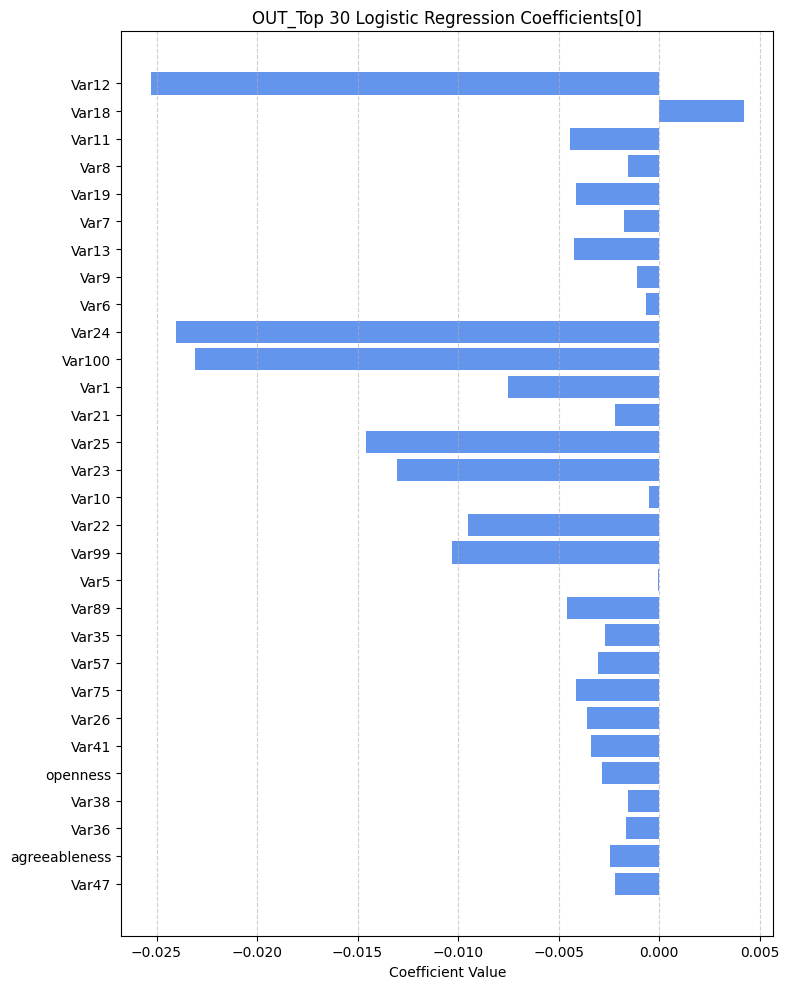

In [ ]:
# np.random.seed(42)
features = X_train_o.columns.tolist()
coefficients = out_log_clf.coef_[0]

# 데이터프레임으로 정리
out_coef_df = pd.DataFrame({
    'Feature': features,
    'Coefficient': coefficients
})

# 절댓값 기준 정렬 후 상위 30개 추출
top_coef_df = coef_df.reindex(out_coef_df.Coefficient.abs().sort_values(ascending=False).index).head(30)

# 시각화
plt.figure(figsize=(8, 10))
plt.barh(top_coef_df['Feature'], top_coef_df['Coefficient'], color='cornflowerblue')
plt.xlabel('Coefficient Value')
plt.title('OUT_Top 30 Logistic Regression Coefficients[0]')
plt.gca().invert_yaxis()  # 값이 큰 게 위로 오도록
plt.grid(axis='x', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()


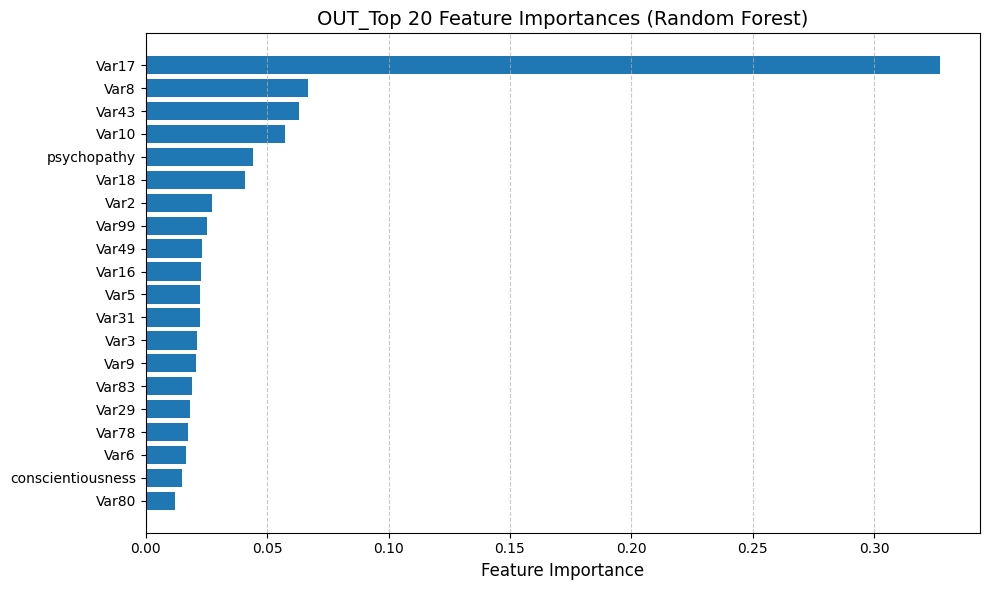

In [ ]:
feature_names = X_train_o.columns.tolist()
importances = out_rf.feature_importances_
indices = np.argsort(importances)[::-1]

# 상위 20개 feature 시각화
top_n = 20
top_features = [feature_names[i] for i in indices[:top_n]]
top_importances = importances[indices[:top_n]]

plt.figure(figsize=(10, 6))
plt.barh(range(top_n), top_importances[::-1], align='center')
plt.yticks(range(top_n), top_features[::-1], fontsize=10)
plt.xlabel("Feature Importance", fontsize=12)
plt.title("OUT_Top 20 Feature Importances (Random Forest)", fontsize=14)
plt.tight_layout()
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.show()


/tmp/ipython-input-175-2369159367.py:7: FutureWarning:

The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.



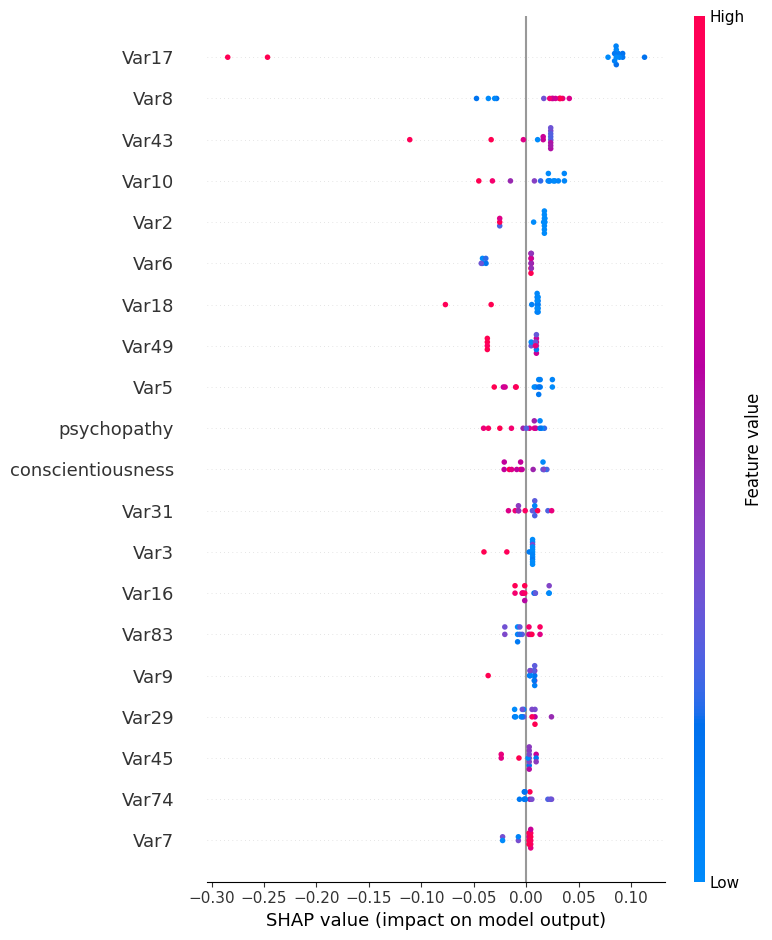

/tmp/ipython-input-175-2369159367.py:10: FutureWarning:

The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.



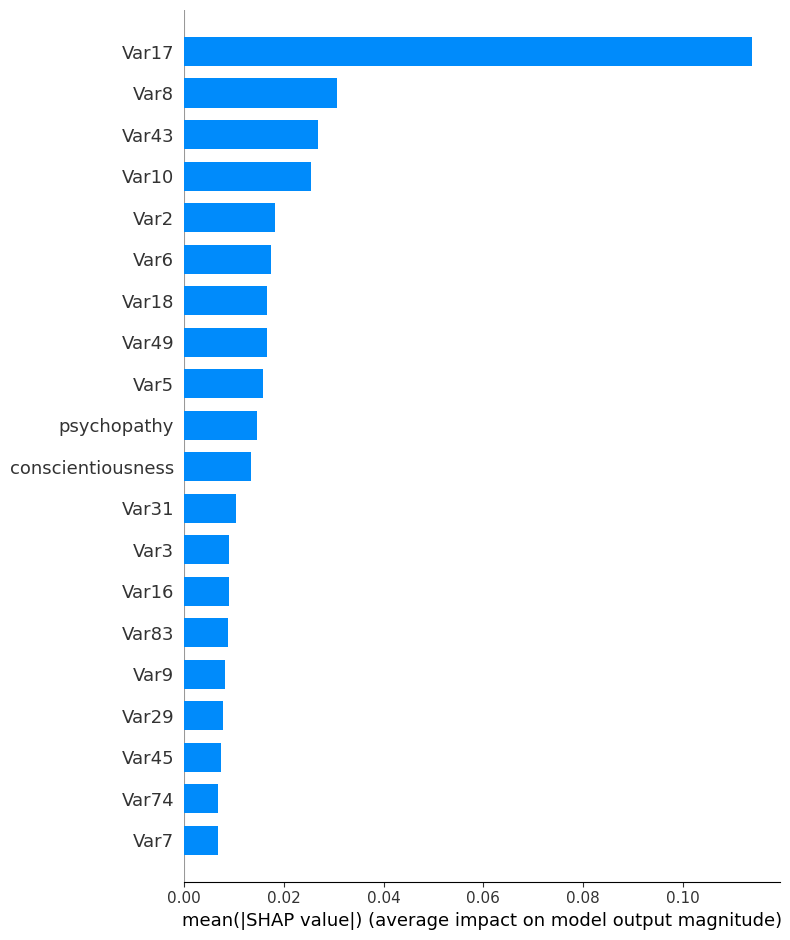

In [ ]:
# SHAP 값 계산
explainer = shap.TreeExplainer(out_rf)
o_shap_values = explainer.shap_values(X_test_o)


# SHAP Summary Plot
shap.summary_plot(o_shap_values[:, :, 1], X_test_o, show=True)
# shap.summary_plot(o_shap_values[:, :, 2], X_test_o, show=True)

shap.summary_plot(o_shap_values[:,:,1], X_test_o, plot_type="bar")
# shap.summary_plot(o_shap_values[:,:,2], X_test_o, plot_type="bar")

## target : psychpathy

In [ ]:
data['psychopathy'].value_counts().sort_index()

,count
psychopathy,
1.000000,52
1.111111,93
1.222222,127
1.333333,131
1.444444,183
1.555556,148
1.666667,164
1.777778,191
1.888889,191


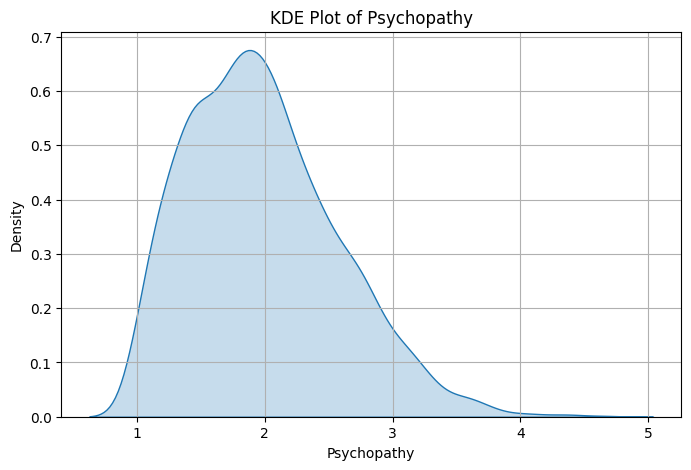

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))
sns.kdeplot(data['psychopathy'], fill=True)
plt.title('KDE Plot of Psychopathy')
plt.xlabel('Psychopathy')
plt.ylabel('Density')
plt.grid(True)
plt.show()


In [ ]:
df1 = data.copy()

In [ ]:
# psychopath 클래스 이진 분류 (전체의 2-3%)

threshold =  df1['psychopathy'].quantile(0.97)
df1['psychopathy'] = (df1['psychopathy'] >= threshold).astype(int) # 벡터화

In [ ]:
df1['psychopathy'].value_counts()

,count
psychopathy,
0,2380
1,87


In [ ]:
X_train1, X_test1 , y_train1 , y_test1  = train_test_split(
    df1.drop('psychopathy' , axis = 1),
    df1['psychopathy'],
    random_state = 42
)

### oversamlping

In [ ]:
# ADASYN : 밀도 기반
adasyn = ADASYN(random_state = 42)
X_resampled , y_resampled = adasyn.fit_resample(X_train1 , y_train1)

In [ ]:
# Borderline-SMOTE : 거리 기반
sm = BorderlineSMOTE(kind = 'borderline-1' , random_state = 42)
X_res , y_res = sm.fit_resample(X_train1 , y_train1)

In [ ]:
# SVMSMOTE : SVM 경계 마진
svm_smote = SVMSMOTE(random_state = 42)
X_svs , y_svs = svm_smote.fit_resample(X_train1 , y_train1)


### scaled

In [ ]:
# 스케일링
robust = RobustScaler()
X_scale  = robust.fit_transform(X_svs)
X_test_scale = robust.fit_transform(X_test1)

### modeling - 분류

In [ ]:
knn = KNeighborsClassifier(n_neighbors= 5)

knn.fit(X_scale , y_svs)
y_kpred = knn.predict(X_test_scale)

print(classification_report(y_test1 , y_kpred))

              precision    recall  f1-score   support

           0       0.97      0.61      0.75       597
           1       0.03      0.40      0.06        20

    accuracy                           0.60       617
   macro avg       0.50      0.51      0.41       617
weighted avg       0.94      0.60      0.73       617



In [ ]:
param_grid = {
    'C': [0.1, 1, 10],
    'gamma': [0.01, 0.1, 1]
}

svc = GridSearchCV(SVC(kernel = 'rbf') ,param_grid, cv = 5)

svc.fit(X_scale , y_svs)
y_spred = svc.predict(X_test_scale)

print(confusion_matrix(y_test1, y_spred))
print(classification_report(y_test1 , y_spred))

[[597   0]
 [ 20   0]]
              precision    recall  f1-score   support

           0       0.97      1.00      0.98       597
           1       0.00      0.00      0.00        20

    accuracy                           0.97       617
   macro avg       0.48      0.50      0.49       617
weighted avg       0.94      0.97      0.95       617



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [ ]:
mlp = MLPClassifier(hidden_layer_sizes=(300,50),
                    early_stopping=True,
                    validation_fraction = 0.1,
                    activation = 'relu',
                    solver = 'adam',
                    max_iter = 500,
                    random_state = 42,
                    )

mlp.fit(X_scale , y_svs)
y_mpred = mlp.predict (X_test_scale)

print(confusion_matrix(y_test1, y_mpred))
print(classification_report(y_test1, y_mpred))

[[548  49]
 [ 11   9]]
              precision    recall  f1-score   support

           0       0.98      0.92      0.95       597
           1       0.16      0.45      0.23        20

    accuracy                           0.90       617
   macro avg       0.57      0.68      0.59       617
weighted avg       0.95      0.90      0.92       617



In [ ]:
rf = RandomForestClassifier(n_estimators= 1000 , random_state = 42)
rf.fit(X_train1 , y_train1 )
y_pred = rf.predict(X_test1)

print(classification_report(y_test1 , y_pred))

              precision    recall  f1-score   support

           0       0.97      1.00      0.98       597
           1       0.00      0.00      0.00        20

    accuracy                           0.97       617
   macro avg       0.48      0.50      0.49       617
weighted avg       0.94      0.97      0.95       617



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [ ]:
rrf = RandomForestClassifier(n_estimators= 1000 , random_state = 42)
rrf.fit(X_resampled , y_resampled)
y_Repred = rrf.predict(X_test1)

print(classification_report(y_test1 , y_Repred))

              precision    recall  f1-score   support

           0       0.97      0.99      0.98       597
           1       0.25      0.05      0.08        20

    accuracy                           0.96       617
   macro avg       0.61      0.52      0.53       617
weighted avg       0.95      0.96      0.95       617



In [ ]:
rrrf = RandomForestClassifier(n_estimators= 1000 , random_state = 42)
rrrf.fit(X_res , y_res)
y_Respred = rrrf.predict(X_test1)

print(classification_report(y_test1 , y_Respred))
## ???

              precision    recall  f1-score   support

           0       0.97      1.00      0.98       597
           1       0.00      0.00      0.00        20

    accuracy                           0.96       617
   macro avg       0.48      0.50      0.49       617
weighted avg       0.94      0.96      0.95       617



In [ ]:
xgb = XGBClassifier(use_label_encoder = False , eval_metric = 'logloss' , random_state = 42)
xgb.fit(X_train1 , y_train1)
y_pred = xgb.predict(X_test1)

print(classification_report(y_test1 , y_pred))

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning:

[05:10:04] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




              precision    recall  f1-score   support

           0       0.97      1.00      0.98       597
           1       0.00      0.00      0.00        20

    accuracy                           0.97       617
   macro avg       0.48      0.50      0.49       617
weighted avg       0.94      0.97      0.95       617



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [ ]:
xxgb = XGBClassifier(use_label_encoder = False , eval_metric = 'logloss' , random_state = 42)
xxgb.fit(X_resampled , y_resampled)
y_pred = xxgb.predict(X_test1)

print(classification_report(y_test1 , y_pred))

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning:

[05:10:04] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




              precision    recall  f1-score   support

           0       0.97      0.98      0.98       597
           1       0.25      0.15      0.19        20

    accuracy                           0.96       617
   macro avg       0.61      0.57      0.58       617
weighted avg       0.95      0.96      0.95       617



In [ ]:
xxxgb = XGBClassifier(use_label_encoder = False , eval_metric = 'logloss' , random_state = 42)
xxxgb.fit(X_res , y_res)
y_xpred = xxgb.predict(X_test1)

print(classification_report(y_test1 , y_xpred))

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning:

[05:10:05] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




              precision    recall  f1-score   support

           0       0.97      0.98      0.98       597
           1       0.25      0.15      0.19        20

    accuracy                           0.96       617
   macro avg       0.61      0.57      0.58       617
weighted avg       0.95      0.96      0.95       617



In [ ]:
sv_xgb = XGBClassifier(use_label_encoder = False , eval_metric = 'logloss' , random_state = 42)
sv_xgb.fit(X_svs , y_svs)
y_svpred = xxgb.predict(X_test1)

print(classification_report(y_test1 , y_svpred))

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning:

[05:10:06] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




              precision    recall  f1-score   support

           0       0.97      0.98      0.98       597
           1       0.25      0.15      0.19        20

    accuracy                           0.96       617
   macro avg       0.61      0.57      0.58       617
weighted avg       0.95      0.96      0.95       617



In [ ]:
ro_xgb = XGBClassifier(use_label_encoder = False , eval_metric = 'logloss' , random_state = 42)
ro_xgb.fit(X_scale , y_svs)
y_rpred = ro_xgb.predict(X_test_scale)

print(classification_report(y_test1 , y_rpred))

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning:

[05:10:07] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




              precision    recall  f1-score   support

           0       0.98      0.88      0.92       597
           1       0.10      0.40      0.16        20

    accuracy                           0.86       617
   macro avg       0.54      0.64      0.54       617
weighted avg       0.95      0.86      0.90       617



### modeling - 회귀

계획
1. 회귀용 오버 샘플링(SMOGN , GAN)
2. 스케일링
3. 회귀 모델
4. 성능 확인



In [ ]:
!pip install git+https://github.com/nickkunz/smogn.git

  Cloning https://github.com/nickkunz/smogn.git to /tmp/pip-req-build-pkhjyo4n
  Running command git clone --filter=blob:none --quiet https://github.com/nickkunz/smogn.git /tmp/pip-req-build-pkhjyo4n
  Resolved https://github.com/nickkunz/smogn.git to commit e4e5e4aca43a07ebbd1a0ed881f4de1e24abb8ed
  Preparing metadata (setup.py) ... done
  Created wheel for smogn: filename=smogn-0.1.1-py3-none-any.whl size=31239 sha256=7611b7789c0d2edb4f17bc77d343ba658cd1f4d633509af94d271b4db85df906
  Stored in directory: /tmp/pip-ephem-wheel-cache-kyi7_kwl/wheels/76/86/27/151e970eff5b6305a42b0f7dfd8a266d5014a25e377a2903bf
Successfully built smogn


In [ ]:
from xgboost import XGBRFRegressor
from sklearn.metrics import mean_squared_error , r2_score
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.linear_model import Lasso , LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, mean_squared_log_error
from sklearn.model_selection import train_test_split
from sklearn.inspection import permutation_importance
import shap
from sklearn.preprocessing import RobustScaler, StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import GridSearchCV

In [ ]:
df = data.copy()

In [ ]:
X_train, X_test , y_train , y_test = train_test_split(
    df.drop('psychopathy' , axis = 1),
    df['psychopathy'],
    random_state = 42
)

In [ ]:
xgb_reg = XGBRFRegressor(
    n_estimaters = 100,
    learning_rate = 0.1,
    max_depth = 4,
    randomm_state = 42
)

xgb_reg.fit(X_train , y_train)
y_xpred = xgb_reg.predict(X_test)


print('XGB RMSE:', np.sqrt(mean_squared_error(y_test, y_xpred)))
print('XGB R²:' , r2_score(y_test , y_xpred))

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning:

[05:10:17] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "n_estimaters", "randomm_state" } are not used.




XGB RMSE: 0.5827700051944796
XGB R²: 0.046583723511072206


In [ ]:
lasso = Lasso(alpha = 0.1)
lasso.fit(X_train , y_train)
y_lapred = lasso.predict(X_test)

print("Lasso RMSE:", mean_squared_error(y_test, y_lapred))
print("Lasso R²:", r2_score(y_test, y_lapred))

Lasso RMSE: 0.2821450970154979
Lasso R²: 0.20793524634195937


In [ ]:
lassoo = Lasso(alpha = 0.1)
lassoo.fit(X_train , y_train)
y_lpred = lassoo.predict(X_test)


print("Lasso RMSE:", mean_squared_error(y_test, y_lpred))
print("Lasso R²:", r2_score(y_test, y_lpred))

Lasso RMSE: 0.2821450970154979
Lasso R²: 0.20793524634195937


In [ ]:
L_model = LinearRegression()
L_model.fit(X_train,y_train)

LinearRegression()

In [ ]:
y_Lpred = L_model.predict(X_test)


print("LinearReg RMSE:", mean_squared_error(y_test, y_Lpred))
print("LinearReg R²:", r2_score(y_test, y_Lpred))

LinearReg RMSE: 0.24905663558089242
LinearReg R²: 0.30082434607238906


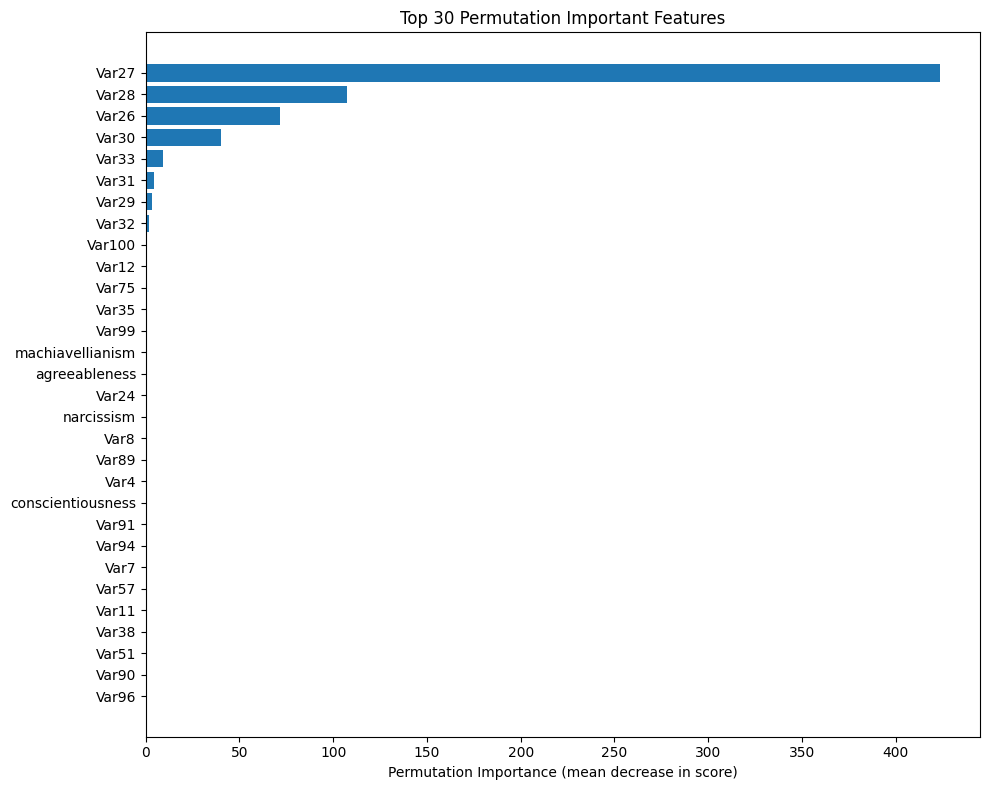

In [ ]:
# feature importance
perm = permutation_importance(L_model, X_test, y_test , n_repeats = 10)
top_idx = perm.importances_mean.argsort()[::-1][:30]

# 중요도와 feature 이름 정리
importances = perm.importances_mean[top_idx]
feature_names = X_train.columns[top_idx]

# DataFrame으로 정리 (선택)
perm_df = pd.DataFrame({
    'feature': feature_names,
    'importance': importances
}).sort_values(by='importance', ascending=True)  # barh 위해 오름차순 정렬

# 시각화
plt.figure(figsize=(10, 8))
plt.barh(perm_df['feature'], perm_df['importance'])
plt.xlabel('Permutation Importance (mean decrease in score)')
plt.title('Top 30 Permutation Important Features')
plt.tight_layout()
plt.show()

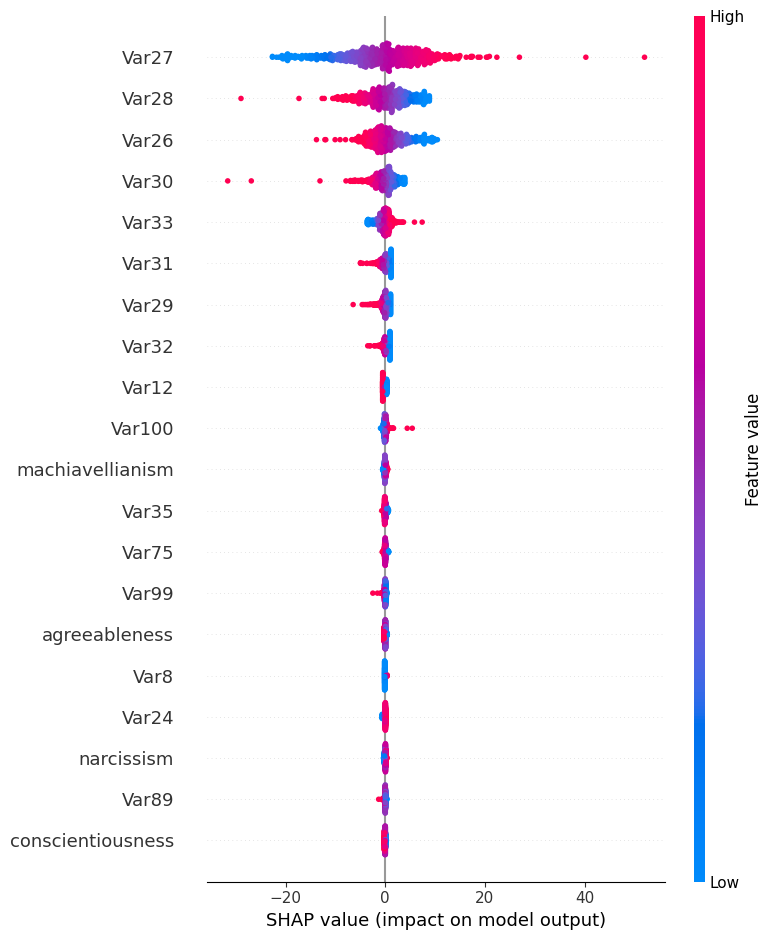

In [ ]:
# SHAP 값 계산
explainer = shap.LinearExplainer(L_model, X_train)
shap_values = explainer.shap_values(X_test)

# summary plot
shap.summary_plot(shap_values, X_test, feature_names=X_train.columns)

In [ ]:
from sklearn.ensemble import RandomForestRegressor

# X_train_scaled = RobustScaler().fit_transform(X_train)
# X_test_scaled = RobustScaler().fit_transform(X_test)


model = RandomForestRegressor(random_state=42)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)

print("RMSE:", np.sqrt(mean_squared_error(y_test, y_pred)))
print("R2:", r2_score(y_test, y_pred))


RMSE: 0.4977314404881202
R2: 0.30453011336592173


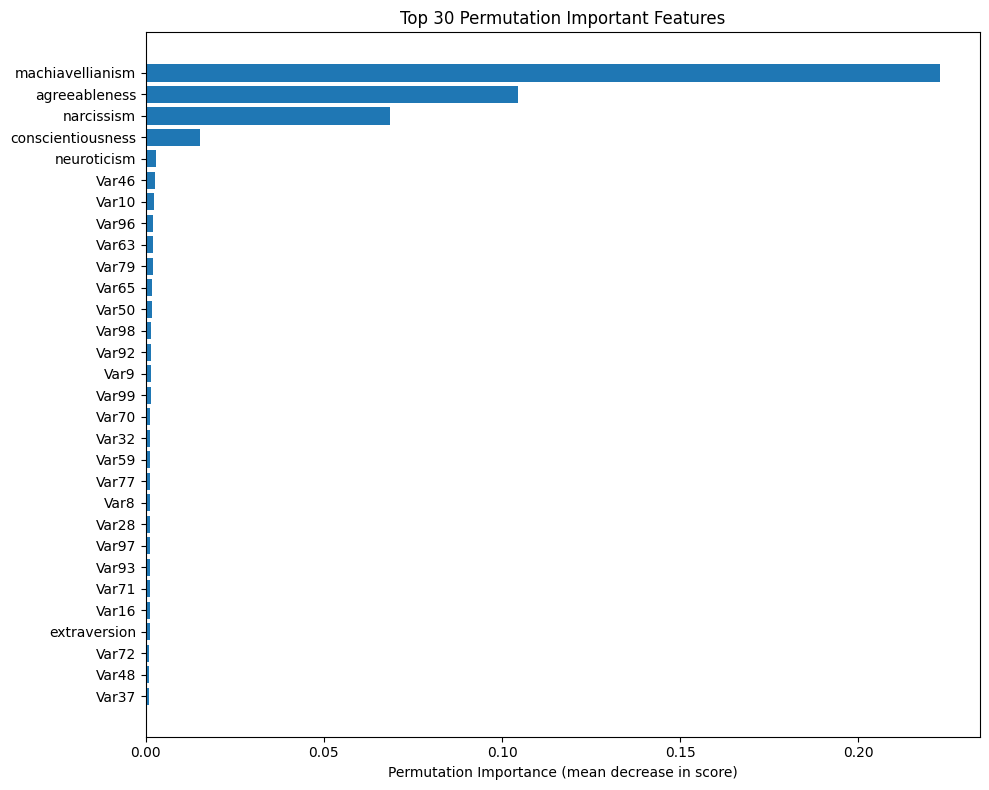

In [ ]:
# feature importance
perm = permutation_importance(model, X_test, y_test , n_repeats = 10)
top_idx = perm.importances_mean.argsort()[::-1][:30]

# 중요도와 feature 이름 정리
importances = perm.importances_mean[top_idx]
feature_names = X_train.columns[top_idx]

# DataFrame으로 정리 (선택)
perm_df = pd.DataFrame({
    'feature': feature_names,
    'importance': importances
}).sort_values(by='importance', ascending=True)  # barh 위해 오름차순 정렬

# 시각화
plt.figure(figsize=(10, 8))
plt.barh(perm_df['feature'], perm_df['importance'])
plt.xlabel('Permutation Importance (mean decrease in score)')
plt.title('Top 30 Permutation Important Features')
plt.tight_layout()
plt.show()

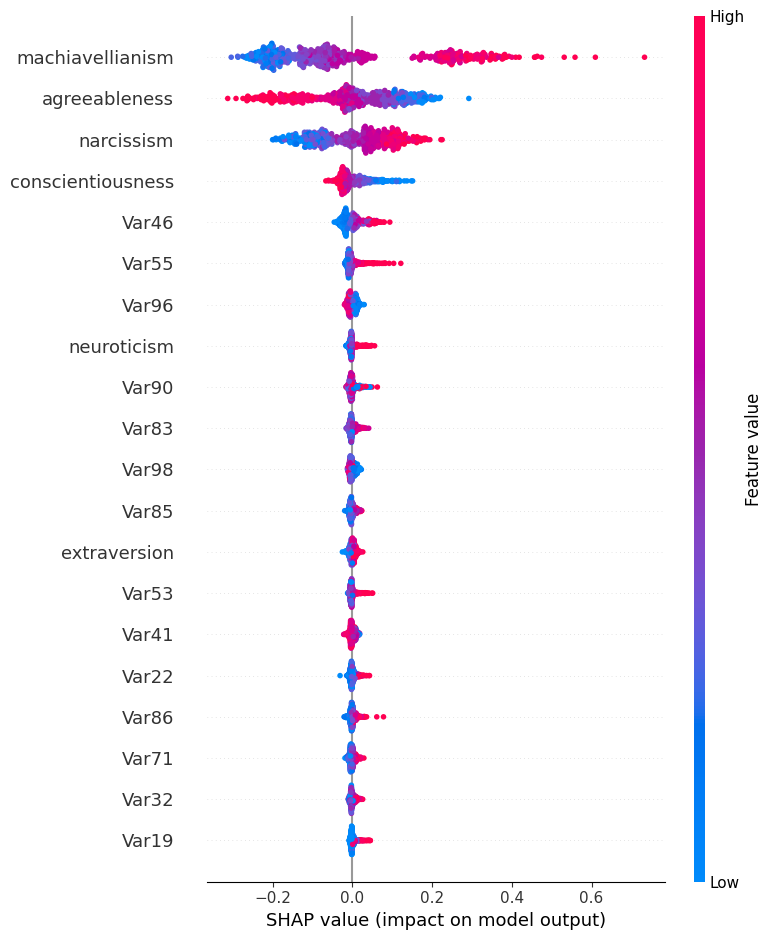

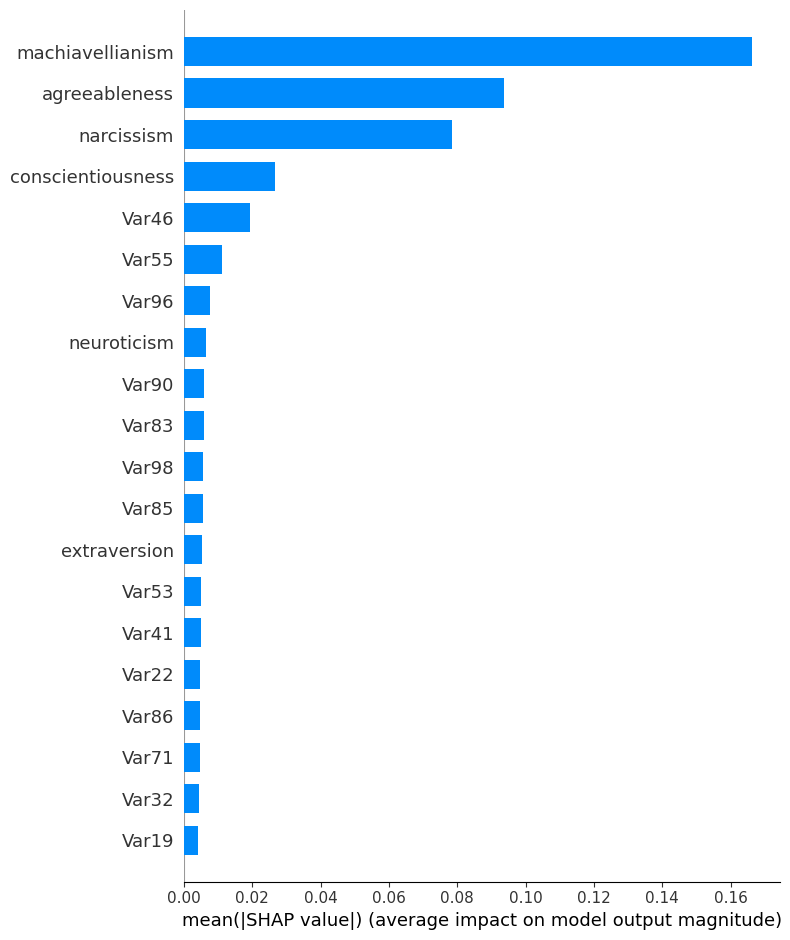

In [ ]:
# shap
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_test)


# SHAP Summary Plot
shap.summary_plot(shap_values, X_test, show=True)
shap.summary_plot(shap_values, X_test, plot_type ='bar')


In [ ]:
quantile_model = GradientBoostingRegressor(
    loss='quantile',
    alpha=0.9,               # 분위수 설정 (예: 0.9 = 상위 10% 예측)
    n_estimators=100,
    max_depth=3,
    learning_rate=0.1,
    random_state=42
)

quantile_model.fit(X_train, y_train)
y_quantile_pred = quantile_model.predict(X_test)

# 예측 결과
print("예측된 90% 분위수 값:", y_quantile_pred[:5])

예측된 90% 분위수 값: [2.2499874  2.12692647 2.93613315 2.82324081 2.20734709]


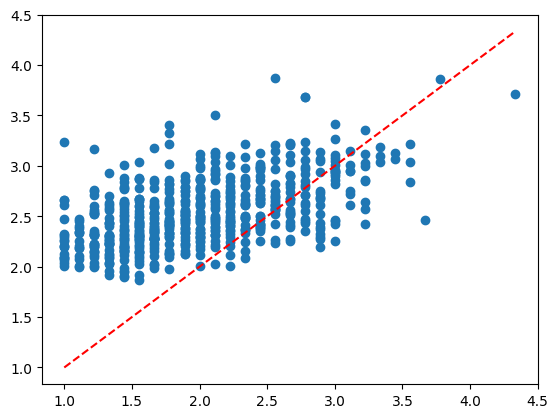

In [ ]:
plt.scatter(y_test, y_quantile_pred)  # 예측된 분위수 vs 실제값
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'r--')